In [456]:
import numpy as np   # numercal python. 수치 해석
import pandas as pd   # DataFrame을 쉽게 다루기

import matplotlib.pyplot as plt   # Data visualization
import seaborn as sns   # Data visualization
sns.set(font_scale = 2.0)   # seaborn 라이브러리 세팅 (plot의 모든 폰트 사이즈를 2.0로 지정)

import warnings 
warnings.filterwarnings('ignore')   # ignore warning

# 1. 데이터 불러오기

In [457]:
train = pd.read_csv('open/train.csv')
test = pd.read_csv('open/test.csv')

In [458]:
train.head()

,ID,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income
0,TRAIN_00000,63,M,Middle (7-8),Full-Time,4,Social Services,Services,White,All other,Married,Householder,Householder,Native,US,US,US,Nonfiler,0,0,0,Unknown,425
1,TRAIN_00001,37,M,Associates degree (Vocational),Full-Time,52,Entertainment,Services,White,All other,Separated,Nonfamily householder,Householder,Native,US,US,US,Single,0,0,0,Under Median,0
2,TRAIN_00002,58,F,High graduate,Full-Time,52,Manufacturing (Non-durable),Admin Support (include Clerical),Black,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),3411,0,0,Under Median,860
3,TRAIN_00003,44,M,High graduate,Full-Time,52,Retail,Technicians & Support,White,All other,Divorced,Nonfamily householder,Householder,Native,US,US,US,Single,0,0,0,Under Median,850
4,TRAIN_00004,37,F,High graduate,Full-Time,52,Retail,Sales,White,All other,Divorced,Householder,Householder,Native,US,US,US,Head of Household (HOH),0,0,0,Unknown,570


In [459]:
test.head()

,ID,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status
0,TEST_0000,79,M,High Junior,Children or Armed Forces,0,Not in universe or children,Unknown,White,All other,Single,Nonfamily householder,Householder,Native,US,Unknown,Unknown,Single,0,0,0,Under Median
1,TEST_0001,47,M,Elementary (5-6),Children or Armed Forces,0,Not in universe or children,Unknown,White,Other Spanish,Single,Child 18+ never marr Not in a subfamily,Child 18 or older,Native,US,US,US,Nonfiler,0,0,0,Under Median
2,TEST_0002,18,F,High Junior,Children or Armed Forces,52,Retail,Services,White,All other,Single,Child 18+ never marr Not in a subfamily,Child 18 or older,Native,US,US,US,Single,0,0,0,Under Median
3,TEST_0003,39,F,Associates degree (Vocational),Full-Time,30,Medical (except Hospitals),Services,White,All other,Married,Spouse of householder,Spouse of householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,0,Unknown
4,TEST_0004,6,M,Children,Children or Armed Forces,0,Not in universe or children,Unknown,White,Mexican-American,Single,Child <18 never marr not in subfamily,Child under 18 never married,Native,US,US,US,Nonfiler,0,0,0,Unknown


In [460]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   ID                      20000 non-null  object
 1   Age                     20000 non-null  int64 
 2   Gender                  20000 non-null  object
 3   Education_Status        20000 non-null  object
 4   Employment_Status       20000 non-null  object
 5   Working_Week (Yearly)   20000 non-null  int64 
 6   Industry_Status         20000 non-null  object
 7   Occupation_Status       20000 non-null  object
 8   Race                    20000 non-null  object
 9   Hispanic_Origin         20000 non-null  object
 10  Martial_Status          20000 non-null  object
 11  Household_Status        20000 non-null  object
 12  Household_Summary       20000 non-null  object
 13  Citizenship             20000 non-null  object
 14  Birth_Country           20000 non-null  object
 15  Bi

Age, Working_Week (Yearly), Gaines, Losses, Dividends, Income만 수치형 데이터이고 나머지는 범주형 데이터이다.  
결측치는 없다.

In [461]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   ID                      10000 non-null  object
 1   Age                     10000 non-null  int64 
 2   Gender                  10000 non-null  object
 3   Education_Status        10000 non-null  object
 4   Employment_Status       10000 non-null  object
 5   Working_Week (Yearly)   10000 non-null  int64 
 6   Industry_Status         10000 non-null  object
 7   Occupation_Status       10000 non-null  object
 8   Race                    10000 non-null  object
 9   Hispanic_Origin         10000 non-null  object
 10  Martial_Status          10000 non-null  object
 11  Household_Status        9999 non-null   object
 12  Household_Summary       10000 non-null  object
 13  Citizenship             10000 non-null  object
 14  Birth_Country           10000 non-null  object
 15  Bir

train 데이터와 비교했을 때 income 컬럼이 없다.  
결측치는 없지만, Household_Status 데이터의 개수가 하나 부족함

# 2. EDA

In [462]:
# 중복값 확인
train[train.duplicated()]

,ID,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income


In [463]:
test[test.duplicated()]

,ID,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status


중복값 없음.

## 2.1 numerical data

In [464]:
train.describe()

,Age,Working_Week (Yearly),Gains,Losses,Dividends,Income
count,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000
mean,35.632500,34.943050,383.129500,40.202150,123.451450,554.565250
std,17.994414,22.254592,4144.247487,279.182677,1206.949429,701.553155
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,7.000000,0.000000,0.000000,0.000000,0.000000
50%,34.000000,52.000000,0.000000,0.000000,0.000000,500.000000
75%,47.000000,52.000000,0.000000,0.000000,0.000000,875.000000
max,90.000000,52.000000,99999.000000,4356.000000,45000.000000,9999.000000


Gains, Losses, Dividends에 이상치가 있어보인다.

### Age

In [465]:
train['Age'].describe()

count    20000.000000
mean        35.632500
std         17.994414
min          0.000000
25%         23.000000
50%         34.000000
75%         47.000000
max         90.000000
Name: Age, dtype: float64

기술통계를 보면 평균값과 중앙값이 거의 일치한다. 데이터 분포가 매우 고르게 되어 있는 듯.

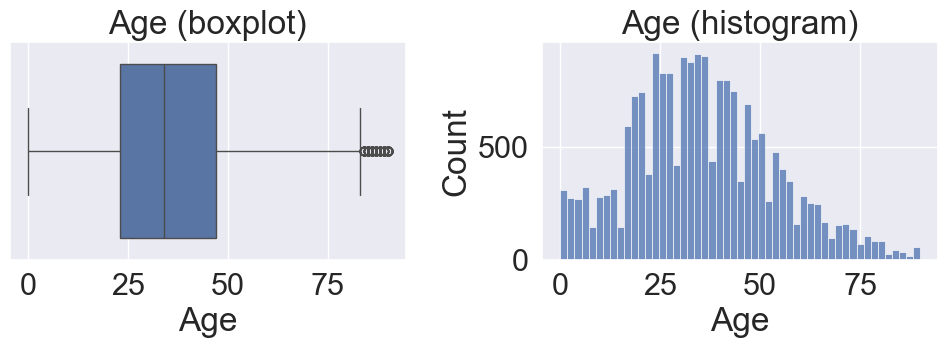

In [466]:
f, ax = plt.subplots(1, 2, figsize=(10, 4))

sns.boxplot(x='Age', data=train, ax=ax[0])
ax[0].set_title('Age (boxplot)')

sns.histplot(x='Age', data=train, ax=ax[1])
ax[1].set_title('Age (histogram)')
plt.tight_layout()

### Working_Week (Yearly)

In [467]:
train['Working_Week (Yearly)'].describe()

count    20000.000000
mean        34.943050
std         22.254592
min          0.000000
25%          7.000000
50%         52.000000
75%         52.000000
max         52.000000
Name: Working_Week (Yearly), dtype: float64

50% 이상의 사람들이 1년 내내 일한다.

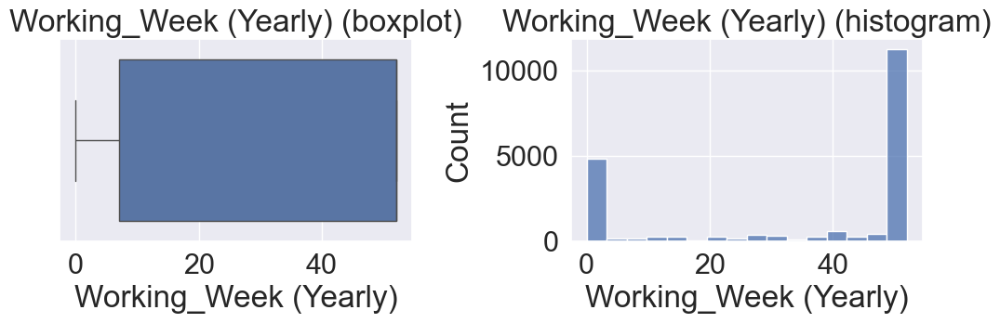

In [468]:
f, ax = plt.subplots(1, 2, figsize=(10, 4))

sns.boxplot(x='Working_Week (Yearly)', data=train, ax=ax[0])
ax[0].set_title('Working_Week (Yearly) (boxplot)')

sns.histplot(x='Working_Week (Yearly)', data=train, ax=ax[1])
ax[1].set_title('Working_Week (Yearly) (histogram)')
plt.tight_layout()

매우 극단적으로 분포되어 있는 것을 확인할 수 있음.

In [469]:
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)

categorical_columns = train.select_dtypes(include=['object'])
filtered_rows = train[train['Working_Week (Yearly)'] == 0]
filtered_rows.head(10)

,ID,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income
6,TRAIN_00006,67,M,Middle (7-8),Children or Armed Forces,0,Not in universe or children,Unknown,White,All other,Divorced,Nonfamily householder,Householder,Native,US,US,US,Nonfiler,0,0,0,Unknown,0
11,TRAIN_00011,75,F,High Freshman,Children or Armed Forces,0,Not in universe or children,Unknown,White,Cuban,Married,Other Relative 18+ ever married Responsible Person of subfamily,Other relative of householder,Foreign-born (Non-US Citizen),Cuba,Cuba,Cuba,Nonfiler,0,0,0,Unknown,0
16,TRAIN_00016,10,M,Children,Children or Armed Forces,0,Not in universe or children,Unknown,White,All other,Single,Child <18 never marr not in subfamily,Child under 18 never married,Native,US,US,US,Nonfiler,0,0,0,Unknown,0
22,TRAIN_00022,31,F,High Sophomore,Children or Armed Forces,0,Not in universe or children,Unknown,White,Puerto Rican,Married (Spouse Absent),Householder,Householder,Native (Born in Puerto Rico or US Outlying),Puerto-Rico,Puerto-Rico,Puerto-Rico,Nonfiler,0,0,0,Unknown,0
23,TRAIN_00023,76,M,High Sophomore,Children or Armed Forces,0,Not in universe or children,Unknown,White,All other,Married,Householder,Householder,Foreign-born (Naturalized US Citizen),Germany,Germany,Germany,Married Filling Jointly both over 65 (MFJ),0,0,0,Under Median,0
35,TRAIN_00035,16,F,High Freshman,Not Working,0,Not in universe or children,Unknown,White,Puerto Rican,Single,Child <18 never marr not in subfamily,Child under 18 never married,Native,US,Puerto-Rico,Puerto-Rico,Nonfiler,0,0,0,Under Median,0
39,TRAIN_00039,18,M,High Junior,Children or Armed Forces,0,Not in universe or children,Unknown,White,All other,Single,Child 18+ never marr Not in a subfamily,Child 18 or older,Native,US,US,US,Nonfiler,0,0,0,Under Median,0
41,TRAIN_00041,7,M,Children,Children or Armed Forces,0,Not in universe or children,Unknown,White,All other,Single,Child <18 never marr not in subfamily,Child under 18 never married,Native,US,US,US,Nonfiler,0,0,0,Under Median,0
55,TRAIN_00055,61,M,Middle (7-8),Children or Armed Forces,0,Not in universe or children,Unknown,Black,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,0,Under Median,0
56,TRAIN_00056,17,F,High Freshman,Not Working,0,Not in universe or children,Unknown,White,All other,Single,Secondary individual,Nonrelative of householder,Native,US,US,US,Nonfiler,0,0,0,Under Median,0


일하지 않는 경우는 미성년자이거나 혹은 은퇴(한 것으로 추정되는) 사람들인 것 같다.  
일하지 않는데 수입이 있는 경우도 있는지 확인해보자.

In [470]:
# 연간 근로 주수가 0인 사람들 중에서 소득이 0보다 큰 사람들을 선택
no_work_with_income = train[(train['Working_Week (Yearly)'] == 0) & (train['Income'] > 0)]
no_work_with_income.head(10)

,ID,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income
169,TRAIN_00169,27,F,High graduate,Full-Time,0,Retail,Sales,White,All other,Separated,Householder,Householder,Native,US,US,US,Nonfiler,0,0,0,Under Median,600
212,TRAIN_00212,17,M,High Senior,Full-Time,0,Personal Services (except Private Household),Services,White,All other,Single,Child <18 never marr not in subfamily,Child under 18 never married,Native,US,US,US,Nonfiler,0,0,300,Under Median,425
242,TRAIN_00242,33,M,High graduate,Children or Armed Forces,0,Manufacturing (Durable),Transportation,White,All other,Single,Householder,Householder,Native,US,US,US,Nonfiler,0,0,0,Under Median,1735
335,TRAIN_00335,21,M,College,Children or Armed Forces,0,Retail,Handlers/Cleaners,White,All other,Single,Child 18+ never marr Not in a subfamily,Child 18 or older,Native,US,US,US,Nonfiler,0,0,0,Under Median,400
362,TRAIN_00362,28,F,High graduate,Choice Part-Time,0,Manufacturing (Non-durable),Handlers/Cleaners,White,All other,Divorced,Householder,Householder,Native,US,US,US,Nonfiler,0,0,0,Under Median,708
389,TRAIN_00389,44,M,Elementary (1-4),Children or Armed Forces,0,Business & Repair,Transportation,White,Mexican (Mexicano),Married,Householder,Householder,Foreign-born (Naturalized US Citizen),Mexico,Mexico,Mexico,Nonfiler,0,0,0,Unknown,900
399,TRAIN_00399,43,M,High Freshman,Children or Armed Forces,0,Education,Transportation,Native American/Aleut/Eskimo,All other,Married,Householder,Householder,Native,US,US,US,Nonfiler,0,0,0,Under Median,720
533,TRAIN_00533,19,M,College,Children or Armed Forces,0,Education,Admin Support (include Clerical),White,All other,Single,Child 18+ never marr Not in a subfamily,Child 18 or older,Native,US,US,US,Nonfiler,0,0,0,Unknown,425
542,TRAIN_00542,18,F,High Senior,Children or Armed Forces,0,Education,Admin Support (include Clerical),Black,All other,Single,Child 18+ never marr Not in a subfamily,Child 18 or older,Native,US,US,US,Nonfiler,0,0,0,Under Median,500
646,TRAIN_00646,40,M,College,Children or Armed Forces,0,Business & Repair,Craft & Repair,White,All other,Divorced,Nonfamily householder,Householder,Native,US,US,US,Nonfiler,0,0,0,Under Median,720


In [471]:
no_work_with_income.count()

ID                        273
Age                       273
Gender                    273
Education_Status          273
Employment_Status         273
Working_Week (Yearly)     273
Industry_Status           273
Occupation_Status         273
Race                      273
Hispanic_Origin           273
Martial_Status            273
Household_Status          273
Household_Summary         273
Citizenship               273
Birth_Country             273
Birth_Country (Father)    273
Birth_Country (Mother)    273
Tax_Status                273
Gains                     273
Losses                    273
Dividends                 273
Income_Status             273
Income                    273
dtype: int64

총 273명의 사람들이 불로소득을 얻고 있다. 업무를 통해 얻는 소득이 아닌 다른 소득을 고려하면 문제가 더 복잡해지므로, 업무에 의한 소득을 예측하는 것을 목표로 하겠다. (baseline 코드 참고)  
따라서 불로소득자는 소득 예측에 방해가 될 수 있으므로 제외해주자.

In [472]:
train = train[~((train['Working_Week (Yearly)'] == 0) & (train['Income'] > 0))]


반대로 일하고 있지만 소득이 0인 사람들도 알아보자.

In [473]:
# 연간 근로 주수가 0 초과인 사람들 중에서 소득이 0인 사람들을 선택
work_but_no_income = train[(train['Working_Week (Yearly)'] > 0) & (train['Income'] == 0)]
work_but_no_income.head(10)

,ID,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income
1,TRAIN_00001,37,M,Associates degree (Vocational),Full-Time,52,Entertainment,Services,White,All other,Separated,Nonfamily householder,Householder,Native,US,US,US,Single,0,0,0,Under Median,0
7,TRAIN_00007,64,M,Masters degree,Not Working,5,Not in universe or children,Unknown,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,2052,Under Median,0
8,TRAIN_00008,24,F,Bachelors degree,Children or Armed Forces,52,Retail,Sales,White,All other,Single,Child 18+ never marr Not in a subfamily,Child 18 or older,Native,US,US,US,Single,0,0,0,Under Median,0
9,TRAIN_00009,53,M,High graduate,Seeking Full-Time,30,Construction,Machine Operators & Inspectors,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,0,Under Median,0
10,TRAIN_00010,56,F,High graduate,Children or Armed Forces,52,Hospitals,Services,Black,All other,Married,Spouse of householder,Spouse of householder,Native,US,US,US,Married Filling Jointly one over 65 & one under 65 (MFJ),0,0,0,Under Median,0
14,TRAIN_00014,44,M,High graduate,Children or Armed Forces,52,Public Administration,Protective Services,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,200,Over Median,0
21,TRAIN_00021,16,F,High Freshman,Not Working,14,Not in universe or children,Unknown,White,All other,Single,Child <18 never marr not in subfamily,Child under 18 never married,Native,US,US,US,Single,0,0,0,Under Median,0
26,TRAIN_00026,40,M,College,Children or Armed Forces,52,Medical (except Hospitals),Professional,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,0,Under Median,0
28,TRAIN_00028,63,M,Masters degree,Not Working,6,Not in universe or children,Unknown,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,0,Unknown,0
29,TRAIN_00029,15,F,Middle (7-8),Children or Armed Forces,12,Social Services,Services,White,All other,Single,Child <18 never marr not in subfamily,Child under 18 never married,Native,US,US,US,Nonfiler,0,0,0,Under Median,0


In [474]:
work_but_no_income.head(10).count()

ID                        10
Age                       10
Gender                    10
Education_Status          10
Employment_Status         10
Working_Week (Yearly)     10
Industry_Status           10
Occupation_Status         10
Race                      10
Hispanic_Origin           10
Martial_Status            10
Household_Status          10
Household_Summary         10
Citizenship               10
Birth_Country             10
Birth_Country (Father)    10
Birth_Country (Mother)    10
Tax_Status                10
Gains                     10
Losses                    10
Dividends                 10
Income_Status             10
Income                    10
dtype: int64

딱 10명이 조건에 부합한다. 이상치이므로 제거.

train = train[(train['Working_Week (Yearly)'] == 0) & (train['Income'] > 0)]

### Gains
자본 이득을 나타낸다. 즉, 추가 소득원.

In [475]:
train['Gains'].describe()

count    19727.000000
mean       387.955797
std       4172.088595
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      99999.000000
Name: Gains, dtype: float64

대부분은 추가 소득이 없지만, 최대치는 99999이다. 이상치로 보이나, 우선 확인해보자.

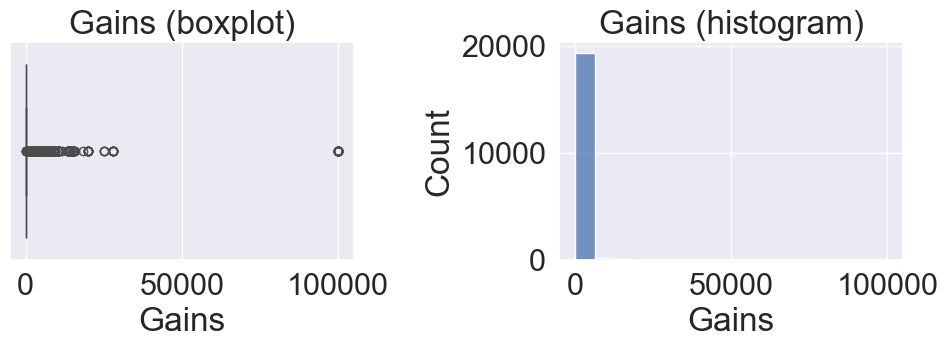

In [476]:
f, ax = plt.subplots(1, 2, figsize=(10, 4))

sns.boxplot(x='Gains', data=train, ax=ax[0])
ax[0].set_title('Gains (boxplot)')

sns.histplot(x='Gains', data=train, ax=ax[1])
ax[1].set_title('Gains (histogram)')
plt.tight_layout()

In [477]:
train[train['Gains'] > 0].sort_values(by='Gains', ascending=False).head(10)

,ID,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income
15088,TRAIN_15088,48,M,Elementary (5-6),Full-Time,52,Utilities & Sanitary,Transportation,White,Mexican (Mexicano),Married,Householder,Householder,Foreign-born (Non-US Citizen),Mexico,Mexico,Mexico,Married Filling Jointly both under 65 (MFJ),99999,0,0,Over Median,1641
14903,TRAIN_14903,30,M,Bachelors degree,Children or Armed Forces,52,Social Services,Professional,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),99999,0,0,Over Median,1230
11008,TRAIN_11008,36,M,Professional degree,Full-Time,52,Medical (except Hospitals),Professional,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),99999,0,0,Over Median,0
10842,TRAIN_10842,44,M,Professional degree,Children or Armed Forces,52,Finance Insurance & Real Estate,Professional,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),99999,0,0,Unknown,0
10817,TRAIN_10817,42,F,Bachelors degree,Children or Armed Forces,52,Transportation,Admin Support (include Clerical),White,All other,Single,Nonfamily householder,Householder,Native,US,US,US,Single,99999,0,0,Over Median,1485
1236,TRAIN_01236,44,M,Doctorate degree,Full-Time,52,Hospitals,Professional,White,Mexican-American,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),99999,0,250,Over Median,0
1293,TRAIN_01293,47,M,Masters degree,Full-Time,52,Finance Insurance & Real Estate,Sales,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),99999,0,3000,Over Median,0
1338,TRAIN_01338,24,M,College,Children or Armed Forces,52,Not in universe or children,Unknown,Asian/Pacific,All other,Single,Nonfamily householder,Householder,Foreign-born (Non-US Citizen),South Korea,South Korea,South Korea,Single,99999,0,0,Unknown,0
10312,TRAIN_10312,36,M,Bachelors degree,Full-Time,52,Wholesale,Management,White,All other,Married,Householder,Householder,Native,US,US,Germany,Married Filling Jointly both under 65 (MFJ),99999,0,24000,Unknown,0
14365,TRAIN_14365,64,M,Professional degree,Children or Armed Forces,35,Medical (except Hospitals),Professional,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),99999,0,0,Over Median,0


Gains가 99999인데 income은 0인 경우가 있다. 게다가 풀타임으로 기재되어 있음!  
Losses 데이터와 같이 봐야 할 것 같으니 일단은 넘어가보자.

### Losses

자본 손실을 의미한다.

In [478]:
train['Losses'].describe()

count    19727.000000
mean        40.435748
std        279.826567
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       4356.000000
Name: Losses, dtype: float64

마찬가지로 대부분은 손실이 없다.

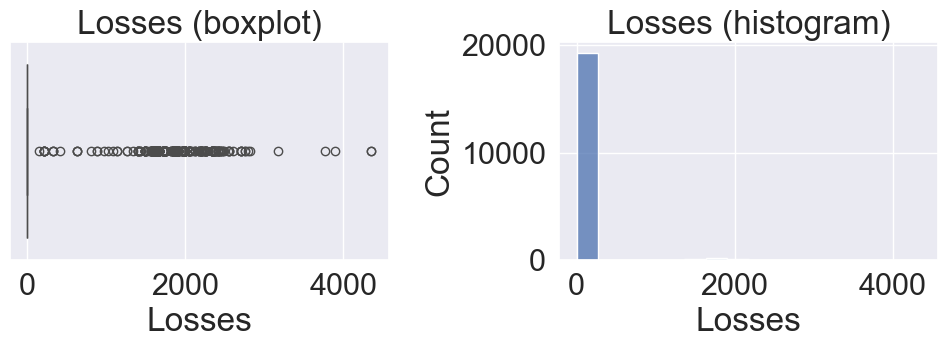

In [479]:
f, ax = plt.subplots(1, 2, figsize=(10, 4))

sns.boxplot(x='Losses', data=train, ax=ax[0])
ax[0].set_title('Losses (boxplot)')

sns.histplot(x='Losses', data=train, ax=ax[1])
ax[1].set_title('Losses (histogram)')
plt.tight_layout()

In [480]:
train[train['Losses'] > 0].sort_values(by='Losses', ascending=False).head(10)

,ID,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income
17108,TRAIN_17108,90,F,Middle (7-8),Children or Armed Forces,0,Not in universe or children,Unknown,White,All other,Widowed,Nonfamily householder,Householder,Native,US,Ireland,France,Single,0,4356,0,Unknown,0
8048,TRAIN_08048,65,F,College,Not Working,1,Not in universe or children,Unknown,White,All other,Widowed,Nonfamily householder,Householder,Native,US,US,US,Single,0,4356,10,Under Median,0
19542,TRAIN_19542,54,F,Middle (7-8),Children or Armed Forces,52,Manufacturing (Non-durable),Machine Operators & Inspectors,White,All other,Divorced,Householder,Householder,Native,US,US,US,Head of Household (HOH),0,3900,0,Under Median,1049
6611,TRAIN_06611,52,M,Bachelors degree,Children or Armed Forces,22,Personal Services (except Private Household),Admin Support (include Clerical),White,All other,Divorced,Householder,Householder,Native,US,US,US,Head of Household (HOH),0,3770,0,Under Median,525
19775,TRAIN_19775,72,F,Associates degree (Academic),Children or Armed Forces,0,Not in universe or children,Unknown,White,All other,Widowed,Nonfamily householder,Householder,Native,US,Unknown,Unknown,Single,0,3175,0,Under Median,0
14894,TRAIN_14894,30,M,High Sophomore,Children or Armed Forces,52,Construction,Craft & Repair,White,Mexican-American,Single,Other Rel 18+ never marr not in subfamily,Other relative of householder,Native,US,US,US,Single,0,2824,0,Over Median,450
2424,TRAIN_02424,68,F,Masters degree,Not Working,0,Not in universe or children,Unknown,White,All other,Divorced,Nonfamily householder,Householder,Native,US,US,US,Single,0,2788,0,Unknown,0
12132,TRAIN_12132,23,F,High graduate,Full-Time,52,Personal Services (except Private Household),Services,Black,All other,Single,Householder,Householder,Native,US,US,US,Head of Household (HOH),0,2754,0,Unknown,425
10565,TRAIN_10565,48,F,Middle (7-8),Part-Time (Usually Part-Time),52,Manufacturing (Non-durable),Machine Operators & Inspectors,Black,All other,Divorced,Householder,Householder,Native,US,US,US,Head of Household (HOH),0,2754,0,Unknown,0
12159,TRAIN_12159,19,M,High graduate,Children or Armed Forces,9,Retail,Services,Black,All other,Single,Grandchild 18+ never marr not in subfamily,Other relative of householder,Native,US,US,US,Single,0,2704,0,Under Median,450


마찬가지로 Loss 값이 있음에도 income이 0인 경우가 있다.

### Net Capital Gain

Gains에서 Losses를 빼면 순자본이득(net capital gain)을 얻을 수 있다.

In [481]:
train['Net Capital Gain'] = train['Gains'] - train['Losses']
train[['Gains', 'Losses', 'Net Capital Gain']]

,Gains,Losses,Net Capital Gain
0,0,0,0
1,0,0,0
2,3411,0,3411
3,0,0,0
4,0,0,0
...,...,...,...
19995,0,0,0
19996,0,0,0
19997,0,0,0
19998,0,0,0


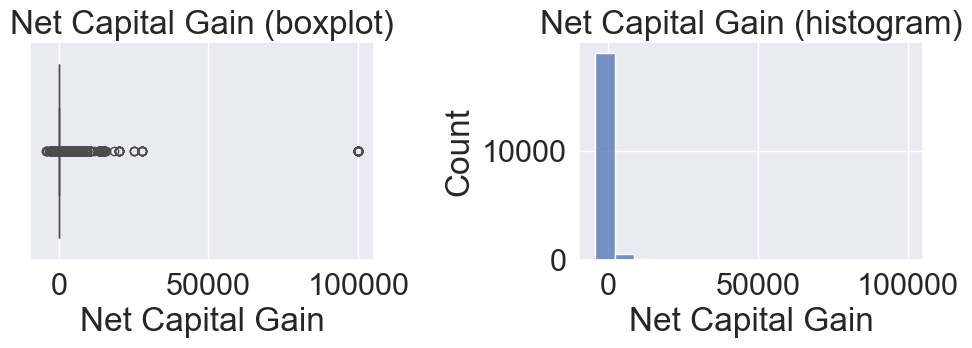

In [482]:
f, ax = plt.subplots(1, 2, figsize=(10, 4))

sns.boxplot(x='Net Capital Gain', data=train, ax=ax[0])
ax[0].set_title('Net Capital Gain (boxplot)')

sns.histplot(x='Net Capital Gain', data=train, ax=ax[1])
ax[1].set_title('Net Capital Gain (histogram)')
plt.tight_layout()

Net capital gain이 0이 아닌데 income은 0인 경우를 확인해보자.

In [483]:
with_net_gain_no_income = train[(train['Net Capital Gain'] != 0) & (train['Income'] == 0)]
with_net_gain_no_income

,ID,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income,Net Capital Gain
45,TRAIN_00045,41,M,College,Full-Time,52,Public Administration,Protective Services,White,Central or South American,Married,Householder,Householder,Foreign-born (Non-US Citizen),Columbia,Columbia,Columbia,Married Filling Jointly both under 65 (MFJ),99999,0,0,Over Median,0,99999
47,TRAIN_00047,30,M,High graduate,Children or Armed Forces,52,Manufacturing (Durable),Admin Support (include Clerical),White,All other,Single,Householder,Householder,Native,US,US,US,Single,0,2001,0,Under Median,0,-2001
70,TRAIN_00070,27,F,Bachelors degree,Full-Time,52,Medical (except Hospitals),Admin Support (include Clerical),White,All other,Single,Child 18+ never marr Not in a subfamily,Child 18 or older,Native,US,US,US,Single,0,1876,0,Unknown,0,-1876
84,TRAIN_00084,52,M,High graduate,Full-Time,52,Construction,Craft & Repair,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),15024,0,0,Over Median,0,15024
139,TRAIN_00139,36,M,Bachelors degree,Full-Time,52,Entertainment,Services,Asian/Pacific,All other,Married,Householder,Householder,Foreign-born (Non-US Citizen),Vietnam,China,Vietnam,Married Filling Jointly both under 65 (MFJ),0,1573,0,Under Median,0,-1573
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19551,TRAIN_19551,31,F,Elementary (1-4),Not Working,0,Not in universe or children,Unknown,White,Mexican (Mexicano),Married,Householder,Householder,Foreign-born (Non-US Citizen),Mexico,Mexico,Mexico,Married Filling Jointly both under 65 (MFJ),3103,0,0,Under Median,0,3103
19554,TRAIN_19554,38,F,College,Children or Armed Forces,52,Retail,Admin Support (include Clerical),White,All other,Divorced,Responsible Person of unrelated subfamily,Nonrelative of householder,Native,US,US,US,Head of Household (HOH),7443,0,0,Under Median,0,7443
19646,TRAIN_19646,42,F,Masters degree,Children or Armed Forces,52,Education,Professional,White,All other,Divorced,Householder,Householder,Native,US,US,US,Head of Household (HOH),1151,0,0,Under Median,0,1151
19775,TRAIN_19775,72,F,Associates degree (Academic),Children or Armed Forces,0,Not in universe or children,Unknown,White,All other,Widowed,Nonfamily householder,Householder,Native,US,Unknown,Unknown,Single,0,3175,0,Under Median,0,-3175


배당금까지 살펴본 뒤에 이상치를 판별하자.

### Dividends

In [484]:
train['Dividends'].describe()

count    19727.000000
mean       124.219598
std       1213.017418
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      45000.000000
Name: Dividends, dtype: float64

마찬가지로 극히 일부만 배당금을 받고 있다.

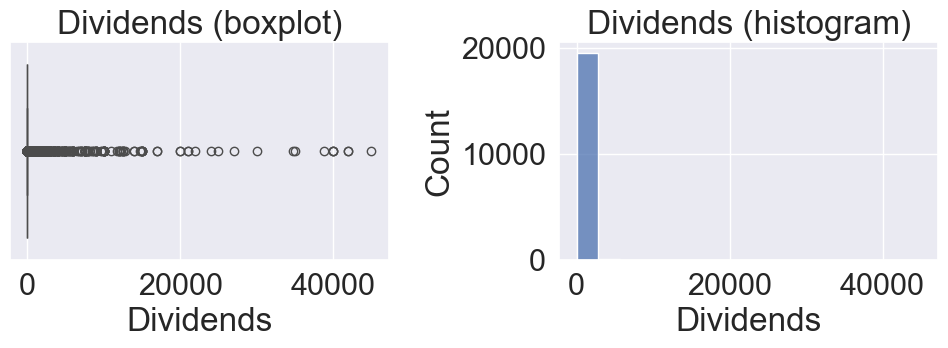

In [485]:
f, ax = plt.subplots(1, 2, figsize=(10, 4))

sns.boxplot(x='Dividends', data=train, ax=ax[0])
ax[0].set_title('Dividends (boxplot)')

sns.histplot(x='Dividends', data=train, ax=ax[1])
ax[1].set_title('Dividends (histogram)')
plt.tight_layout()

In [486]:
train[train['Dividends'] > 0].sort_values(by='Dividends', ascending=False).head(10)

,ID,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income,Net Capital Gain
401,TRAIN_00401,74,F,High Senior,Full-Time,48,Medical (except Hospitals),Professional,White,All other,Married,Spouse of householder,Spouse of householder,Native,US,US,US,Married Filling Jointly both over 65 (MFJ),0,0,45000,Over Median,500,0
11617,TRAIN_11617,77,M,Professional degree,Full-Time,52,Other professional services,Professional,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both over 65 (MFJ),20051,0,42000,Over Median,2200,20051
3046,TRAIN_03046,66,M,Middle (7-8),Full-Time,52,Transportation,Transportation,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly one over 65 & one under 65 (MFJ),20051,0,42000,Unknown,850,20051
7214,TRAIN_07214,49,M,Associates degree (Academic),Full-Time,52,Construction,Management,White,All other,Married,Householder,Householder,Native,US,Canada,Germany,Married Filling Jointly both under 65 (MFJ),0,0,40000,Unknown,0,0
3355,TRAIN_03355,54,M,College,Full-Time,52,Transportation,Management,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,40000,Over Median,0,0
19987,TRAIN_19987,45,M,High graduate,Full-Time,52,Utilities & Sanitary,Machine Operators & Inspectors,White,All other,Married,Spouse of householder,Spouse of householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,40000,Over Median,2373,0
5475,TRAIN_05475,42,M,College,Full-Time,52,Other professional services,Technicians & Support,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,38758,Unknown,1532,0
2697,TRAIN_02697,80,F,College,Not Working,0,Not in universe or children,Unknown,White,All other,Widowed,Householder,Householder,Native,US,US,US,Single,7896,0,35000,Under Median,0,7896
15182,TRAIN_15182,42,F,Masters degree,Children or Armed Forces,42,Education,Professional,White,All other,Married,Spouse of householder,Spouse of householder,Native,US,Outlying-U S (Guam USVI etc),US,Married Filling Jointly both under 65 (MFJ),0,0,34738,Over Median,0,0
6175,TRAIN_06175,65,F,High graduate,Children or Armed Forces,0,Not in universe or children,Unknown,White,All other,Married,Spouse of householder,Spouse of householder,Native,US,US,US,Married Filling Jointly both over 65 (MFJ),0,0,30000,Over Median,0,0


마찬가지로 Full-Time이지만 income은 0이고, dividends가 있는 데이터들이 있다.

### Total Investment Income

net capital gain(순자본이득)에 dividends (배당금)을 더하면 investment income(투자 소득)이 된다.

In [487]:
train['Investment Income'] = train['Net Capital Gain'] + train['Dividends']
train[['Net Capital Gain', 'Dividends', 'Investment Income']]


,Net Capital Gain,Dividends,Investment Income
0,0,0,0
1,0,0,0
2,3411,0,3411
3,0,0,0
4,0,0,0
...,...,...,...
19995,0,0,0
19996,0,0,0
19997,0,0,0
19998,0,0,0


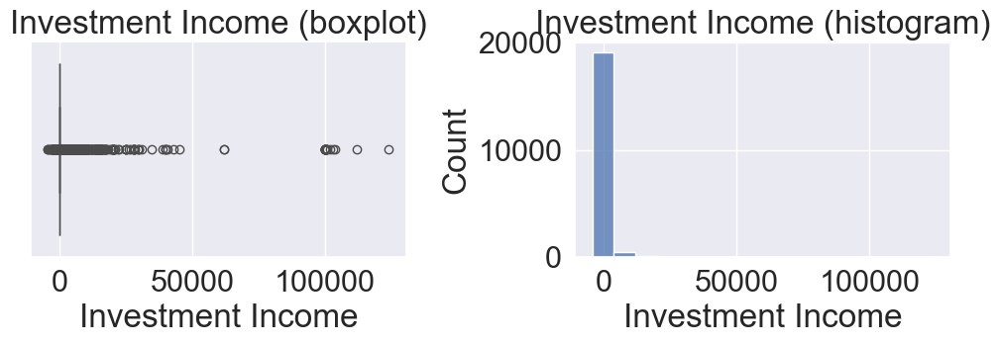

In [488]:
f, ax = plt.subplots(1, 2, figsize=(10, 4))

sns.boxplot(x='Investment Income', data=train, ax=ax[0])
ax[0].set_title('Investment Income (boxplot)')

sns.histplot(x='Investment Income', data=train, ax=ax[1])
ax[1].set_title('Investment Income (histogram)')
plt.tight_layout()

마찬가지로 sparse 데이터이다.  
이제 이상치를 제거해보자. 우선 income이 0인데 investment income은 0이 아닌 값들을 살펴보자.

In [489]:
with_invest_income_no_income = train[(train['Investment Income'] != 0) & (train['Income'] == 0)]
with_invest_income_no_income

,ID,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income,Net Capital Gain,Investment Income
7,TRAIN_00007,64,M,Masters degree,Not Working,5,Not in universe or children,Unknown,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,2052,Under Median,0,0,2052
14,TRAIN_00014,44,M,High graduate,Children or Armed Forces,52,Public Administration,Protective Services,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,200,Over Median,0,0,200
34,TRAIN_00034,55,M,High graduate,Children or Armed Forces,52,Manufacturing (Durable),Machine Operators & Inspectors,Native American/Aleut/Eskimo,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,48,Over Median,0,0,48
45,TRAIN_00045,41,M,College,Full-Time,52,Public Administration,Protective Services,White,Central or South American,Married,Householder,Householder,Foreign-born (Non-US Citizen),Columbia,Columbia,Columbia,Married Filling Jointly both under 65 (MFJ),99999,0,0,Over Median,0,99999,99999
47,TRAIN_00047,30,M,High graduate,Children or Armed Forces,52,Manufacturing (Durable),Admin Support (include Clerical),White,All other,Single,Householder,Householder,Native,US,US,US,Single,0,2001,0,Under Median,0,-2001,-2001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19828,TRAIN_19828,57,F,College,Not Working,22,Not in universe or children,Unknown,White,All other,Married,Spouse of householder,Spouse of householder,Native,US,US,US,Married Filling Jointly one over 65 & one under 65 (MFJ),0,0,4000,Under Median,0,0,4000
19946,TRAIN_19946,33,M,College,Children or Armed Forces,52,Manufacturing (Durable),Professional,White,All other,Single,Nonfamily householder,Householder,Native,US,US,US,Single,0,0,75,Under Median,0,0,75
19958,TRAIN_19958,71,F,Bachelors degree,Not Working,0,Not in universe or children,Unknown,White,All other,Married,Spouse of householder,Spouse of householder,Foreign-born (Naturalized US Citizen),Canada,Canada,Canada,Married Filling Jointly both over 65 (MFJ),0,0,239,Unknown,0,0,239
19967,TRAIN_19967,51,F,Masters degree,Full-Time,36,Education,Professional,White,All other,Married,Spouse of householder,Spouse of householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,12,Under Median,0,0,12


이 중 고용상태가 'not working'인 경우를 살펴보자.

In [490]:
with_invest_income_no_income[with_invest_income_no_income['Employment_Status'] == 'Not Working']

,ID,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income,Net Capital Gain,Investment Income
7,TRAIN_00007,64,M,Masters degree,Not Working,5,Not in universe or children,Unknown,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,2052,Under Median,0,0,2052
114,TRAIN_00114,66,F,High graduate,Not Working,0,Not in universe or children,Unknown,White,All other,Married,Householder,Householder,Native,US,Unknown,Unknown,Married Filling Jointly both over 65 (MFJ),0,0,4146,Under Median,0,0,4146
148,TRAIN_00148,28,F,High Freshman,Not Working,0,Not in universe or children,Unknown,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,2042,0,Under Median,0,-2042,-2042
290,TRAIN_00290,57,F,High graduate,Not Working,0,Not in universe or children,Unknown,White,Mexican-American,Married,Spouse of householder,Spouse of householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,2000,Under Median,0,0,2000
463,TRAIN_00463,69,M,Bachelors degree,Not Working,52,Not in universe or children,Unknown,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly one over 65 & one under 65 (MFJ),10566,0,0,Under Median,0,10566,10566
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19267,TRAIN_19267,65,M,High graduate,Not Working,0,Not in universe or children,Unknown,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly one over 65 & one under 65 (MFJ),0,0,673,Unknown,0,0,673
19551,TRAIN_19551,31,F,Elementary (1-4),Not Working,0,Not in universe or children,Unknown,White,Mexican (Mexicano),Married,Householder,Householder,Foreign-born (Non-US Citizen),Mexico,Mexico,Mexico,Married Filling Jointly both under 65 (MFJ),3103,0,0,Under Median,0,3103,3103
19684,TRAIN_19684,70,F,High graduate,Not Working,0,Not in universe or children,Unknown,White,All other,Married,Spouse of householder,Spouse of householder,Native,US,Italy,Italy,Married Filling Jointly both over 65 (MFJ),0,0,500,Under Median,0,0,500
19828,TRAIN_19828,57,F,College,Not Working,22,Not in universe or children,Unknown,White,All other,Married,Spouse of householder,Spouse of householder,Native,US,US,US,Married Filling Jointly one over 65 & one under 65 (MFJ),0,0,4000,Under Median,0,0,4000


위 경우는 무언가 다른 경위로 투자 소득을 얻는(혹은 잃는) 경우라고 볼 수 있다.  
그렇다면 Not working 상태가 아님에도 Investment Income은 있지만 Income은 0인 경우는 이상치로 볼 수 있을 것이다.

In [491]:
with_invest_income_no_income[with_invest_income_no_income['Employment_Status'] != 'Not Working']

,ID,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income,Net Capital Gain,Investment Income
14,TRAIN_00014,44,M,High graduate,Children or Armed Forces,52,Public Administration,Protective Services,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,200,Over Median,0,0,200
34,TRAIN_00034,55,M,High graduate,Children or Armed Forces,52,Manufacturing (Durable),Machine Operators & Inspectors,Native American/Aleut/Eskimo,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,48,Over Median,0,0,48
45,TRAIN_00045,41,M,College,Full-Time,52,Public Administration,Protective Services,White,Central or South American,Married,Householder,Householder,Foreign-born (Non-US Citizen),Columbia,Columbia,Columbia,Married Filling Jointly both under 65 (MFJ),99999,0,0,Over Median,0,99999,99999
47,TRAIN_00047,30,M,High graduate,Children or Armed Forces,52,Manufacturing (Durable),Admin Support (include Clerical),White,All other,Single,Householder,Householder,Native,US,US,US,Single,0,2001,0,Under Median,0,-2001,-2001
70,TRAIN_00070,27,F,Bachelors degree,Full-Time,52,Medical (except Hospitals),Admin Support (include Clerical),White,All other,Single,Child 18+ never marr Not in a subfamily,Child 18 or older,Native,US,US,US,Single,0,1876,0,Unknown,0,-1876,-1876
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19818,TRAIN_19818,73,F,High graduate,Children or Armed Forces,0,Not in universe or children,Unknown,White,All other,Widowed,Other Rel 18+ ever marr not in subfamily,Other relative of householder,Native,US,US,US,Single,0,0,125,Under Median,0,0,125
19820,TRAIN_19820,36,M,College,Children or Armed Forces,52,Finance Insurance & Real Estate,Sales,White,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),5178,0,0,Over Median,0,5178,5178
19946,TRAIN_19946,33,M,College,Children or Armed Forces,52,Manufacturing (Durable),Professional,White,All other,Single,Nonfamily householder,Householder,Native,US,US,US,Single,0,0,75,Under Median,0,0,75
19967,TRAIN_19967,51,F,Masters degree,Full-Time,36,Education,Professional,White,All other,Married,Spouse of householder,Spouse of householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),0,0,12,Under Median,0,0,12


In [492]:
# 이상치 제거
train = train[~((train['Employment_Status'] != 'Not Working') & (train['Income'] == 0) & (train['Investment Income'] != 0))]
train


,ID,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income,Net Capital Gain,Investment Income
0,TRAIN_00000,63,M,Middle (7-8),Full-Time,4,Social Services,Services,White,All other,Married,Householder,Householder,Native,US,US,US,Nonfiler,0,0,0,Unknown,425,0,0
1,TRAIN_00001,37,M,Associates degree (Vocational),Full-Time,52,Entertainment,Services,White,All other,Separated,Nonfamily householder,Householder,Native,US,US,US,Single,0,0,0,Under Median,0,0,0
2,TRAIN_00002,58,F,High graduate,Full-Time,52,Manufacturing (Non-durable),Admin Support (include Clerical),Black,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),3411,0,0,Under Median,860,3411,3411
3,TRAIN_00003,44,M,High graduate,Full-Time,52,Retail,Technicians & Support,White,All other,Divorced,Nonfamily householder,Householder,Native,US,US,US,Single,0,0,0,Under Median,850,0,0
4,TRAIN_00004,37,F,High graduate,Full-Time,52,Retail,Sales,White,All other,Divorced,Householder,Householder,Native,US,US,US,Head of Household (HOH),0,0,0,Unknown,570,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,TRAIN_19995,33,M,High graduate,Children or Armed Forces,52,Manufacturing (Durable),Handlers/Cleaners,White,All other,Single,Nonfamily householder,Householder,Native,US,US,US,Single,0,0,0,Under Median,1300,0,0
19996,TRAIN_19996,20,F,College,Full-Time,12,Education,Admin Support (include Clerical),White,Mexican-American,Single,Child 18+ never marr Not in a subfamily,Child 18 or older,Native,US,Mexico,Mexico,Nonfiler,0,0,0,Under Median,850,0,0
19997,TRAIN_19997,22,M,College,Children or Armed Forces,52,Transportation,Technicians & Support,White,All other,Single,In group quarters,Group Quarters- Secondary individual,Native,US,US,US,Single,0,0,0,Unknown,999,0,0
19998,TRAIN_19998,76,F,High graduate,Not Working,0,Not in universe or children,Unknown,White,All other,Widowed,Nonfamily householder,Householder,Native,US,Scotland,England,Single,0,0,0,Under Median,0,0,0


이제 수치형 데이터 분석이 끝났으니 수치형 데이터들의 히트맵을 그려보자!

Text(0.5, 1.0, 'Correlation Matrix of Numerical Variables')

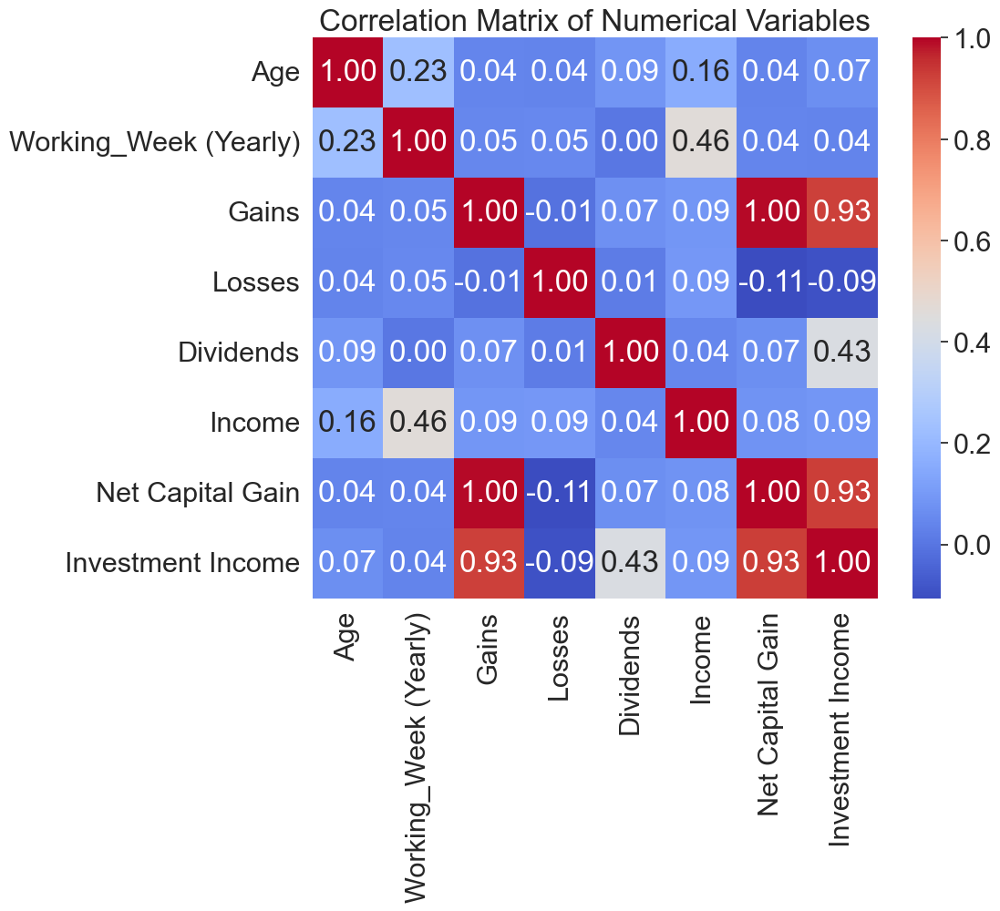

In [493]:
numeric = train.select_dtypes(include=['int64', 'float64'])
corr_matrix = numeric.corr()
plt.figure(figsize = (10, 8))
sns.heatmap(corr_matrix, annot = True, cmap = 'coolwarm', fmt = '.2f')
plt.title('Correlation Matrix of Numerical Variables')

- 나이와 주중 근로시간은 약한 상관관계가 있음.
- 소득과 주중 근로시간은 더 약한 상관관계가 있음.
- 나이와 소득은 매우 약한 상관관계가 있음.

### Age vs. Working_Week (Yearly)

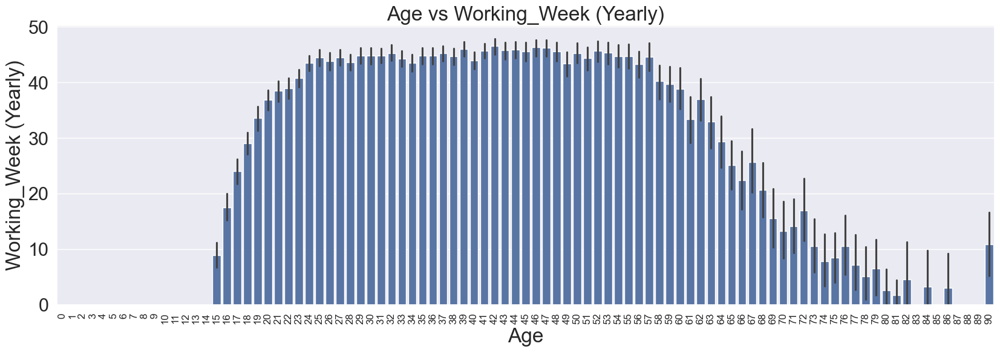

In [494]:
plt.figure(figsize = (20, 6))
sns.barplot(data = train, x = 'Age', y = 'Working_Week (Yearly)')
plt.title('Age vs Working_Week (Yearly)')
plt.xlabel('Age')
plt.ylabel('Working_Week (Yearly)')
plt.xticks(rotation = 90, fontsize=12)
plt.show()

일반적으로 소득이 발생하기 시작하는 구간(15살~)에는 나이가 들수록 점차 업무시간이 증가하고, 사회 활동이 왕성한 시기에는 업무시간이 높게 유지되며, 은퇴에 가까워질수록 업무 시간이 줄어드는 경향을 보인다.  
82세 이상인데 일을 하는 경우는 특이 케이스이므로 이상치라고 판단한다.

In [495]:
# 이상치 제거
train = train[~((train['Age'] >= 82))]
train

,ID,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Hispanic_Origin,Martial_Status,Household_Status,Household_Summary,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income,Net Capital Gain,Investment Income
0,TRAIN_00000,63,M,Middle (7-8),Full-Time,4,Social Services,Services,White,All other,Married,Householder,Householder,Native,US,US,US,Nonfiler,0,0,0,Unknown,425,0,0
1,TRAIN_00001,37,M,Associates degree (Vocational),Full-Time,52,Entertainment,Services,White,All other,Separated,Nonfamily householder,Householder,Native,US,US,US,Single,0,0,0,Under Median,0,0,0
2,TRAIN_00002,58,F,High graduate,Full-Time,52,Manufacturing (Non-durable),Admin Support (include Clerical),Black,All other,Married,Householder,Householder,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),3411,0,0,Under Median,860,3411,3411
3,TRAIN_00003,44,M,High graduate,Full-Time,52,Retail,Technicians & Support,White,All other,Divorced,Nonfamily householder,Householder,Native,US,US,US,Single,0,0,0,Under Median,850,0,0
4,TRAIN_00004,37,F,High graduate,Full-Time,52,Retail,Sales,White,All other,Divorced,Householder,Householder,Native,US,US,US,Head of Household (HOH),0,0,0,Unknown,570,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,TRAIN_19995,33,M,High graduate,Children or Armed Forces,52,Manufacturing (Durable),Handlers/Cleaners,White,All other,Single,Nonfamily householder,Householder,Native,US,US,US,Single,0,0,0,Under Median,1300,0,0
19996,TRAIN_19996,20,F,College,Full-Time,12,Education,Admin Support (include Clerical),White,Mexican-American,Single,Child 18+ never marr Not in a subfamily,Child 18 or older,Native,US,Mexico,Mexico,Nonfiler,0,0,0,Under Median,850,0,0
19997,TRAIN_19997,22,M,College,Children or Armed Forces,52,Transportation,Technicians & Support,White,All other,Single,In group quarters,Group Quarters- Secondary individual,Native,US,US,US,Single,0,0,0,Unknown,999,0,0
19998,TRAIN_19998,76,F,High graduate,Not Working,0,Not in universe or children,Unknown,White,All other,Widowed,Nonfamily householder,Householder,Native,US,Scotland,England,Single,0,0,0,Under Median,0,0,0


### Income vs. Working_Week (Yearly)

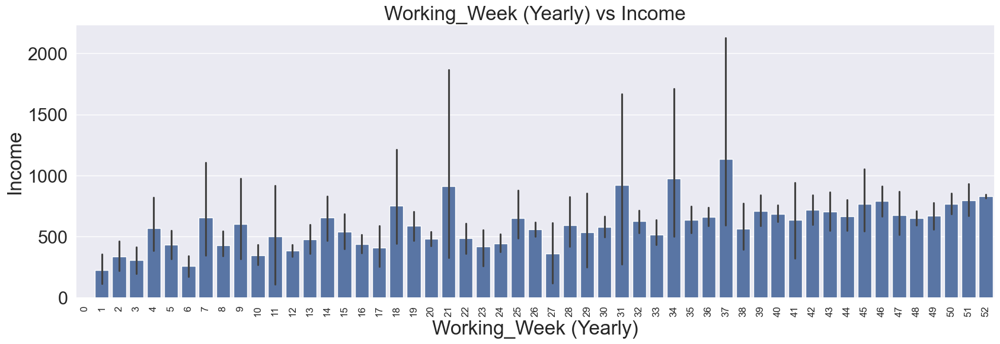

In [496]:
plt.figure(figsize = (20, 6))
sns.barplot(data = train, x = 'Working_Week (Yearly)', y = 'Income')
plt.title('Working_Week (Yearly) vs Income')
plt.xlabel('Working_Week (Yearly)')
plt.ylabel('Income')
plt.xticks(rotation = 90, fontsize=12)
plt.show()

앞에서 불로소득 데이터를 제거했으므로 일하지 않으면 소득도 0이다.

### Age vs. Income

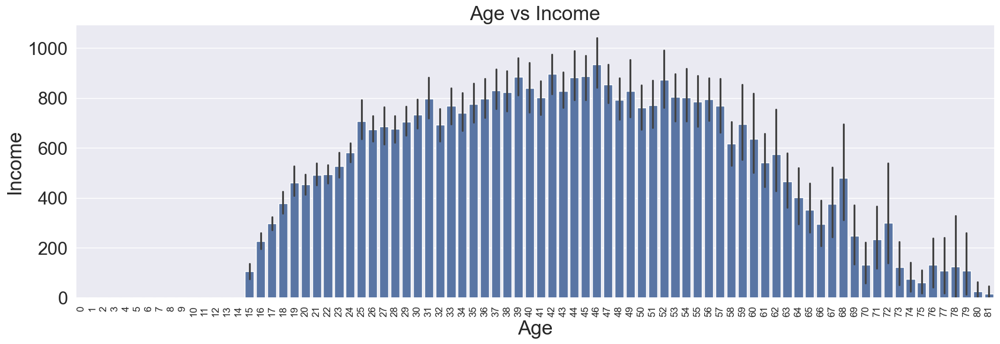

In [497]:
plt.figure(figsize = (20, 6))
sns.barplot(data = train, x = 'Age', y = 'Income')
plt.title('Age vs Income')
plt.xlabel('Age')
plt.ylabel('Income')
plt.xticks(rotation = 90, fontsize=12)
plt.show()

## 2.2 Categorical data

In [498]:
categorical_columns.columns

Index(['ID', 'Gender', 'Education_Status', 'Employment_Status',
       'Industry_Status', 'Occupation_Status', 'Race', 'Hispanic_Origin',
       'Martial_Status', 'Household_Status', 'Household_Summary',
       'Citizenship', 'Birth_Country', 'Birth_Country (Father)',
       'Birth_Country (Mother)', 'Tax_Status', 'Income_Status'],
      dtype='object')

유의미해보이는 데이터만 골라보자...우선 데이터를 단순화하기 위해 이민과 관련된 데이터들은 제외한다.

In [499]:
train = train.drop(['ID', 'Birth_Country', 'Birth_Country (Father)', 'Birth_Country (Mother)', 'Hispanic_Origin'], axis = 1)
test = test.drop(['ID', 'Birth_Country', 'Birth_Country (Father)', 'Birth_Country (Mother)', 'Hispanic_Origin'], axis = 1)

In [500]:
train.select_dtypes(include=['object']).describe()

,Gender,Education_Status,Employment_Status,Industry_Status,Occupation_Status,Race,Martial_Status,Household_Status,Household_Summary,Citizenship,Tax_Status,Income_Status
count,18499,18499,18499,18499,18499,18499,18499,18499,18499,18499,18499,18499
unique,2,17,8,24,15,5,7,31,8,5,6,3
top,F,High graduate,Children or Armed Forces,Not in universe or children,Unknown,White,Married,Householder,Householder,Native,Married Filling Jointly both under 65 (MFJ),Under Median
freq,9774,6115,10278,4363,4363,15501,8674,5445,7635,16486,7859,12416


unique 수가 많고 Household_Summary와 겹치는 Household_Status도 제거한다.

In [501]:
train = train.drop(['Household_Status'], axis = 1)
test = test.drop(['Household_Status'], axis = 1)

In [502]:
train.select_dtypes(include=['object']).columns

Index(['Gender', 'Education_Status', 'Employment_Status', 'Industry_Status',
       'Occupation_Status', 'Race', 'Martial_Status', 'Household_Summary',
       'Citizenship', 'Tax_Status', 'Income_Status'],
      dtype='object')

### Gender

Text(0.5, 1.0, 'Gender')

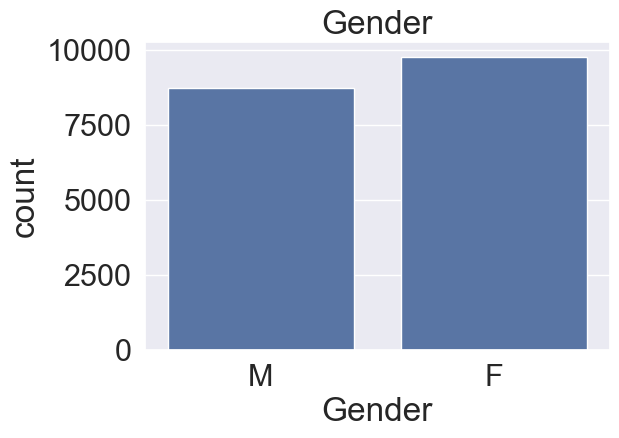

In [503]:
f, ax = plt.subplots(1, 1, figsize=(6, 4))

sns.countplot(x='Gender', data=train)
plt.title('Gender')

일하는 여자의 수가 더 많다.

### Education_Status

In [504]:
train['Education_Status'].unique()

array(['Middle (7-8)', 'Associates degree (Vocational)', 'High graduate',
       'Masters degree', 'Bachelors degree', 'High Freshman',
       'Elementary (1-4)', 'College', 'Children', 'High Sophomore',
       'Associates degree (Academic)', 'High Junior', 'Elementary (5-6)',
       'Doctorate degree', 'Professional degree', 'High Senior',
       'Kindergarten'], dtype=object)

In [505]:
train['Education_Status'].nunique()

17

In [506]:
education = pd.DataFrame(train['Education_Status'].value_counts())
education

,count
Education_Status,
High graduate,6115
College,3548
Children,2208
Bachelors degree,1648
High Junior,778
High Sophomore,739
Associates degree (Vocational),693
Associates degree (Academic),559
High Freshman,515


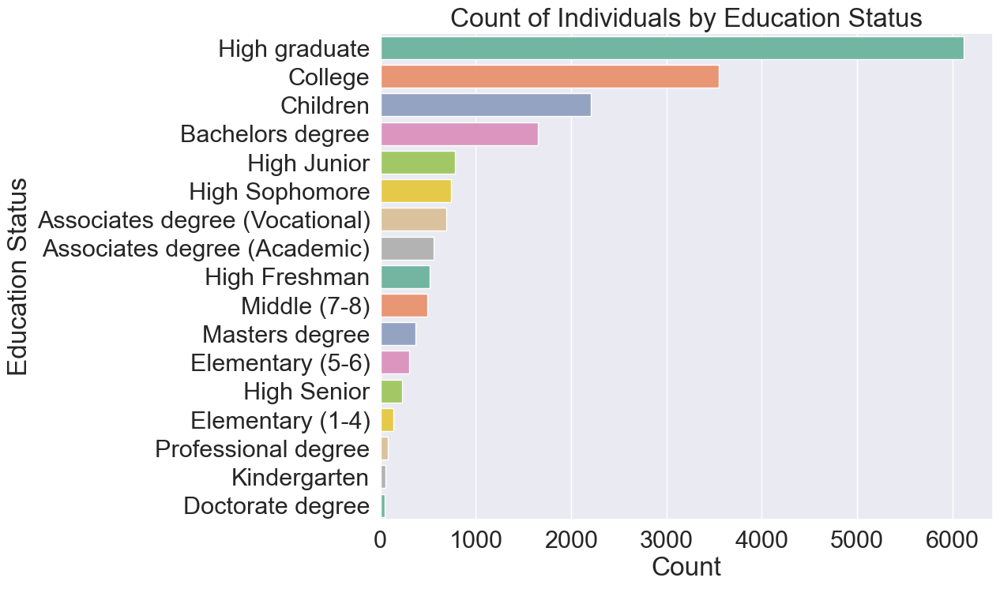

In [507]:
# education 데이터프레임의 인덱스를 리셋하여 'Education_Status'를 열로 만듭니다.
education.reset_index(inplace=True)
education.columns = ['Education_Status', 'Count']  # 열 이름을 적절하게 설정

# 막대 그래프 시각화
plt.figure(figsize=(10, 8))
sns.barplot(x='Count', y='Education_Status', data=education, palette='Set2')
plt.title('Count of Individuals by Education Status')
plt.xlabel('Count')
plt.ylabel('Education Status')
plt.show()


고등학생은 굳이 freshment, sophomore, junior, senior로 구분되어 있으므로 feature engineering을 통해 정리해보자.

In [508]:
education_mapping = {
    'Kindergarten': 'Preschool',
    'Elementary (1-4)': 'Elementary',
    'Elementary (5-6)': 'Elementary',
    'Middle (7-8)': 'Middle_School',
    'High Freshman': 'High_School',  # 고1
    'High Sophomore': 'High_School', # 고2
    'High Junior': 'High_School',    # 고3
    'High Senior': 'High_School',    # 고4
    'High graduate': 'High_School_Graduate',
    'College': 'Undergraduate_Student',  
    'Associates degree (Vocational)': 'Associate_Degree', # 2년제 전문 학위
    'Associates degree (Academic)': 'Associate_Degree',   # 2년제 학문 학위
    'Bachelors degree': 'Bachelor_Degree',
    'Masters degree': 'Master_Degree',
    'Professional degree': 'Professional_Degree',  # 특정 전문 직업을 위한 학위이나, 여기서는 대졸로 간주
    'Doctorate degree': 'Doctorate_Degree',
    'Children': 'Preschool' # 미취학아동
}


In [509]:
train['Education_Level'] = train['Education_Status'].replace(education_mapping)
test['Education_Level'] = test['Education_Status'].replace(education_mapping)

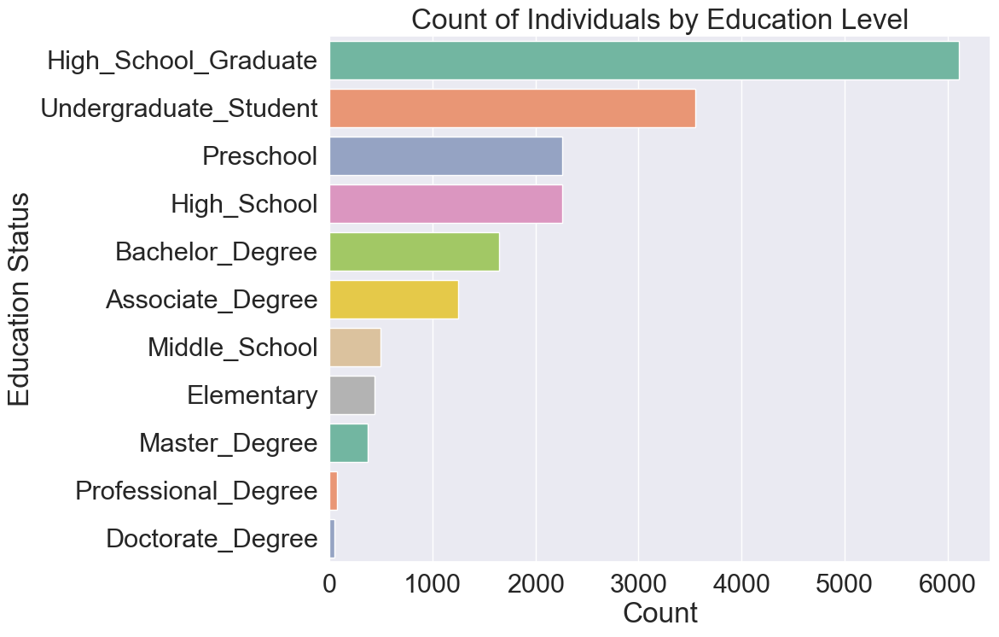

In [510]:
education_level = pd.DataFrame(train['Education_Level'].value_counts())
education_level.reset_index(inplace=True)
education_level.columns = ['Education_Level', 'Count']  # 열 이름을 적절하게 설정

# 막대 그래프 시각화
plt.figure(figsize=(10, 8))
sns.barplot(x='Count', y='Education_Level', data=education_level, palette='Set2')
plt.title('Count of Individuals by Education Level')
plt.xlabel('Count')
plt.ylabel('Education Status')
plt.show()

고졸, 대학생, 영유아, 고등학생 순으로 많고 아무래도 고학력자의 수가 더 적다.

### Employment_Status

In [511]:
train['Employment_Status'].nunique()

8

In [512]:
train['Employment_Status'].value_counts()

Employment_Status
Children or Armed Forces         10278
Full-Time                         6098
Not Working                       1148
Choice Part-Time                   551
Part-Time (Usually Part-Time)      142
Seeking Full-Time                  114
Part-Time (Usually Full-Time)       96
Seeking Part-Time                   72
Name: count, dtype: int64

일반적으로 children(미성년자)와 armed forces(직업군인)은 직업 통계에 포함되지 않는다.  
feature engineering을 통해 근로자와 비근로자로 구분해보자.

In [513]:
# 고용 상태 매핑 정의
employment_mapping = {
    'Children or Armed Forces': 'Unemployed',
    'Full-Time': 'Employed',
    'Not Working': 'Unemployed',
    'Choice Part-Time': 'Employed',
    'Part-Time (Usually Part-Time)': 'Employed',
    'Seeking Full-Time': 'Unemployed',
    'Part-Time (Usually Full-Time)': 'Employed',
    'Seeking Part-Time': 'Unemployed'
}

# 'Employment_Status' 컬럼을 매핑하여 'Employment_Binary' 컬럼 생성
train['Employment_Binary'] = train['Employment_Status'].map(employment_mapping)
test['Employment_Binary'] = test['Employment_Status'].map(employment_mapping)

Text(0.5, 1.0, 'Employment(Binary)')

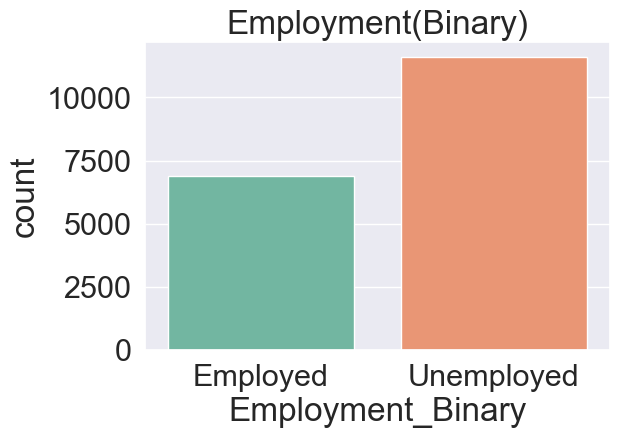

In [514]:
f, ax = plt.subplots(1, 1, figsize=(6, 4))

sns.countplot(x='Employment_Binary', data=train, palette='Set2')
plt.title('Employment(Binary)')

일하지 않고 있는 사람의 수가 더 많다.

### Industry_Status

In [515]:
train['Industry_Status'].nunique()

24

In [516]:
train['Industry_Status'].unique()

array(['Social Services', 'Entertainment', 'Manufacturing (Non-durable)',
       'Retail', 'Not in universe or children', 'Construction',
       'Hospitals', 'Manufacturing (Durable)', 'Education',
       'Finance Insurance & Real Estate', 'Transportation',
       'Medical (except Hospitals)', 'Wholesale', 'Public Administration',
       'Other professional services',
       'Personal Services (except Private Household)',
       'Business & Repair', 'Private Household Services', 'Mining',
       'Agriculture', 'Utilities & Sanitary', 'Communications',
       'Forestry & Fisheries', 'Armed Forces'], dtype=object)

제조, 건설, 의료, 제조, 교육 등 다양한 산업군이 있지만 feature engineering으로는 다음과 같이 표현할 수 있다.

In [517]:
# 'Industry_Status' 컬럼을 새로운 범주로 매핑하기 위한 딕셔너리 생성
industry_mapping = {
    'Agriculture': 'Primary_Sector',
    'Mining': 'Primary_Sector',
    'Forestry & Fisheries': 'Primary_Sector',
    'Utilities & Sanitary': 'Primary_Sector',
    'Manufacturing (Durable)': 'Secondary_Sector',
    'Manufacturing (Non-durable)': 'Secondary_Sector',
    'Construction': 'Secondary_Sector',
    'Retail': 'Tertiary_Sector',
    'Social Services': 'Tertiary_Sector',
    'Hospitals': 'Tertiary_Sector',
    'Education': 'Quaternary_Sector',  # Also part of Tertiary, but here classified as Quaternary for the sake of example
    'Finance Insurance & Real Estate': 'Quaternary_Sector',
    'Transportation': 'Tertiary_Sector',
    'Medical (except Hospitals)': 'Tertiary_Sector',
    'Wholesale': 'Tertiary_Sector',
    'Public Administration': 'Quaternary_Sector',
    'Other professional services': 'Quaternary_Sector',
    'Personal Services (except Private Household)': 'Tertiary_Sector',
    'Business & Repair': 'Tertiary_Sector',
    'Private Household Services': 'Tertiary_Sector',
    'Communications': 'Quaternary_Sector',
    'Not in universe or children': 'Not_in_Labor_Force',
    'Entertainment': 'Tertiary_Sector',
    'Armed Forces': 'Not_in_Labor_Force'
}

# train 데이터프레임의 'Industry_Status' 컬럼을 매핑하여 'Sector' 컬럼을 생성
train['Sector'] = train['Industry_Status'].map(industry_mapping)
test['Sector'] = test['Industry_Status'].map(industry_mapping)

In [518]:
train['Sector'].value_counts()

Sector
Tertiary_Sector       7438
Not_in_Labor_Force    4364
Secondary_Sector      3388
Quaternary_Sector     2742
Primary_Sector         567
Name: count, dtype: int64

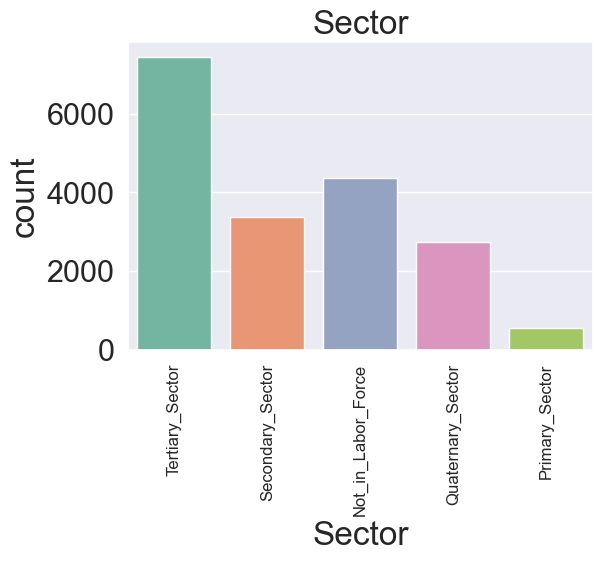

In [519]:
f, ax = plt.subplots(1, 1, figsize=(6, 4))

sns.countplot(x='Sector', data=train, palette='Set2')
plt.title('Sector')
plt.xticks(rotation = 90, fontsize=12);

3차 산업에 종사하는 사람들이 가장 많고, 역시 취업활동 인구에 해당하는 사람들의 비율이 꽤 높다.

### Occupation_Status

In [520]:
train['Occupation_Status'].unique()

array(['Services', 'Admin Support (include Clerical)',
       'Technicians & Support', 'Sales', 'Unknown',
       'Machine Operators & Inspectors', 'Craft & Repair',
       'Protective Services', 'Management', 'Professional',
       'Transportation', 'Handlers/Cleaners',
       'Private Household Services', 'Farming & Forestry & Fishing',
       'Armed Forces'], dtype=object)

In [521]:
train['Occupation_Status'].nunique()

15

In [522]:
occupation_status = pd.DataFrame(train['Occupation_Status'].value_counts())
occupation_status.reset_index(inplace=True)
occupation_status.columns = ['Occupation_Status', 'Count']  # 열 이름을 적절하게 설정
occupation_status

,Occupation_Status,Count
0,Unknown,4363
1,Admin Support (include Clerical),2574
2,Services,2211
3,Craft & Repair,1770
4,Sales,1523
5,Machine Operators & Inspectors,1333
6,Professional,1237
7,Management,908
8,Handlers/Cleaners,780
9,Transportation,660


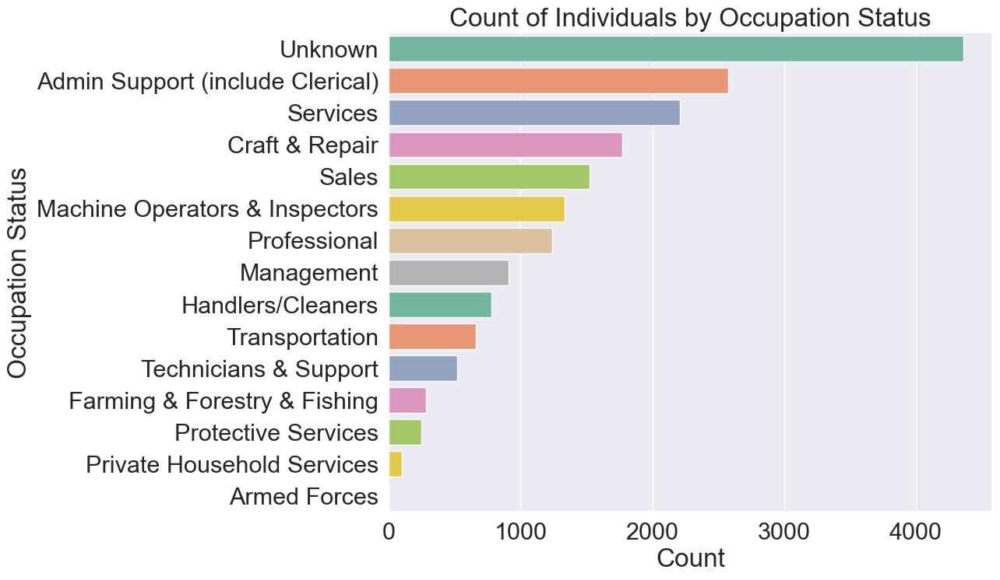

In [523]:
# 막대 그래프 시각화
plt.figure(figsize=(10, 8))
sns.barplot(x='Count', y='Occupation_Status', data=occupation_status, palette='Set2')
plt.title('Count of Individuals by Occupation Status')
plt.xlabel('Count')
plt.ylabel('Occupation Status')
plt.show()


In [524]:
train[train['Occupation_Status'] == 'Armed Forces']

,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Martial_Status,Household_Summary,Citizenship,Tax_Status,Gains,Losses,Dividends,Income_Status,Income,Net Capital Gain,Investment Income,Education_Level,Employment_Binary,Sector
10342,31,F,College,Seeking Full-Time,20,Armed Forces,Armed Forces,White,Married,Spouse of householder,Native,Married Filling Jointly both under 65 (MFJ),0,0,0,Under Median,0,0,0,Undergraduate_Student,Unemployed,Not_in_Labor_Force


In [525]:
# feature engineering 적용

# 'Occupation_Status' 컬럼의 값을 더 넓은 범주로 재분류하기 위한 딕셔너리 생성
occupation_mapping = {
    'Machine Operators & Inspectors': 'Manual_Labor',
    'Craft & Repair': 'Manual_Labor',
    'Handlers/Cleaners': 'Manual_Labor',
    'Farming & Forestry & Fishing': 'Manual_Labor',
    'Services': 'Service_Sales',
    'Sales': 'Service_Sales',
    'Private Household Services': 'Service_Sales',
    'Admin Support (include Clerical)': 'Professional_Management',
    'Technicians & Support': 'Professional_Management',
    'Protective Services': 'Professional_Management',
    'Management': 'Professional_Management',
    'Professional': 'Professional_Management',
    'Transportation': 'Transportation_Logistics',
    'Unknown': 'Unknown_Others',
    'Armed Forces': 'Unknown_Others'
}

# 'Occupation_Status' 컬럼에 매핑을 적용하여 새로운 'Occupation_Category' 컬럼을 생성
train['Occupation_Category'] = train['Occupation_Status'].map(occupation_mapping)
test['Occupation_Category'] = test['Occupation_Status'].map(occupation_mapping)

In [526]:
occupation_category = pd.DataFrame(train['Occupation_Category'].value_counts())
occupation_category.reset_index(inplace=True)
occupation_category.columns = ['Occupation_Category', 'Count']  # 열 이름을 적절하게 설정
occupation_category

,Occupation_Category,Count
0,Professional_Management,5480
1,Unknown_Others,4364
2,Manual_Labor,4163
3,Service_Sales,3832
4,Transportation_Logistics,660


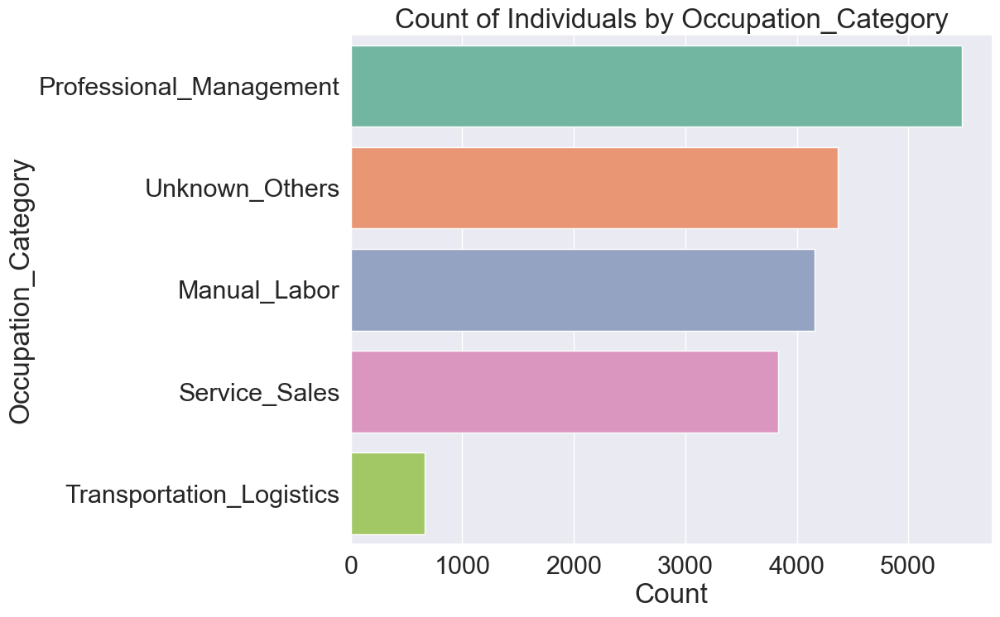

In [527]:
# 막대 그래프 시각화
plt.figure(figsize=(10, 8))
sns.barplot(x='Count', y='Occupation_Category', data=occupation_category, palette='Set2')
plt.title('Count of Individuals by Occupation_Category')
plt.xlabel('Count')
plt.ylabel('Occupation_Category')
plt.show()

Unknown이 너무 많음...

### Race

In [528]:
train['Race'].unique()

array(['White', 'Black', 'Native American/Aleut/Eskimo', 'Asian/Pacific',
       'Other'], dtype=object)

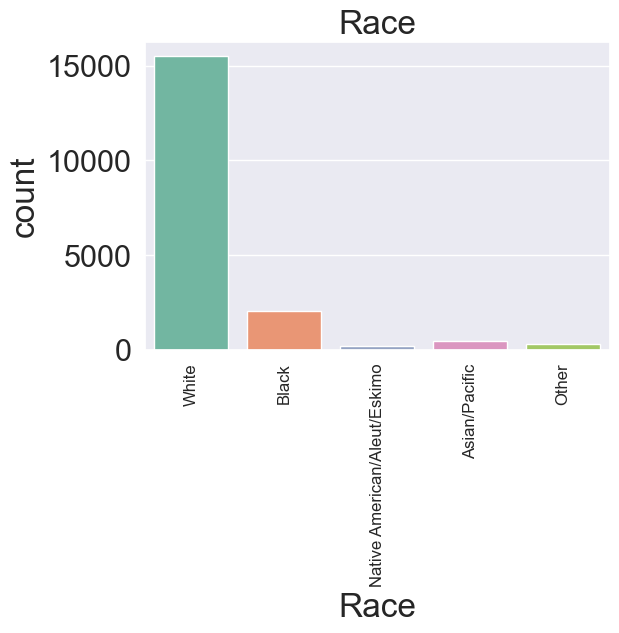

In [529]:
f, ax = plt.subplots(1, 1, figsize=(6, 4))

sns.countplot(x='Race', data=train, palette='Set2')
plt.title('Race')
plt.xticks(rotation = 90, fontsize=12);

백인, 흑인, 아시안, 기타, 원주민 순.  

### Martial_Status

In [530]:
train['Martial_Status'].unique()

array(['Married', 'Separated', 'Divorced', 'Widowed', 'Single',
       'Married (Spouse Absent)', 'Married (Armed Force Spouse)'],
      dtype=object)

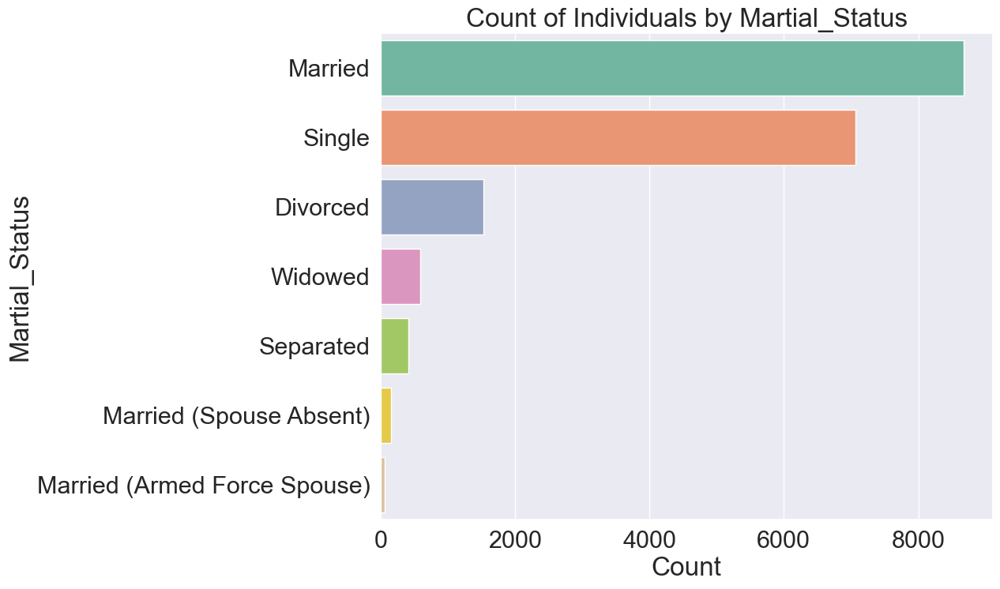

In [531]:
martial_status = pd.DataFrame(train['Martial_Status'].value_counts())
martial_status.reset_index(inplace=True)
martial_status.columns = ['Martial_Status', 'Count']  # 열 이름을 적절하게 설정

# 막대 그래프 시각화
plt.figure(figsize=(10, 8))
sns.barplot(x='Count', y='Martial_Status', data=martial_status, palette='Set2')
plt.title('Count of Individuals by Martial_Status')
plt.xlabel('Count')
plt.ylabel('Martial_Status')
plt.show()

결혼, 싱글의 수가 압도적으로 많으므로 기혼, 미혼, 기타로 묶어도 될 것 같다.

In [532]:
# 결혼 상태 매핑 정의
marital_status_mapping = {
    'Married': 'Married',
    'Separated': 'Other',
    'Divorced': 'Other',
    'Widowed': 'Other',
    'Single': 'Not Married',
    'Married (Spouse Absent)': 'Married',
    'Married (Armed Force Spouse)': 'Married'
}

# 'Martial_Status' 컬럼에 매핑을 적용하여 새로운 'Marital_Category' 컬럼을 생성
train['Marital_Category'] = train['Martial_Status'].map(marital_status_mapping)
test['Marital_Category'] = test['Martial_Status'].map(marital_status_mapping)


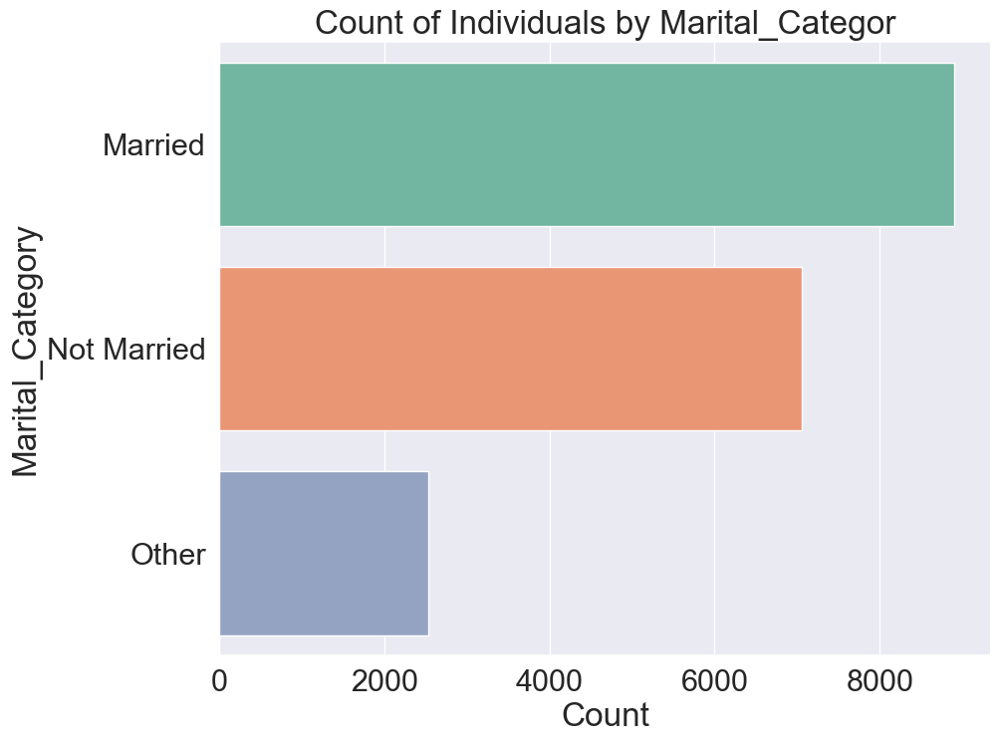

In [533]:
martial_category = pd.DataFrame(train['Marital_Category'].value_counts())
martial_category.reset_index(inplace=True)
martial_category.columns = ['Marital_Category', 'Count']  # 열 이름을 적절하게 설정

# 막대 그래프 시각화
plt.figure(figsize=(10, 8))
sns.barplot(x='Count', y='Marital_Category', data=martial_category, palette='Set2')
plt.title('Count of Individuals by Marital_Categor')
plt.xlabel('Count')
plt.ylabel('Marital_Category')
plt.show()

### Household_Summary

In [534]:
train['Household_Summary'].unique()

array(['Householder', 'Child 18 or older', 'Spouse of householder',
       'Other relative of householder', 'Child under 18 never married',
       'Nonrelative of householder',
       'Group Quarters- Secondary individual',
       'Child under 18 ever married'], dtype=object)

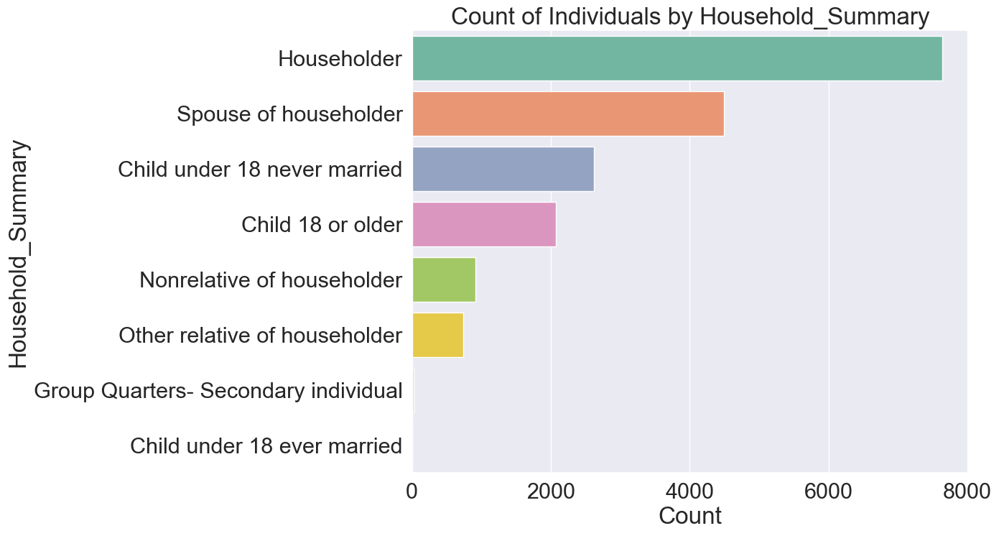

In [535]:
household_summary = pd.DataFrame(train['Household_Summary'].value_counts())
household_summary.reset_index(inplace=True)
household_summary.columns = ['Household_Summary', 'Count']  # 열 이름을 적절하게 설정

# 막대 그래프 시각화
plt.figure(figsize=(10, 8))
sns.barplot(x='Count', y='Household_Summary', data=household_summary, palette='Set2')
plt.title('Count of Individuals by Household_Summary')
plt.xlabel('Count')
plt.ylabel('Household_Summary')
plt.show()

In [536]:
# 가구 내 요약 상태 매핑 정의
household_summary_mapping = {
    'Householder': 'Householder',
    'Child 18 or older': 'Family Member',
    'Spouse of householder': 'Family Member',
    'Other relative of householder': 'Family Member',
    'Child under 18 never married': 'Family Member',
    'Nonrelative of householder': 'Nonrelative',
    'Group Quarters- Secondary individual': 'Nonrelative',
    'Child under 18 ever married': 'Family Member'
}

# 'Household_Summary' 컬럼에 매핑을 적용하여 새로운 'Household_Role' 컬럼을 생성
train['Household_Role'] = train['Household_Summary'].map(household_summary_mapping)
test['Household_Role'] = test['Household_Summary'].map(household_summary_mapping)

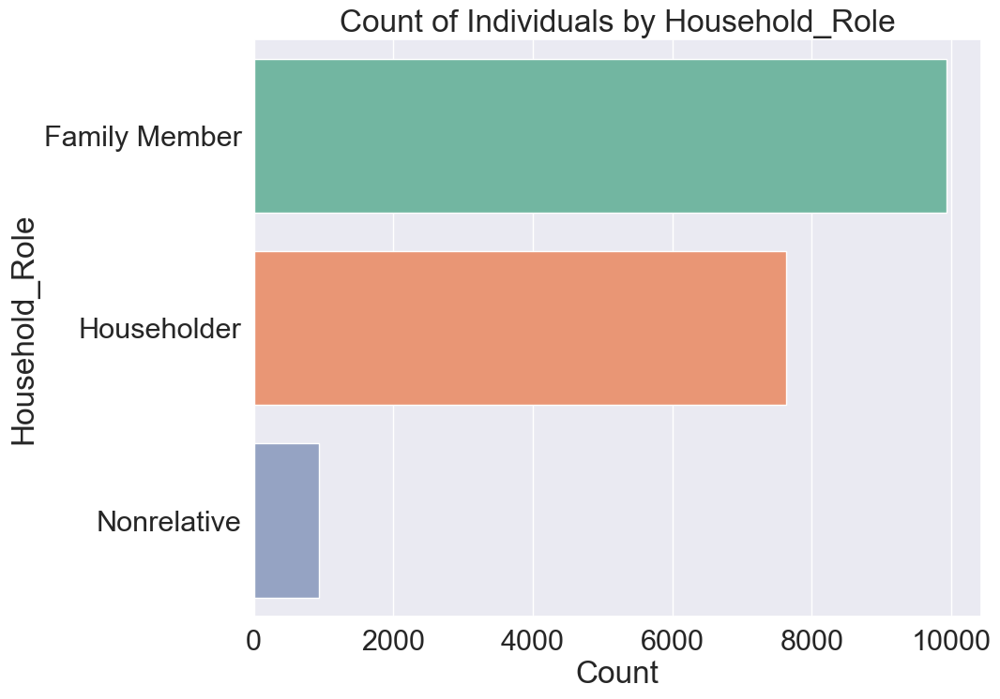

In [537]:
household_role = pd.DataFrame(train['Household_Role'].value_counts())
household_role.reset_index(inplace=True)
household_role.columns = ['Household_Role', 'Count']  # 열 이름을 적절하게 설정

# 막대 그래프 시각화
plt.figure(figsize=(10, 8))
sns.barplot(x='Count', y='Household_Role', data=household_role, palette='Set2')
plt.title('Count of Individuals by Household_Role')
plt.xlabel('Count')
plt.ylabel('Household_Role')
plt.show()

세대주가 아닌 사람 수가 더 많지만, 세대주인 사람도 많다.

### Citizenship

In [538]:
train['Citizenship'].unique()

array(['Native', 'Foreign-born (Non-US Citizen)',
       'Native (Born in Puerto Rico or US Outlying)',
       'Foreign-born (Naturalized US Citizen)', 'Native (Born Abroad)'],
      dtype=object)

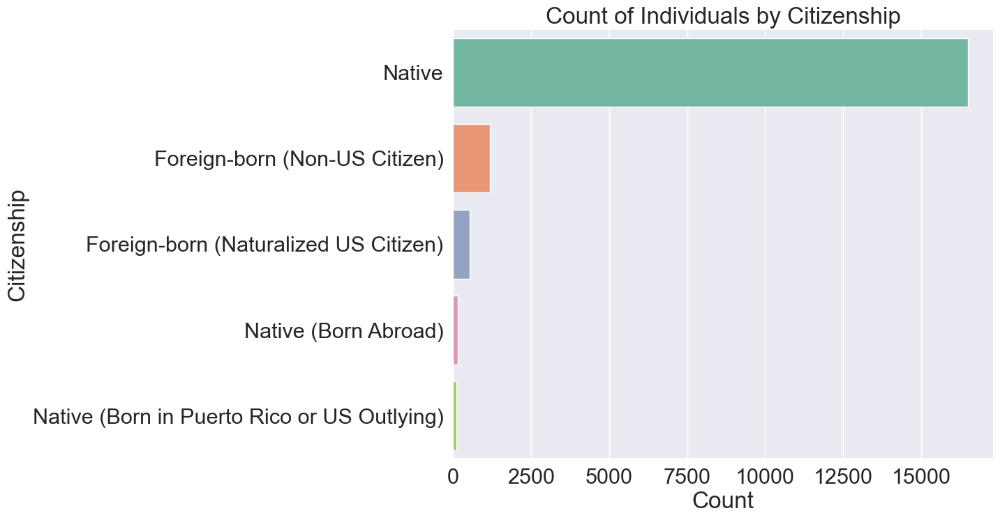

In [539]:
citizenship = pd.DataFrame(train['Citizenship'].value_counts())
citizenship.reset_index(inplace=True)
citizenship.columns = ['Citizenship', 'Count']  # 열 이름을 적절하게 설정

# 막대 그래프 시각화
plt.figure(figsize=(10, 8))
sns.barplot(x='Count', y='Citizenship', data=citizenship, palette='Set2')
plt.title('Count of Individuals by Citizenship')
plt.xlabel('Count')
plt.ylabel('Citizenship')
plt.show()

Native의 수가 압도적, feature engineering 적용

In [540]:
# 시민권 상태 매핑 정의
citizenship_mapping = {
    'Native': 'US Citizen',
    'Foreign-born (Non-US Citizen)': 'Non-US Citizen',
    'Native (Born in Puerto Rico or US Outlying)': 'US Citizen',
    'Foreign-born (Naturalized US Citizen)': 'US Citizen',
    'Native (Born Abroad)': 'US Citizen'
}

# 'Citizenship' 컬럼에 매핑을 적용하여 새로운 'Citizenship_Status' 컬럼을 생성
train['Citizenship_Status'] = train['Citizenship'].map(citizenship_mapping)
test['Citizenship_Status'] = test['Citizenship'].map(citizenship_mapping)


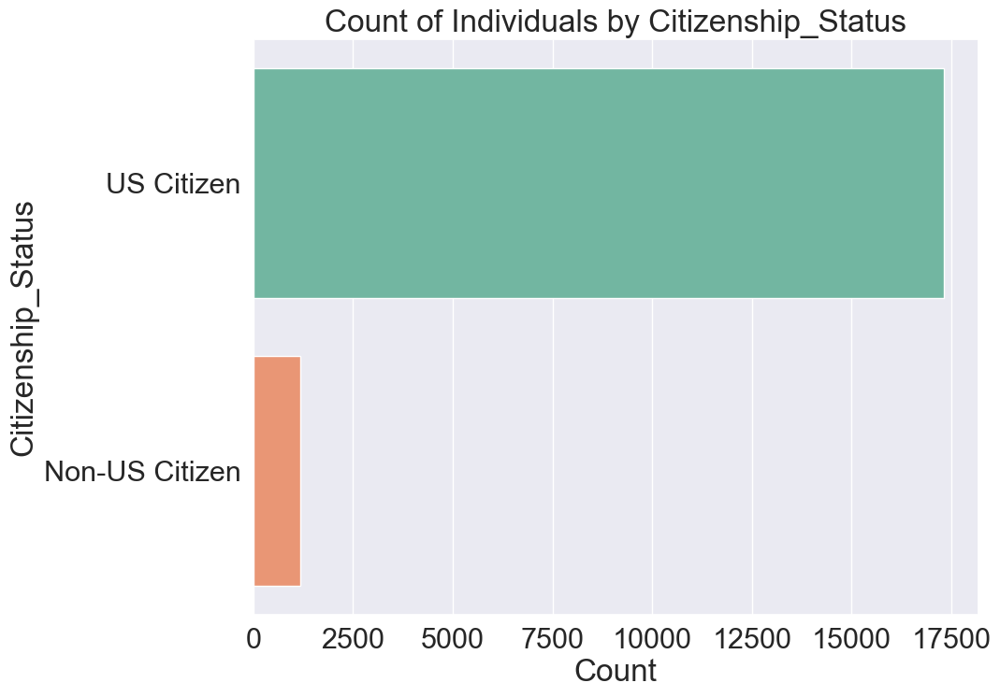

In [541]:
citizenship_status = pd.DataFrame(train['Citizenship_Status'].value_counts())
citizenship_status.reset_index(inplace=True)
citizenship_status.columns = ['Citizenship_Status', 'Count']  # 열 이름을 적절하게 설정

# 막대 그래프 시각화
plt.figure(figsize=(10, 8))
sns.barplot(x='Count', y='Citizenship_Status', data=citizenship_status, palette='Set2')
plt.title('Count of Individuals by Citizenship_Status')
plt.xlabel('Count')
plt.ylabel('Citizenship_Status')
plt.show()

### Tax_Status

In [542]:
train['Tax_Status'].unique()

array(['Nonfiler', 'Single',
       'Married Filling Jointly both under 65 (MFJ)',
       'Head of Household (HOH)',
       'Married Filling Jointly one over 65 & one under 65 (MFJ)',
       'Married Filling Jointly both over 65 (MFJ)'], dtype=object)

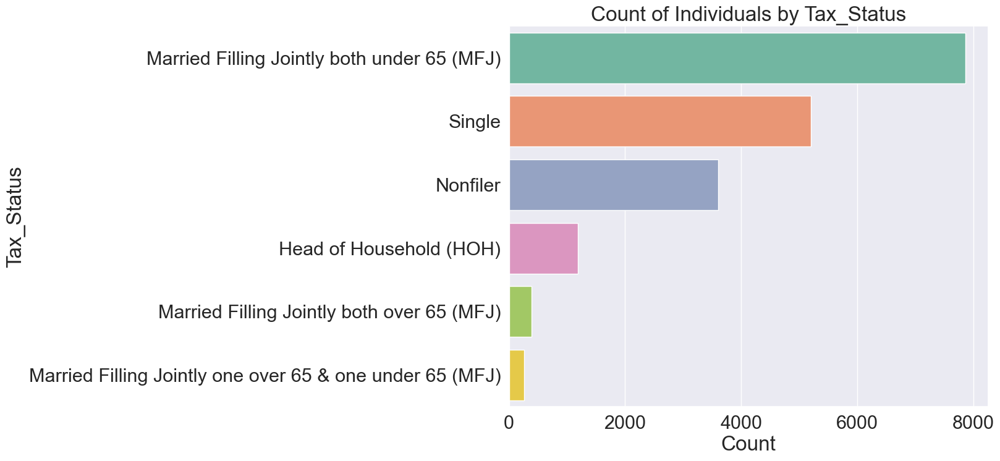

In [543]:
tax_status = pd.DataFrame(train['Tax_Status'].value_counts())
tax_status.reset_index(inplace=True)
tax_status.columns = ['Tax_Status', 'Count']  # 열 이름을 적절하게 설정

# 막대 그래프 시각화
plt.figure(figsize=(10, 8))
sns.barplot(x='Count', y='Tax_Status', data=tax_status, palette='Set2')
plt.title('Count of Individuals by Tax_Status')
plt.xlabel('Count')
plt.ylabel('Tax_Status')
plt.show()

In [544]:
# 세금 신고 상태 매핑 정의
tax_status_mapping = {
    'Nonfiler': 'Nonfiler',
    'Single': 'Single',
    'Married Filling Jointly both under 65 (MFJ)': 'Married',
    'Head of Household (HOH)': 'Single',
    'Married Filling Jointly one over 65 & one under 65 (MFJ)': 'Married',
    'Married Filling Jointly both over 65 (MFJ)': 'Married'
}

# 'Tax_Status' 컬럼에 매핑을 적용하여 새로운 'Tax_Filing_Status' 컬럼을 생성
train['Tax_Filing_Status'] = train['Tax_Status'].map(tax_status_mapping)
test['Tax_Filing_Status'] = test['Tax_Status'].map(tax_status_mapping)

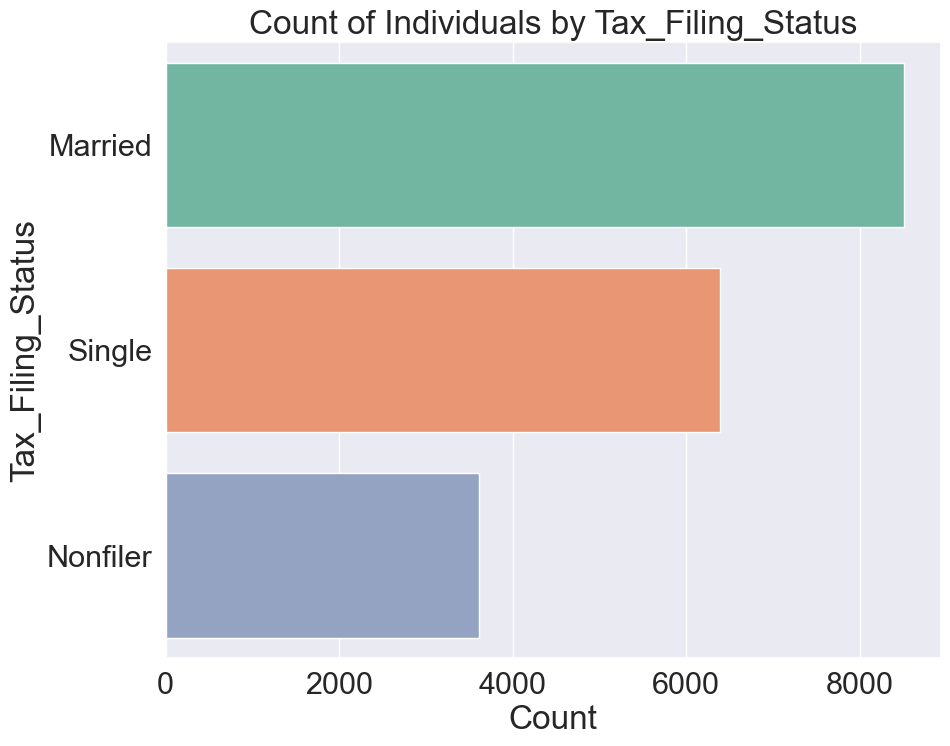

In [545]:
tax_filling_status = pd.DataFrame(train['Tax_Filing_Status'].value_counts())
tax_filling_status.reset_index(inplace=True)
tax_filling_status.columns = ['Tax_Filing_Status', 'Count']  # 열 이름을 적절하게 설정

# 막대 그래프 시각화
plt.figure(figsize=(10, 8))
sns.barplot(x='Count', y='Tax_Filing_Status', data=tax_filling_status, palette='Set2')
plt.title('Count of Individuals by Tax_Filing_Status')
plt.xlabel('Count')
plt.ylabel('Tax_Filing_Status')
plt.show()

### Income_Status

In [546]:
train['Income_Status'].unique()

array(['Unknown', 'Under Median', 'Over Median'], dtype=object)

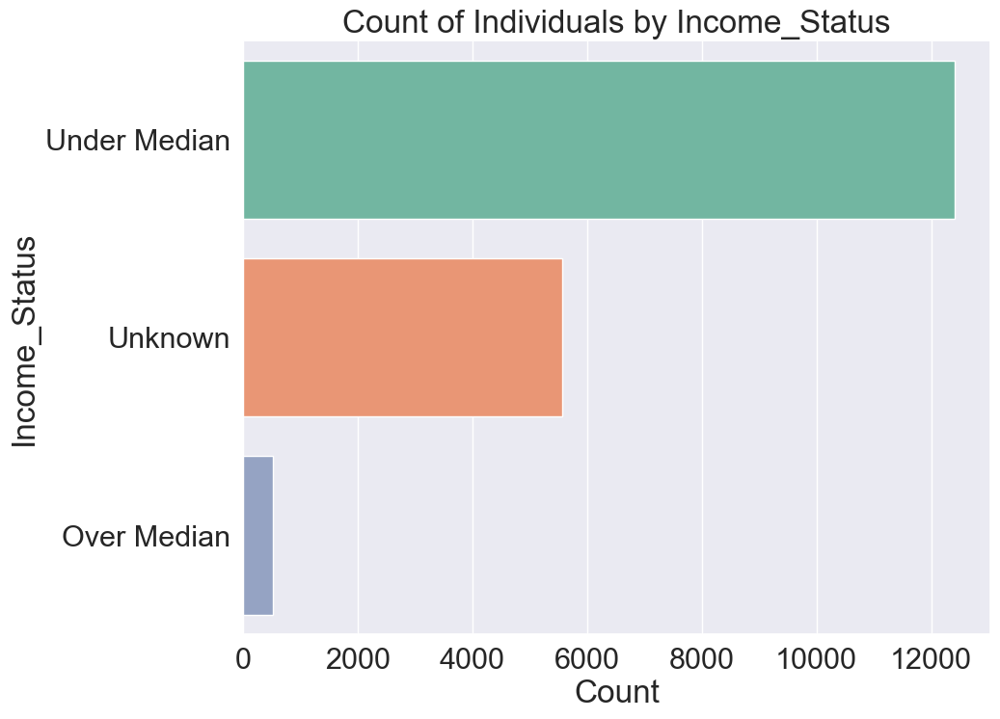

In [547]:
income_status = pd.DataFrame(train['Income_Status'].value_counts())
income_status.reset_index(inplace=True)
income_status.columns = ['Income_Status', 'Count']  # 열 이름을 적절하게 설정

# 막대 그래프 시각화
plt.figure(figsize=(10, 8))
sns.barplot(x='Count', y='Income_Status', data=income_status, palette='Set2')
plt.title('Count of Individuals by Income_Status')
plt.xlabel('Count')
plt.ylabel('Income_Status')
plt.show()

고소득자보자 저소득자의 비율이 훨씬 높다.

In [548]:
train.select_dtypes(include=['object']).columns

Index(['Gender', 'Education_Status', 'Employment_Status', 'Industry_Status',
       'Occupation_Status', 'Race', 'Martial_Status', 'Household_Summary',
       'Citizenship', 'Tax_Status', 'Income_Status', 'Education_Level',
       'Employment_Binary', 'Sector', 'Occupation_Category',
       'Marital_Category', 'Household_Role', 'Citizenship_Status',
       'Tax_Filing_Status'],
      dtype='object')

특성공학이 적용되지 않은 컬럼들은 우선 제외해보자.

In [549]:
categorical = train[['Gender', 'Education_Level', 'Employment_Binary', 'Sector', 'Occupation_Category', 'Race', 'Marital_Category', 'Household_Role', 'Citizenship_Status',  'Tax_Filing_Status']]

In [550]:
categorical.columns

Index(['Gender', 'Education_Level', 'Employment_Binary', 'Sector',
       'Occupation_Category', 'Race', 'Marital_Category', 'Household_Role',
       'Citizenship_Status', 'Tax_Filing_Status'],
      dtype='object')

범주형 데이터들의 상관관계를 알아보자.

In [551]:
import sklearn
print(sklearn.__version__)

1.2.2


In [552]:
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

encoder = OneHotEncoder(sparse=False)
categorical_encoded = encoder.fit_transform(categorical)

# Scikit-learn 1.0 이상 버전에서 사용
categorical_encoded_df = pd.DataFrame(categorical_encoded, 
                                      columns=encoder.get_feature_names_out())

print(categorical_encoded_df.head())

   Gender_F  Gender_M  Education_Level_Associate_Degree  \
0       0.0       1.0                               0.0   
1       0.0       1.0                               1.0   
2       1.0       0.0                               0.0   
3       0.0       1.0                               0.0   
4       1.0       0.0                               0.0   

   Education_Level_Bachelor_Degree  Education_Level_Doctorate_Degree  \
0                              0.0                               0.0   
1                              0.0                               0.0   
2                              0.0                               0.0   
3                              0.0                               0.0   
4                              0.0                               0.0   

   Education_Level_Elementary  Education_Level_High_School  \
0                         0.0                          0.0   
1                         0.0                          0.0   
2                         

Text(0.5, 1.0, 'Correlation Matrix of Numerical Variables')

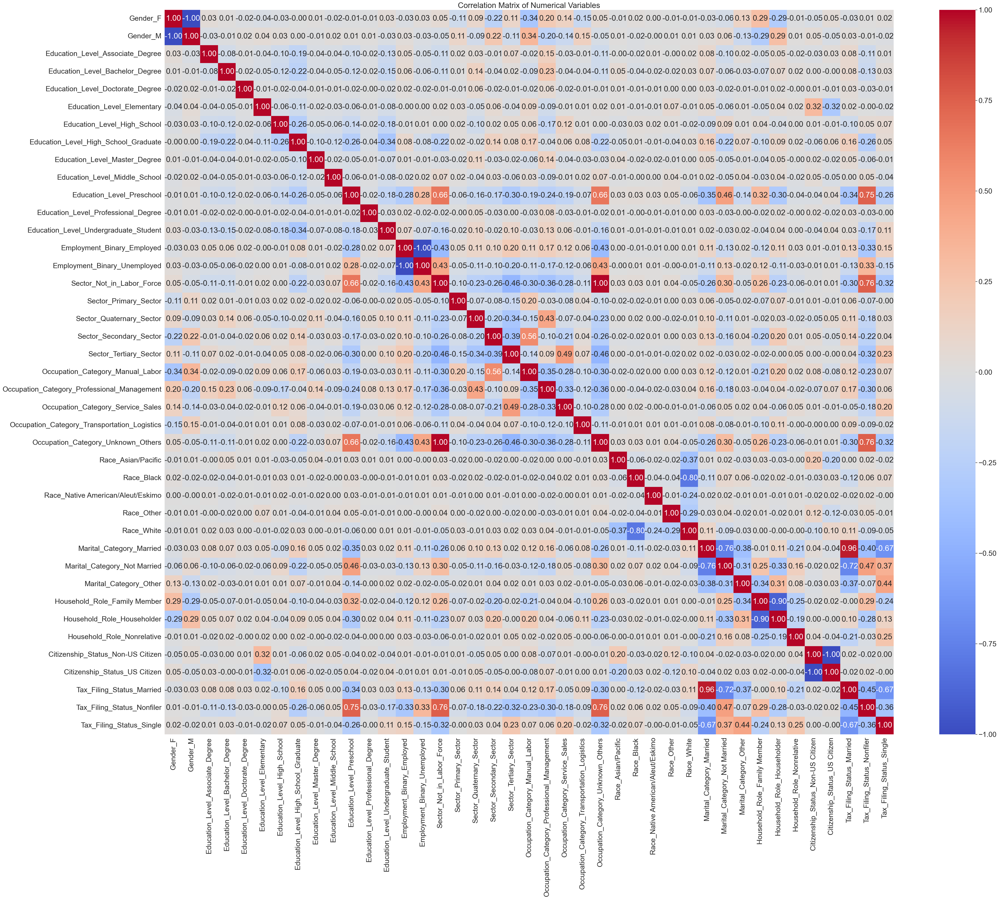

In [553]:
corr_matrix = categorical_encoded_df.corr()
plt.figure(figsize = (50, 40))
sns.heatmap(corr_matrix, annot = True, cmap = 'coolwarm', fmt = '.2f')
plt.title('Correlation Matrix of Numerical Variables')

In [554]:
high_corr = corr_matrix[abs(corr_matrix) >= 0.5]
high_corr_pairs = high_corr.stack().reset_index()
high_corr_pairs = high_corr_pairs[high_corr_pairs['level_0'] != high_corr_pairs['level_1']]
# high_corr_pairs.sort_values(by = 0, ascending = False)
high_corr_pairs

,level_0,level_1,0
1,Gender_F,Gender_M,-1.000000
2,Gender_M,Gender_F,-1.000000
13,Education_Level_Preschool,Sector_Not_in_Labor_Force,0.660466
14,Education_Level_Preschool,Occupation_Category_Unknown_Others,0.660466
15,Education_Level_Preschool,Tax_Filing_Status_Nonfiler,0.745486
19,Employment_Binary_Employed,Employment_Binary_Unemployed,-1.000000
20,Employment_Binary_Unemployed,Employment_Binary_Employed,-1.000000
22,Sector_Not_in_Labor_Force,Education_Level_Preschool,0.660466
24,Sector_Not_in_Labor_Force,Occupation_Category_Unknown_Others,1.000000
25,Sector_Not_in_Labor_Force,Tax_Filing_Status_Nonfiler,0.757504


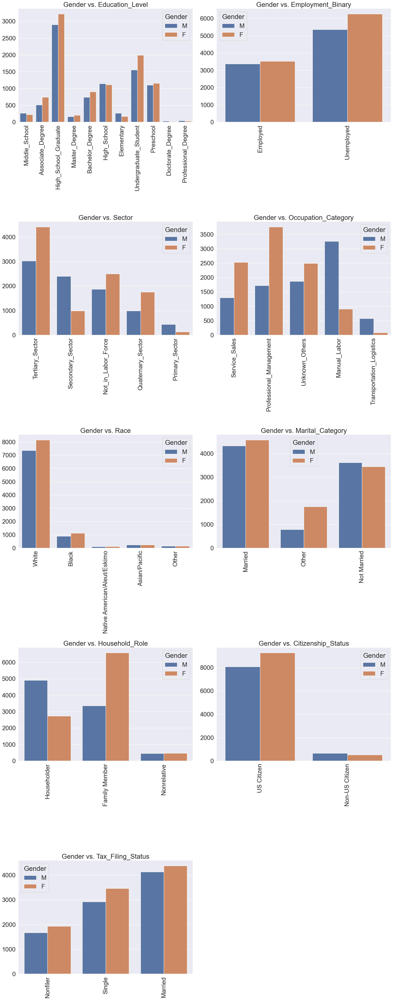

In [555]:
### Gender vs. Education_Level
### Gender vs. Employment_Binary
### Gender vs. Sector
### Gender vs. Occupation_Category
### Gender vs. Race
### Gender vs. Marital_Category
### Gender vs. Household_Role
### Gender vs. Citizenship_Status
### Gender vs. Tax_Filing_Status

import matplotlib.pyplot as plt
import seaborn as sns

# 비교할 변수 리스트
variables = ['Education_Level', 'Employment_Binary', 'Sector', 'Occupation_Category',
             'Race', 'Marital_Category', 'Household_Role', 'Citizenship_Status', 'Tax_Filing_Status']

# 서브플롯 생성
fig, axes = plt.subplots(5, 2, figsize=(20, 50))  # 전체 그래프의 크기 조정 가능
fig.tight_layout(pad=5.0)  # 서브플롯 간의 간격 조정

# 각 변수별로 countplot 그리기
for i, variable in enumerate(variables):
    row = i // 2
    col = i % 2
    sns.countplot(x=variable, hue='Gender', data=train, ax=axes[row, col])
    axes[row, col].set_title(f'Gender vs. {variable}')
    axes[row, col].set_xlabel('')
    axes[row, col].set_ylabel('')
    axes[row, col].tick_params(axis='x', rotation=90)  # x 레이블 회전

# 마지막 서브플롯(빈 공간) 숨기기
if len(variables) < 10:
    axes[4, 1].axis('off')

plt.tight_layout()
plt.show()

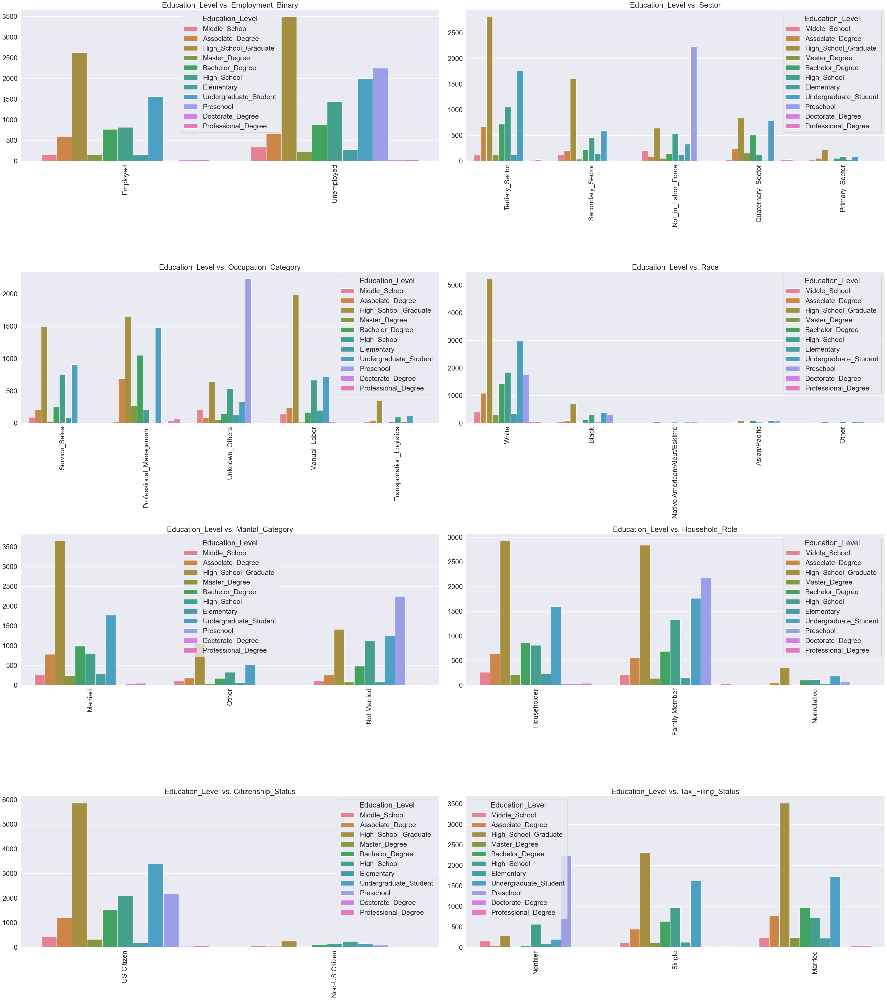

In [556]:
### Education_Level vs. Employment_Binary
### Education_Level vs. Sector
### Education_Level vs. Occupation_Category
### Education_Level vs. Race
### Education_Level vs. Marital_Category
### Education_Level vs. Household_Role
### Education_Level vs. Citizenship_Status
### Education_Level vs. Tax_Filing_Status

# 비교할 변수 리스트
variables = ['Employment_Binary', 'Sector', 'Occupation_Category',
             'Race', 'Marital_Category', 'Household_Role', 'Citizenship_Status', 'Tax_Filing_Status']

# 서브플롯 생성
fig, axes = plt.subplots(4, 2, figsize=(40, 45))  # 전체 그래프의 크기 조정 가능
fig.tight_layout(pad=5.0)  # 서브플롯 간의 간격 조정

# 각 변수별로 countplot 그리기
for i, variable in enumerate(variables):
    row = i // 2
    col = i % 2
    sns.countplot(x=variable, hue='Education_Level', data=train, ax=axes[row, col])
    axes[row, col].set_title(f'Education_Level vs. {variable}')
    axes[row, col].set_xlabel('')
    axes[row, col].set_ylabel('')
    axes[row, col].tick_params(axis='x', rotation=90)  # x 레이블 회전

# # 마지막 서브플롯(빈 공간) 숨기기
# if len(variables) < 10:
#     axes[4, 1].axis('off')

plt.tight_layout()
plt.show()

유아동교육만 받은 사람은 일도 못하고 결혼도 못하고 세금도 못냄 흑흑

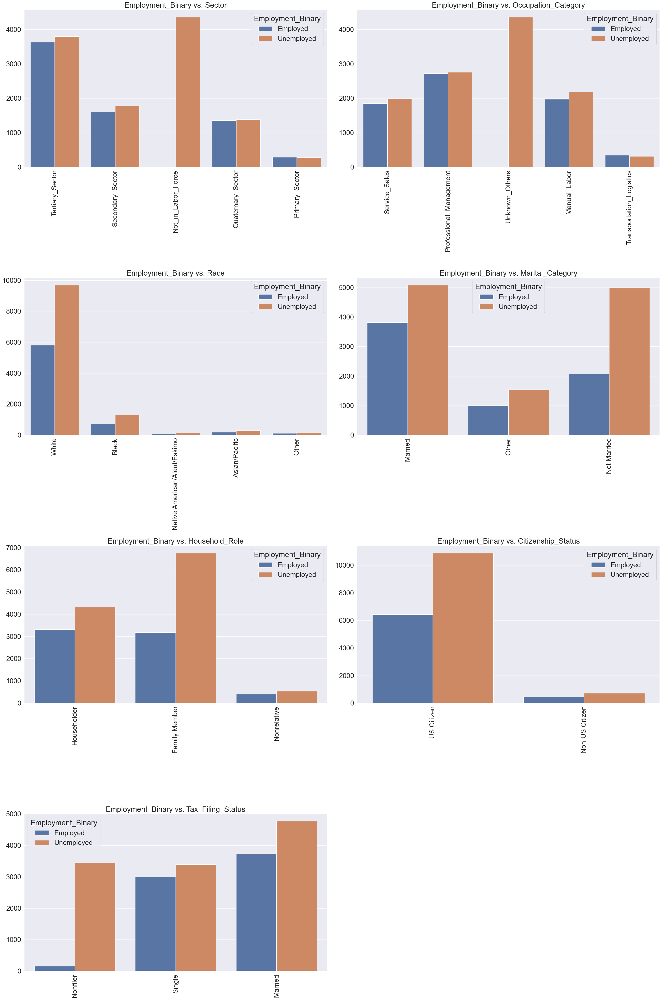

In [557]:
### Employment_Binary vs. Sector
### Employment_Binary vs. Occupation_Category
### Employment_Binary vs. Race
### Employment_Binary vs. Marital_Category
### Employment_Binary vs. Household_Role
### Employment_Binary vs. Citizenship_Status
### Employment_Binary vs. Tax_Filing_Status

# 비교할 변수 리스트
variables = ['Sector', 'Occupation_Category',
             'Race', 'Marital_Category', 'Household_Role', 'Citizenship_Status', 'Tax_Filing_Status']

# 서브플롯 생성
fig, axes = plt.subplots(4, 2, figsize=(30, 45))  # 전체 그래프의 크기 조정 가능
fig.tight_layout(pad=5.0)  # 서브플롯 간의 간격 조정

# 각 변수별로 countplot 그리기
for i, variable in enumerate(variables):
    row = i // 2
    col = i % 2
    sns.countplot(x=variable, hue='Employment_Binary', data=train, ax=axes[row, col])
    axes[row, col].set_title(f'Employment_Binary vs. {variable}')
    axes[row, col].set_xlabel('')
    axes[row, col].set_ylabel('')
    axes[row, col].tick_params(axis='x', rotation=90)  # x 레이블 회전

# 마지막 서브플롯(빈 공간) 숨기기
if len(variables) < 10:
    axes[3, 1].axis('off')

plt.tight_layout()
plt.show()

대부분의 상황에서 비고용 상태가 고용상태보다 많음

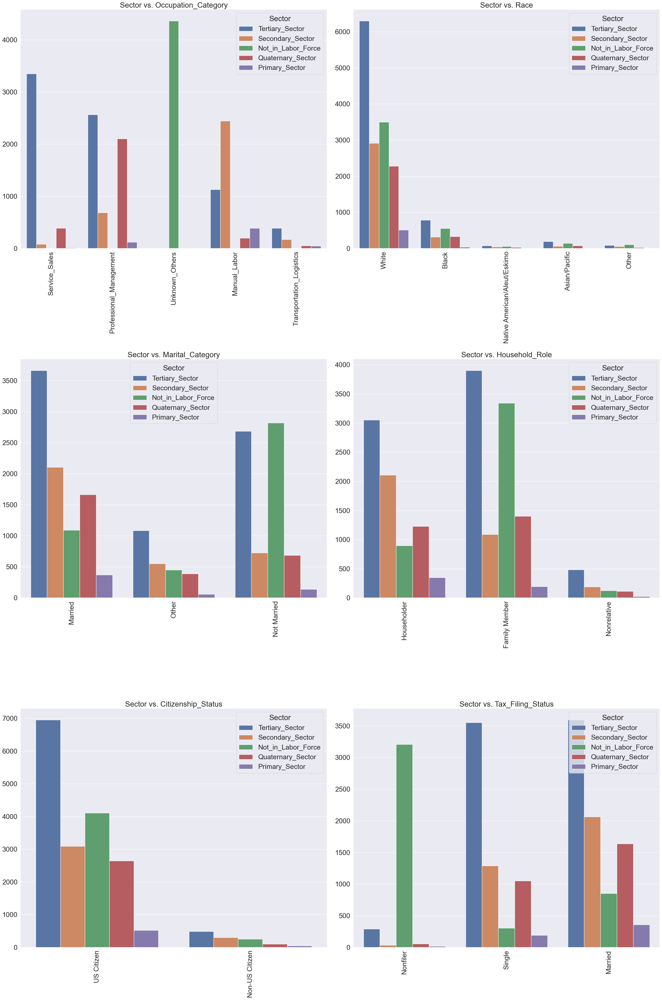

In [558]:
### Sector vs. Occupation_Category
### Sector vs. Race
### Sector vs. Marital_Category
### Sector vs. Household_Role
### Sector vs. Citizenship_Status
### Sector vs. Tax_Filing_Status

# 비교할 변수 리스트
variables = ['Occupation_Category',
             'Race', 'Marital_Category', 'Household_Role', 'Citizenship_Status', 'Tax_Filing_Status']

# 서브플롯 생성
fig, axes = plt.subplots(3, 2, figsize=(30, 45))  # 전체 그래프의 크기 조정 가능
fig.tight_layout(pad=5.0)  # 서브플롯 간의 간격 조정

# 각 변수별로 countplot 그리기
for i, variable in enumerate(variables):
    row = i // 2
    col = i % 2
    sns.countplot(x=variable, hue='Sector', data=train, ax=axes[row, col])
    axes[row, col].set_title(f'Sector vs. {variable}')
    axes[row, col].set_xlabel('')
    axes[row, col].set_ylabel('')
    axes[row, col].tick_params(axis='x', rotation=90)  # x 레이블 회전

# # 마지막 서브플롯(빈 공간) 숨기기
# if len(variables) < 10:
#     axes[3, 1].axis('off')

plt.tight_layout()
plt.show()

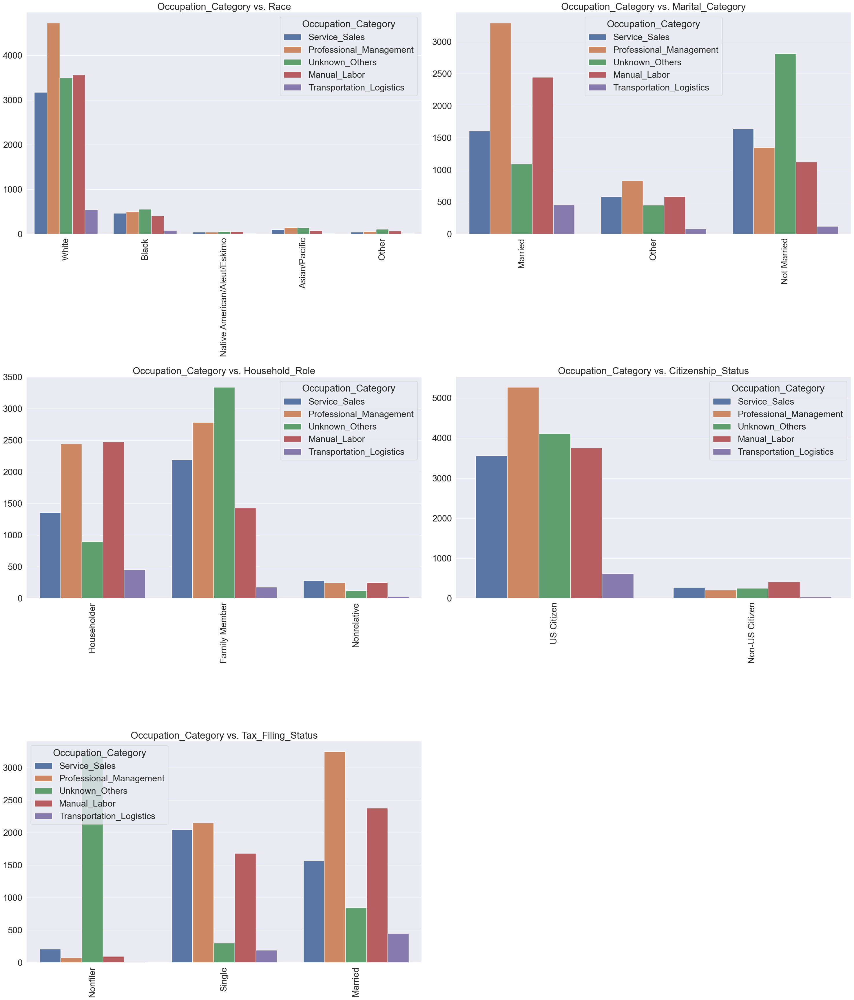

In [559]:
### Occupation_Category vs. Race
### Occupation_Category vs. Marital_Category
### Occupation_Category vs. Household_Role
### Occupation_Category vs. Citizenship_Status
### Occupation_Category vs. Tax_Filing_Status

# 비교할 변수 리스트
variables = ['Race', 'Marital_Category', 'Household_Role', 'Citizenship_Status', 'Tax_Filing_Status']

# 서브플롯 생성
fig, axes = plt.subplots(3, 2, figsize=(30, 35))  # 전체 그래프의 크기 조정 가능
fig.tight_layout(pad=5.0)  # 서브플롯 간의 간격 조정

# 각 변수별로 countplot 그리기
for i, variable in enumerate(variables):
    row = i // 2
    col = i % 2
    sns.countplot(x=variable, hue='Occupation_Category', data=train, ax=axes[row, col])
    axes[row, col].set_title(f'Occupation_Category vs. {variable}')
    axes[row, col].set_xlabel('')
    axes[row, col].set_ylabel('')
    axes[row, col].tick_params(axis='x', rotation=90)  # x 레이블 회전

# # 마지막 서브플롯(빈 공간) 숨기기
if len(variables) < 10:
    axes[2, 1].axis('off')

plt.tight_layout()
plt.show()

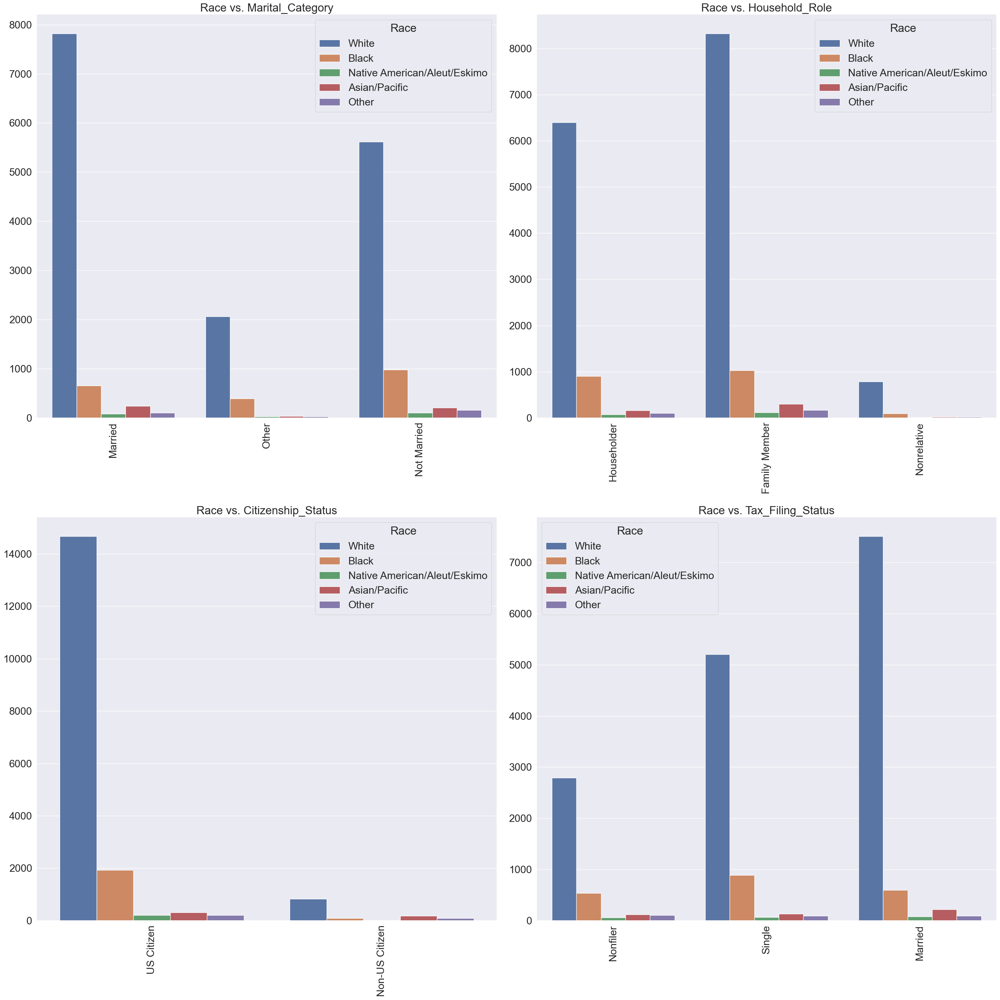

In [560]:
### Race vs. Marital_Category
### Race vs. Household_Role
### Race vs. Citizenship_Status
### Race vs. Tax_Filing_Status

### Occupation_Category vs. Race
### Occupation_Category vs. Marital_Category
### Occupation_Category vs. Household_Role
### Occupation_Category vs. Citizenship_Status
### Occupation_Category vs. Tax_Filing_Status

# 비교할 변수 리스트
variables = ['Marital_Category', 'Household_Role', 'Citizenship_Status', 'Tax_Filing_Status']

# 서브플롯 생성
fig, axes = plt.subplots(2, 2, figsize=(30, 30))  # 전체 그래프의 크기 조정 가능
fig.tight_layout(pad=5.0)  # 서브플롯 간의 간격 조정

# 각 변수별로 countplot 그리기
for i, variable in enumerate(variables):
    row = i // 2
    col = i % 2
    sns.countplot(x=variable, hue='Race', data=train, ax=axes[row, col])
    axes[row, col].set_title(f'Race vs. {variable}')
    axes[row, col].set_xlabel('')
    axes[row, col].set_ylabel('')
    axes[row, col].tick_params(axis='x', rotation=90)  # x 레이블 회전

# # # 마지막 서브플롯(빈 공간) 숨기기
# if len(variables) < 10:
#     axes[2, 1].axis('off')

plt.tight_layout()
plt.show()

백인이 미국을 지배한다 껄껄

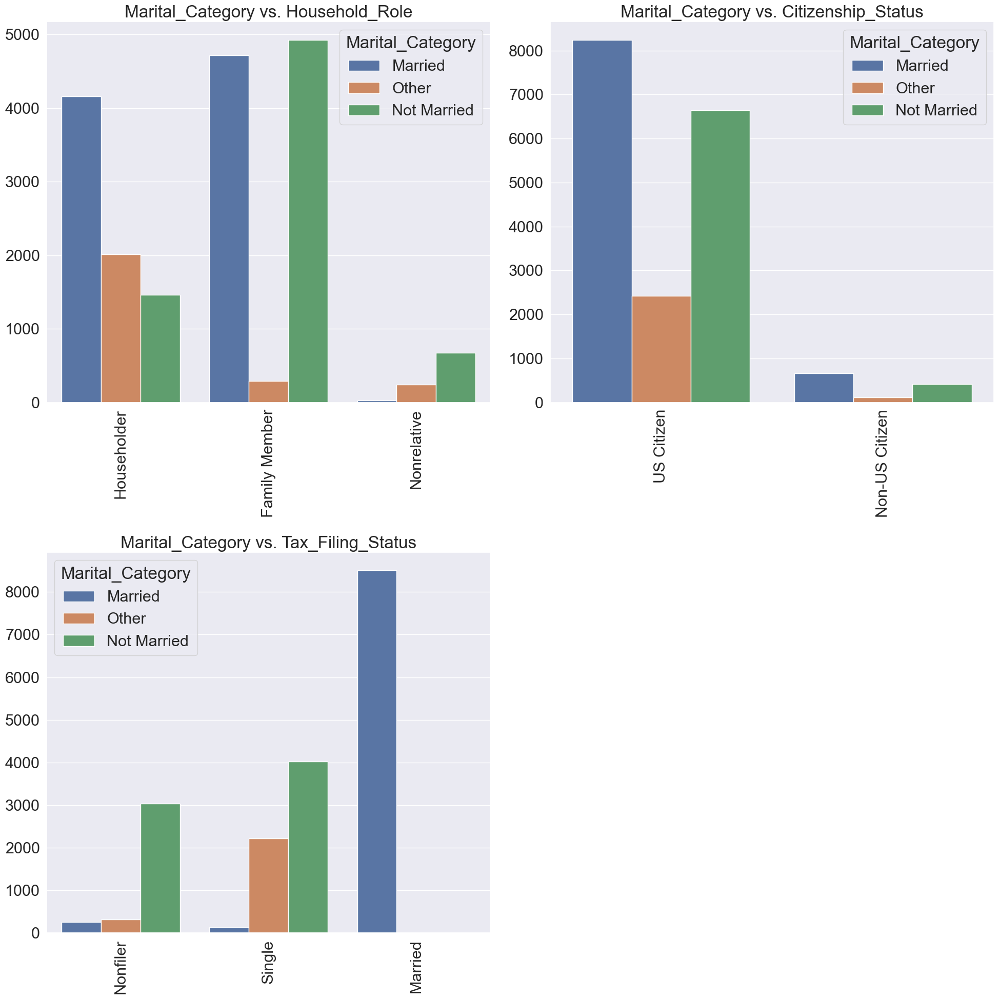

In [561]:
### Marital_Category vs. Household_Role
### Marital_Category vs. Citizenship_Status
### Marital_Category vs. Tax_Filing_Status

# 비교할 변수 리스트
variables = ['Household_Role', 'Citizenship_Status', 'Tax_Filing_Status']

# 서브플롯 생성
fig, axes = plt.subplots(2, 2, figsize=(20, 20))  # 전체 그래프의 크기 조정 가능
fig.tight_layout(pad=5.0)  # 서브플롯 간의 간격 조정

# 각 변수별로 countplot 그리기
for i, variable in enumerate(variables):
    row = i // 2
    col = i % 2
    sns.countplot(x=variable, hue='Marital_Category', data=train, ax=axes[row, col])
    axes[row, col].set_title(f'Marital_Category vs. {variable}')
    axes[row, col].set_xlabel('')
    axes[row, col].set_ylabel('')
    axes[row, col].tick_params(axis='x', rotation=90)  # x 레이블 회전

# # 마지막 서브플롯(빈 공간) 숨기기
if len(variables) < 10:
    axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

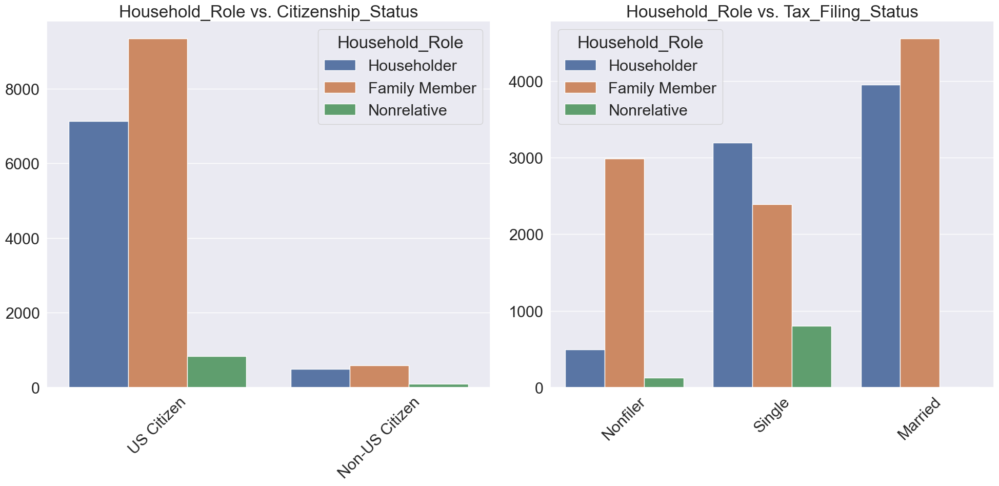

In [562]:
### Household_Role vs. Citizenship_Status
### Household_Role vs. Tax_Filing_Status

# 비교할 변수 리스트
variables = ['Citizenship_Status', 'Tax_Filing_Status']

# 서브플롯 생성
fig, axes = plt.subplots(1, 2, figsize=(20, 10))  # 전체 그래프의 크기 조정 및 축의 방향 수정
fig.tight_layout(pad=5.0)  # 서브플롯 간의 간격 조정

# 각 변수별로 countplot 그리기
for i, variable in enumerate(variables):
    sns.countplot(x=variable, hue='Household_Role', data=train, ax=axes[i])
    axes[i].set_title(f'Household_Role vs. {variable}')
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', rotation=45)  # x 레이블 회전 조정

plt.tight_layout()
plt.show()


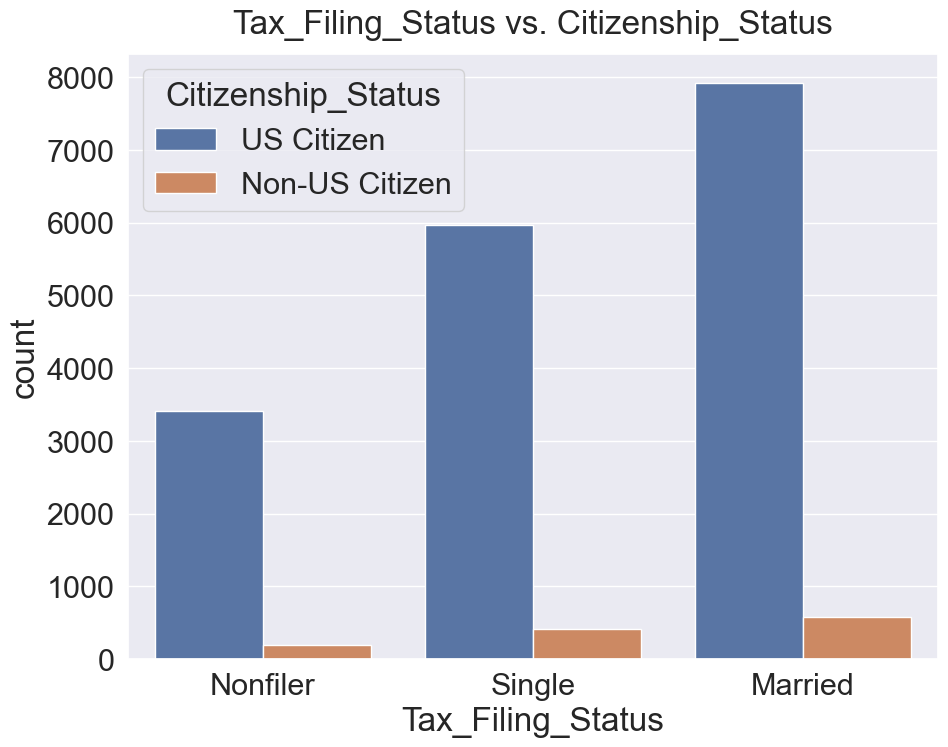

In [563]:
### Citizenship_Status vs. Tax_Filing_Status

f, ax = plt.subplots(1, 1, figsize = (10, 8))

# gender vs. income
sns.countplot(x = 'Tax_Filing_Status', hue = 'Citizenship_Status', data = train)
ax.set_title('Tax_Filing_Status vs. Citizenship_Status', y = 1.02)

plt.tight_layout()
plt.show()

## 2.3 Numerical vs. Categorical data

In [564]:
numeric.columns

Index(['Age', 'Working_Week (Yearly)', 'Gains', 'Losses', 'Dividends',
       'Income', 'Net Capital Gain', 'Investment Income'],
      dtype='object')

In [565]:
categorical.columns

Index(['Gender', 'Education_Level', 'Employment_Binary', 'Sector',
       'Occupation_Category', 'Race', 'Marital_Category', 'Household_Role',
       'Citizenship_Status', 'Tax_Filing_Status'],
      dtype='object')

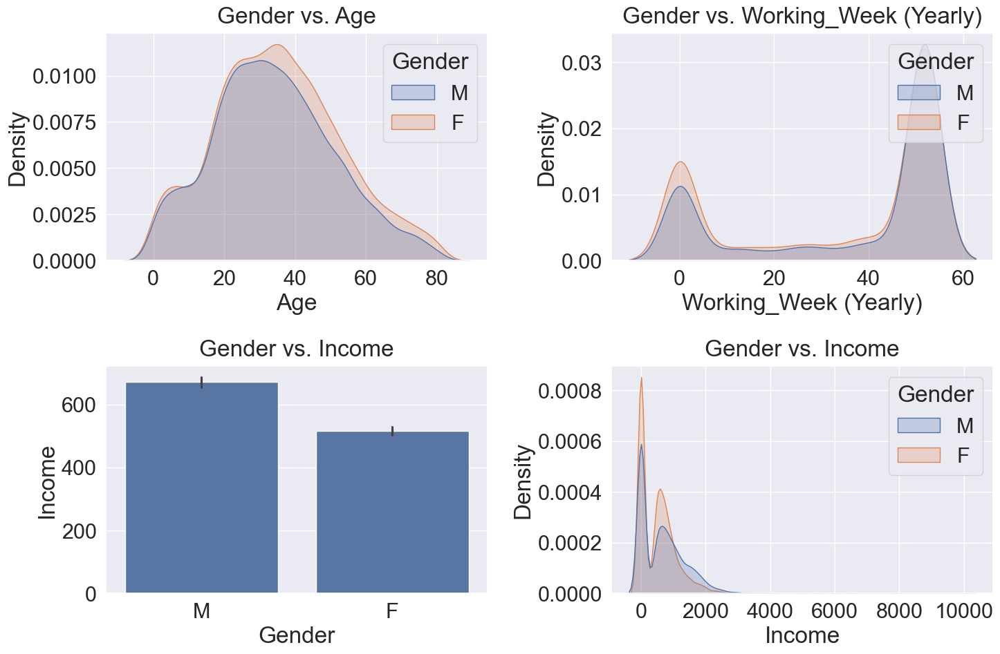

In [566]:
f, ax = plt.subplots(2, 2, figsize = (15, 10))

# Gender vs. Age
sns.kdeplot(x = 'Age', hue = 'Gender', data = train, fill = True, ax = ax[0,0])
ax[0,0].set_title('Gender vs. Age', y = 1.02)

# Gender vs. Working_Week (Yearly)
sns.kdeplot(x = 'Working_Week (Yearly)', hue = 'Gender', data = train, fill = True, ax = ax[0,1])
ax[0,1].set_title('Gender vs. Working_Week (Yearly)', y = 1.02)

# Gender vs. Age
sns.barplot(x = 'Gender', y = 'Income', data = train, ax = ax[1,0])
ax[1,0].set_title('Gender vs. Income', y = 1.02)
sns.kdeplot(x = 'Income', hue = 'Gender', data = train, fill = True, ax = ax[1,1])
ax[1,1].set_title('Gender vs. Income', y = 1.02)

plt.tight_layout()

- 연령대는 거의 비슷하지만, 약 30대 이후로는 여성이 약간 더 많음.
- 업무시간 극과극.
- 일하는 여성이 더 많지만, 평균 소득은 남성이 더 높음.
- 여성의 소득 범주가 더 좁고, 소득이 더 낮은 일에 종사하는 경우가 더 많음.

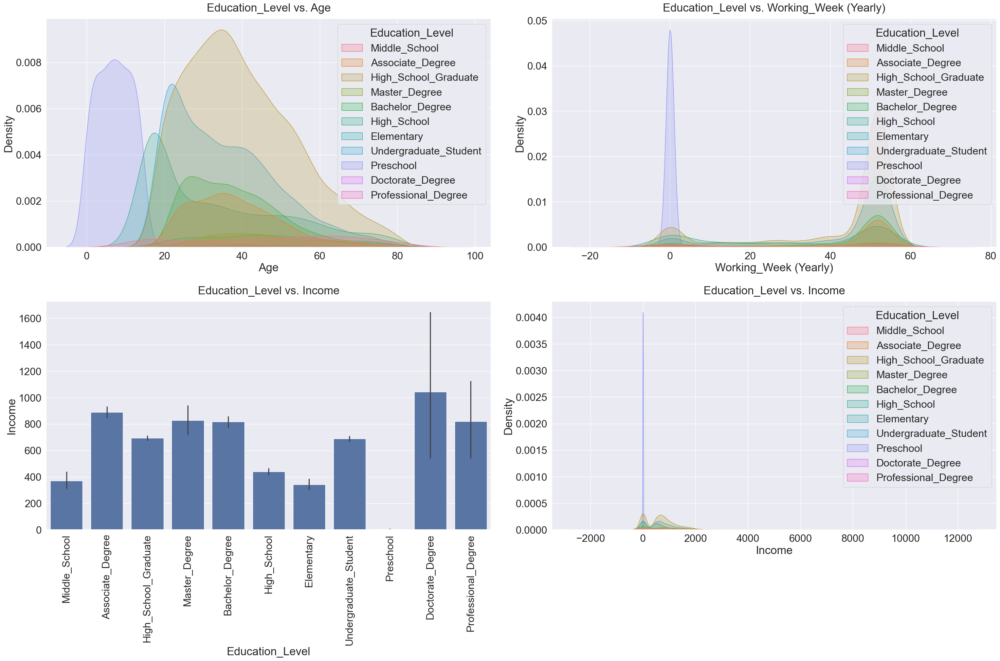

In [567]:
f, ax = plt.subplots(2, 2, figsize = (30, 20))

# Education_Level vs. Age
sns.kdeplot(x = 'Age', hue = 'Education_Level', data = train, fill = True, ax = ax[0,0])
ax[0,0].set_title('Education_Level vs. Age', y = 1.02)

# Education_Level vs. Working_Week (Yearly)
sns.kdeplot(x = 'Working_Week (Yearly)', hue = 'Education_Level', data = train, fill = True, ax = ax[0,1])
ax[0,1].set_title('Education_Level vs. Working_Week (Yearly)', y = 1.02)

# Education_Level vs. Age
sns.barplot(x = 'Education_Level', y = 'Income', data = train, ax = ax[1,0])
ax[1,0].set_title('Education_Level vs. Income', y = 1.02)
ax[1, 0].tick_params(axis='x', rotation=90)

sns.kdeplot(x = 'Income', hue = 'Education_Level', data = train, fill = True, ax = ax[1,1])
ax[1,1].set_title('Education_Level vs. Income', y = 1.02)

plt.tight_layout()

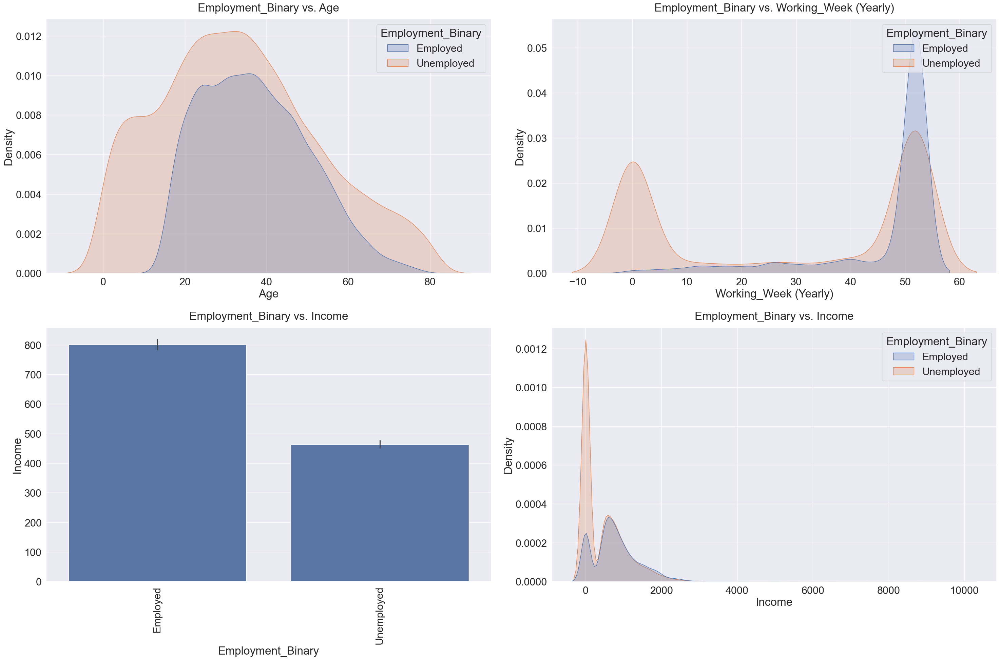

In [568]:
f, ax = plt.subplots(2, 2, figsize = (30, 20))

# Employment_Binary vs. Age
sns.kdeplot(x = 'Age', hue = 'Employment_Binary', data = train, fill = True, ax = ax[0,0])
ax[0,0].set_title('Employment_Binary vs. Age', y = 1.02)

# Employment_Binary vs. Working_Week (Yearly)
sns.kdeplot(x = 'Working_Week (Yearly)', hue = 'Employment_Binary', data = train, fill = True, ax = ax[0,1])
ax[0,1].set_title('Employment_Binary vs. Working_Week (Yearly)', y = 1.02)

# Employment_Binary vs. Age
sns.barplot(x = 'Employment_Binary', y = 'Income', data = train, ax = ax[1,0])
ax[1,0].set_title('Employment_Binary vs. Income', y = 1.02)
ax[1, 0].tick_params(axis='x', rotation=90)

sns.kdeplot(x = 'Income', hue = 'Employment_Binary', data = train, fill = True, ax = ax[1,1])
ax[1,1].set_title('Employment_Binary vs. Income', y = 1.02)

plt.tight_layout()

고용이 안되었는데 working week가 있는 건 모죠? 봅시다.

In [569]:
train[(train['Employment_Binary'] == 'Unemployed') & (train['Working_Week (Yearly)'] != 0)]

,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Martial_Status,Household_Summary,Citizenship,Tax_Status,Gains,Losses,Dividends,Income_Status,Income,Net Capital Gain,Investment Income,Education_Level,Employment_Binary,Sector,Occupation_Category,Marital_Category,Household_Role,Citizenship_Status,Tax_Filing_Status
7,64,M,Masters degree,Not Working,5,Not in universe or children,Unknown,White,Married,Householder,Native,Married Filling Jointly both under 65 (MFJ),0,0,2052,Under Median,0,0,2052,Master_Degree,Unemployed,Not_in_Labor_Force,Unknown_Others,Married,Householder,US Citizen,Married
8,24,F,Bachelors degree,Children or Armed Forces,52,Retail,Sales,White,Single,Child 18 or older,Native,Single,0,0,0,Under Median,0,0,0,Bachelor_Degree,Unemployed,Tertiary_Sector,Service_Sales,Not Married,Family Member,US Citizen,Single
9,53,M,High graduate,Seeking Full-Time,30,Construction,Machine Operators & Inspectors,White,Married,Householder,Native,Married Filling Jointly both under 65 (MFJ),0,0,0,Under Median,0,0,0,High_School_Graduate,Unemployed,Secondary_Sector,Manual_Labor,Married,Householder,US Citizen,Married
10,56,F,High graduate,Children or Armed Forces,52,Hospitals,Services,Black,Married,Spouse of householder,Native,Married Filling Jointly one over 65 & one under 65 (MFJ),0,0,0,Under Median,0,0,0,High_School_Graduate,Unemployed,Tertiary_Sector,Service_Sales,Married,Family Member,US Citizen,Married
17,48,F,Bachelors degree,Children or Armed Forces,52,Finance Insurance & Real Estate,Management,White,Divorced,Householder,Native,Single,0,0,0,Under Median,850,0,0,Bachelor_Degree,Unemployed,Quaternary_Sector,Professional_Management,Other,Householder,US Citizen,Single
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19988,33,F,High graduate,Children or Armed Forces,12,Education,Admin Support (include Clerical),White,Married,Spouse of householder,Native,Married Filling Jointly both under 65 (MFJ),0,0,0,Under Median,425,0,0,High_School_Graduate,Unemployed,Quaternary_Sector,Professional_Management,Married,Family Member,US Citizen,Married
19991,51,F,High graduate,Children or Armed Forces,48,Retail,Management,White,Married,Spouse of householder,Native,Married Filling Jointly both under 65 (MFJ),0,0,0,Unknown,800,0,0,High_School_Graduate,Unemployed,Tertiary_Sector,Professional_Management,Married,Family Member,US Citizen,Married
19995,33,M,High graduate,Children or Armed Forces,52,Manufacturing (Durable),Handlers/Cleaners,White,Single,Householder,Native,Single,0,0,0,Under Median,1300,0,0,High_School_Graduate,Unemployed,Secondary_Sector,Manual_Labor,Not Married,Householder,US Citizen,Single
19997,22,M,College,Children or Armed Forces,52,Transportation,Technicians & Support,White,Single,Group Quarters- Secondary individual,Native,Single,0,0,0,Unknown,999,0,0,Undergraduate_Student,Unemployed,Tertiary_Sector,Professional_Management,Not Married,Nonrelative,US Citizen,Single


(아마) 대부분 Children or Armed Forces과 'Not working'으로 추정됨. 위 두 경우가 아닌 경우를 보자.

In [570]:
filtered_df = train[
    (train['Employment_Binary'] == 'Unemployed') &
    (train['Working_Week (Yearly)'] != 0) &
    ~(train['Employment_Status'].isin(['Children or Armed Forces', 'Not Working']))
]

filtered_df

,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Race,Martial_Status,Household_Summary,Citizenship,Tax_Status,Gains,Losses,Dividends,Income_Status,Income,Net Capital Gain,Investment Income,Education_Level,Employment_Binary,Sector,Occupation_Category,Marital_Category,Household_Role,Citizenship_Status,Tax_Filing_Status
9,53,M,High graduate,Seeking Full-Time,30,Construction,Machine Operators & Inspectors,White,Married,Householder,Native,Married Filling Jointly both under 65 (MFJ),0,0,0,Under Median,0,0,0,High_School_Graduate,Unemployed,Secondary_Sector,Manual_Labor,Married,Householder,US Citizen,Married
586,30,M,Kindergarten,Seeking Full-Time,40,Agriculture,Farming & Forestry & Fishing,White,Single,Nonrelative of householder,Foreign-born (Non-US Citizen),Single,0,0,0,Under Median,0,0,0,Preschool,Unemployed,Primary_Sector,Manual_Labor,Not Married,Nonrelative,Non-US Citizen,Single
589,38,F,High graduate,Seeking Full-Time,2,Public Administration,Services,Asian/Pacific,Married (Armed Force Spouse),Spouse of householder,Foreign-born (Naturalized US Citizen),Married Filling Jointly both under 65 (MFJ),0,0,0,Under Median,0,0,0,High_School_Graduate,Unemployed,Quaternary_Sector,Service_Sales,Married,Family Member,US Citizen,Married
935,37,F,College,Seeking Full-Time,36,Communications,Technicians & Support,White,Married,Householder,Native,Married Filling Jointly both under 65 (MFJ),0,0,0,Under Median,0,0,0,Undergraduate_Student,Unemployed,Quaternary_Sector,Professional_Management,Married,Householder,US Citizen,Married
975,51,M,High graduate,Seeking Full-Time,52,Business & Repair,Protective Services,Black,Widowed,Householder,Foreign-born (Naturalized US Citizen),Head of Household (HOH),0,0,0,Under Median,0,0,0,High_School_Graduate,Unemployed,Tertiary_Sector,Professional_Management,Other,Householder,US Citizen,Single
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19414,37,F,High graduate,Seeking Full-Time,52,Transportation,Admin Support (include Clerical),White,Divorced,Householder,Native,Head of Household (HOH),0,0,0,Unknown,0,0,0,High_School_Graduate,Unemployed,Tertiary_Sector,Professional_Management,Other,Householder,US Citizen,Single
19591,48,M,Associates degree (Vocational),Seeking Full-Time,12,Not in universe or children,Unknown,White,Single,Householder,Native,Single,0,0,0,Under Median,0,0,0,Associate_Degree,Unemployed,Not_in_Labor_Force,Unknown_Others,Not Married,Householder,US Citizen,Single
19875,18,M,High Freshman,Seeking Part-Time,24,Construction,Handlers/Cleaners,Native American/Aleut/Eskimo,Married,Spouse of householder,Native,Married Filling Jointly both under 65 (MFJ),0,0,0,Under Median,0,0,0,High_School,Unemployed,Secondary_Sector,Manual_Labor,Married,Family Member,US Citizen,Married
19905,20,M,College,Seeking Part-Time,50,Retail,Sales,White,Single,Nonrelative of householder,Native,Single,0,0,0,Unknown,550,0,0,Undergraduate_Student,Unemployed,Tertiary_Sector,Service_Sales,Not Married,Nonrelative,US Citizen,Single


고용됨/고용안됨으로 구분하려면 위 경우는 노이즈가 될 수 있으므로 제거.

In [571]:
train = train[
    ~(  # 조건을 반전시킵니다.
        (train['Employment_Binary'] == 'Unemployed') &
        (train['Working_Week (Yearly)'] != 0) &
        ~(train['Employment_Status'].isin(['Children or Armed Forces', 'Not Working']))
    )
]

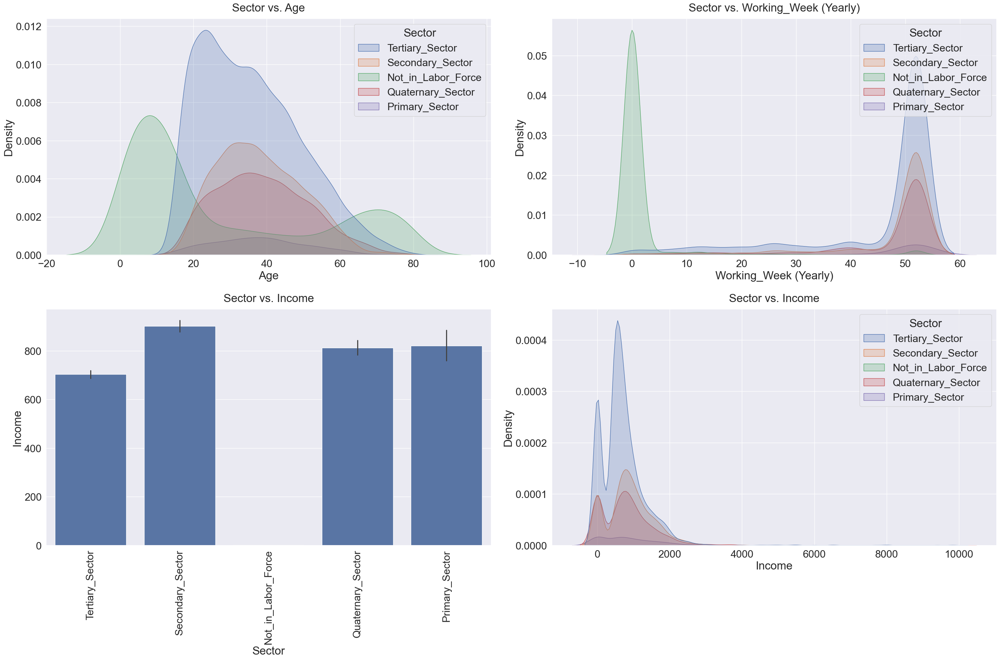

In [572]:
f, ax = plt.subplots(2, 2, figsize = (30, 20))

# Sector vs. Age
sns.kdeplot(x = 'Age', hue = 'Sector', data = train, fill = True, ax = ax[0,0])
ax[0,0].set_title('Sector vs. Age', y = 1.02)

# Sector vs. Working_Week (Yearly)
sns.kdeplot(x = 'Working_Week (Yearly)', hue = 'Sector', data = train, fill = True, ax = ax[0,1])
ax[0,1].set_title('Sector vs. Working_Week (Yearly)', y = 1.02)

# Sector vs. Age
sns.barplot(x = 'Sector', y = 'Income', data = train, ax = ax[1,0])
ax[1,0].set_title('Sector vs. Income', y = 1.02)
ax[1, 0].tick_params(axis='x', rotation=90)

sns.kdeplot(x = 'Income', hue = 'Sector', data = train, fill = True, ax = ax[1,1])
ax[1,1].set_title('Sector vs. Income', y = 1.02)

plt.tight_layout()

Not_in_Labor_Force인데 Working_Week이 있는 경우는 직업군인으로 생각할 수 있다.

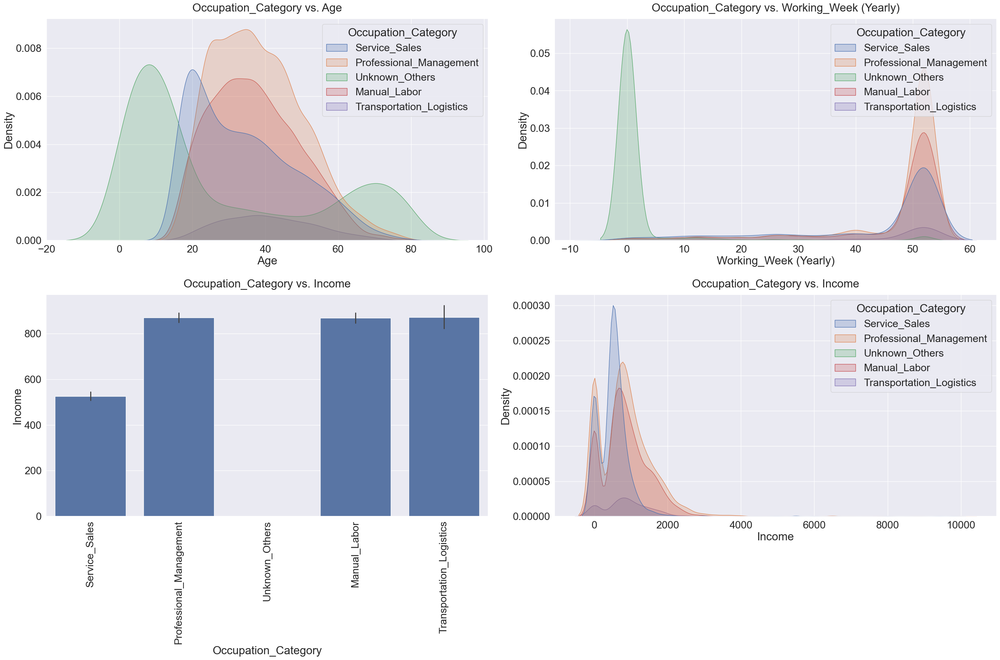

In [573]:
f, ax = plt.subplots(2, 2, figsize = (30, 20))

# Occupation_Category vs. Age
sns.kdeplot(x = 'Age', hue = 'Occupation_Category', data = train, fill = True, ax = ax[0,0])
ax[0,0].set_title('Occupation_Category vs. Age', y = 1.02)

# Occupation_Category vs. Working_Week (Yearly)
sns.kdeplot(x = 'Working_Week (Yearly)', hue = 'Occupation_Category', data = train, fill = True, ax = ax[0,1])
ax[0,1].set_title('Occupation_Category vs. Working_Week (Yearly)', y = 1.02)

# Occupation_Category vs. Age
sns.barplot(x = 'Occupation_Category', y = 'Income', data = train, ax = ax[1,0])
ax[1,0].set_title('Occupation_Category vs. Income', y = 1.02)
ax[1, 0].tick_params(axis='x', rotation=90)

sns.kdeplot(x = 'Income', hue = 'Occupation_Category', data = train, fill = True, ax = ax[1,1])
ax[1,1].set_title('Occupation_Category vs. Income', y = 1.02)

plt.tight_layout()

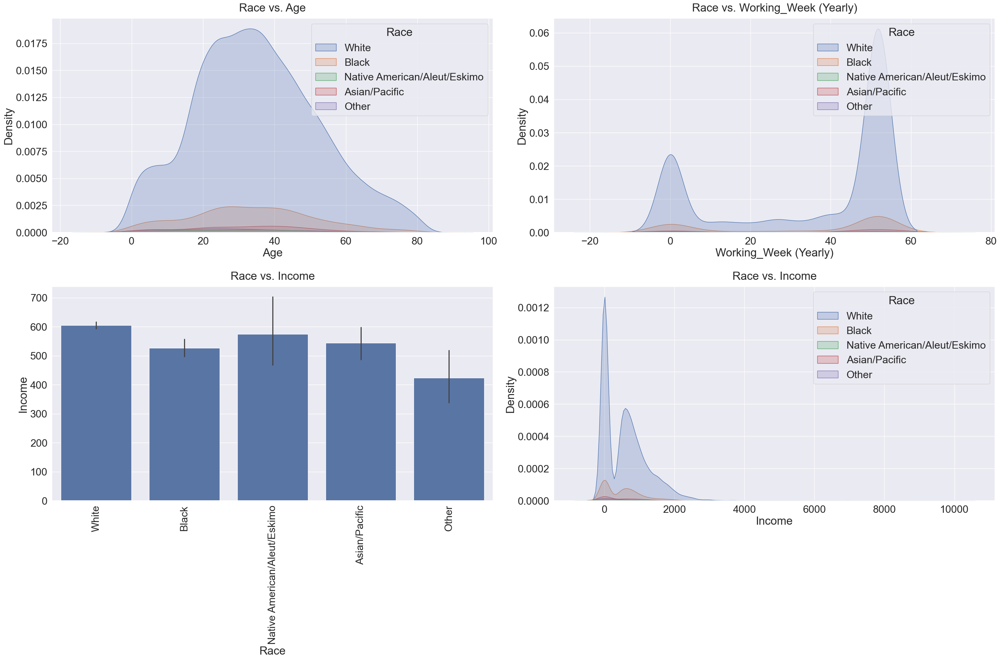

In [574]:
f, ax = plt.subplots(2, 2, figsize = (30, 20))

# Race vs. Age
sns.kdeplot(x = 'Age', hue = 'Race', data = train, fill = True, ax = ax[0,0])
ax[0,0].set_title('Race vs. Age', y = 1.02)

# Race vs. Working_Week (Yearly)
sns.kdeplot(x = 'Working_Week (Yearly)', hue = 'Race', data = train, fill = True, ax = ax[0,1])
ax[0,1].set_title('Race vs. Working_Week (Yearly)', y = 1.02)

# Race vs. Age
sns.barplot(x = 'Race', y = 'Income', data = train, ax = ax[1,0])
ax[1,0].set_title('Race vs. Income', y = 1.02)
ax[1, 0].tick_params(axis='x', rotation=90)

sns.kdeplot(x = 'Income', hue = 'Race', data = train, fill = True, ax = ax[1,1])
ax[1,1].set_title('Race vs. Income', y = 1.02)

plt.tight_layout()

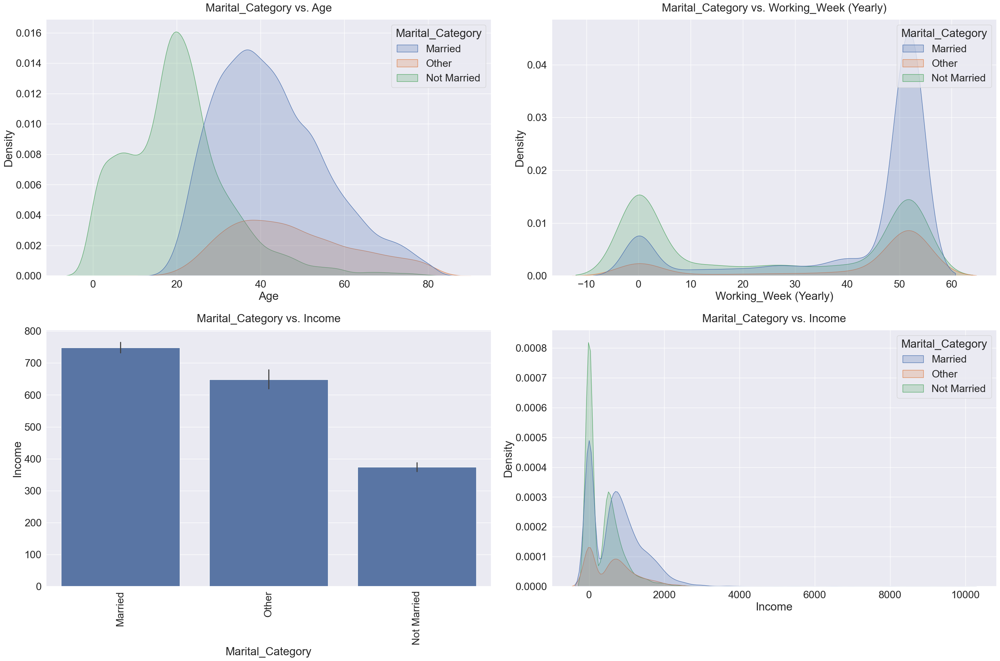

In [575]:
f, ax = plt.subplots(2, 2, figsize = (30, 20))

# Marital_Category vs. Age
sns.kdeplot(x = 'Age', hue = 'Marital_Category', data = train, fill = True, ax = ax[0,0])
ax[0,0].set_title('Marital_Category vs. Age', y = 1.02)

# Marital_Category vs. Working_Week (Yearly)
sns.kdeplot(x = 'Working_Week (Yearly)', hue = 'Marital_Category', data = train, fill = True, ax = ax[0,1])
ax[0,1].set_title('Marital_Category vs. Working_Week (Yearly)', y = 1.02)

# Race vs. Age
sns.barplot(x = 'Marital_Category', y = 'Income', data = train, ax = ax[1,0])
ax[1,0].set_title('Marital_Category vs. Income', y = 1.02)
ax[1, 0].tick_params(axis='x', rotation=90)

sns.kdeplot(x = 'Income', hue = 'Marital_Category', data = train, fill = True, ax = ax[1,1])
ax[1,1].set_title('Marital_Category vs. Income', y = 1.02)

plt.tight_layout()

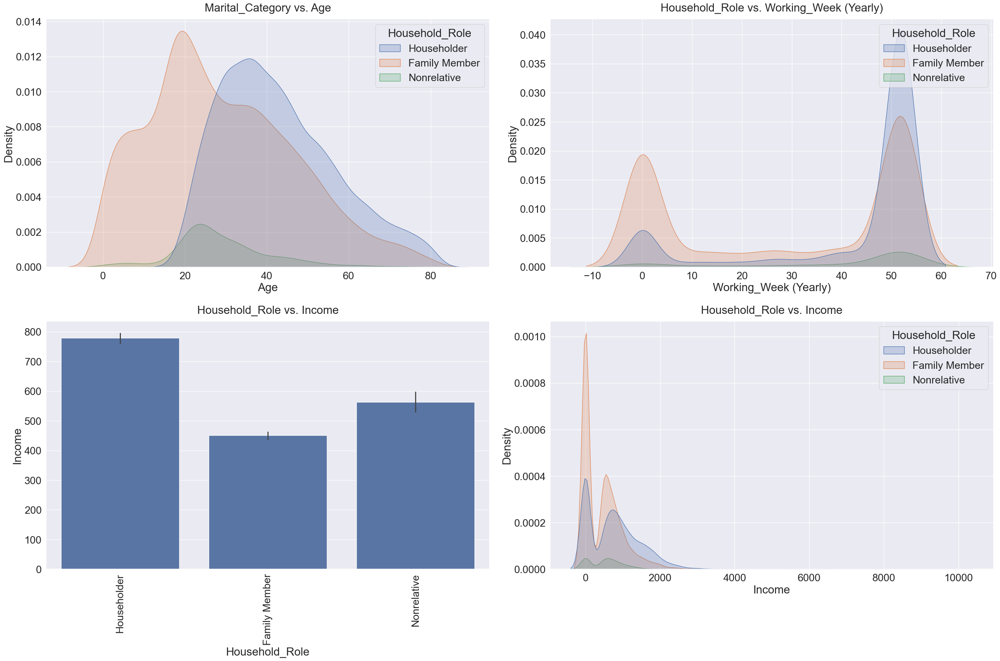

In [576]:
f, ax = plt.subplots(2, 2, figsize = (30, 20))

# Household_Role vs. Age
sns.kdeplot(x = 'Age', hue = 'Household_Role', data = train, fill = True, ax = ax[0,0])
ax[0,0].set_title('Marital_Category vs. Age', y = 1.02)

# Household_Role vs. Working_Week (Yearly)
sns.kdeplot(x = 'Working_Week (Yearly)', hue = 'Household_Role', data = train, fill = True, ax = ax[0,1])
ax[0,1].set_title('Household_Role vs. Working_Week (Yearly)', y = 1.02)

# Race vs. Age
sns.barplot(x = 'Household_Role', y = 'Income', data = train, ax = ax[1,0])
ax[1,0].set_title('Household_Role vs. Income', y = 1.02)
ax[1, 0].tick_params(axis='x', rotation=90)

sns.kdeplot(x = 'Income', hue = 'Household_Role', data = train, fill = True, ax = ax[1,1])
ax[1,1].set_title('Household_Role vs. Income', y = 1.02)

plt.tight_layout()

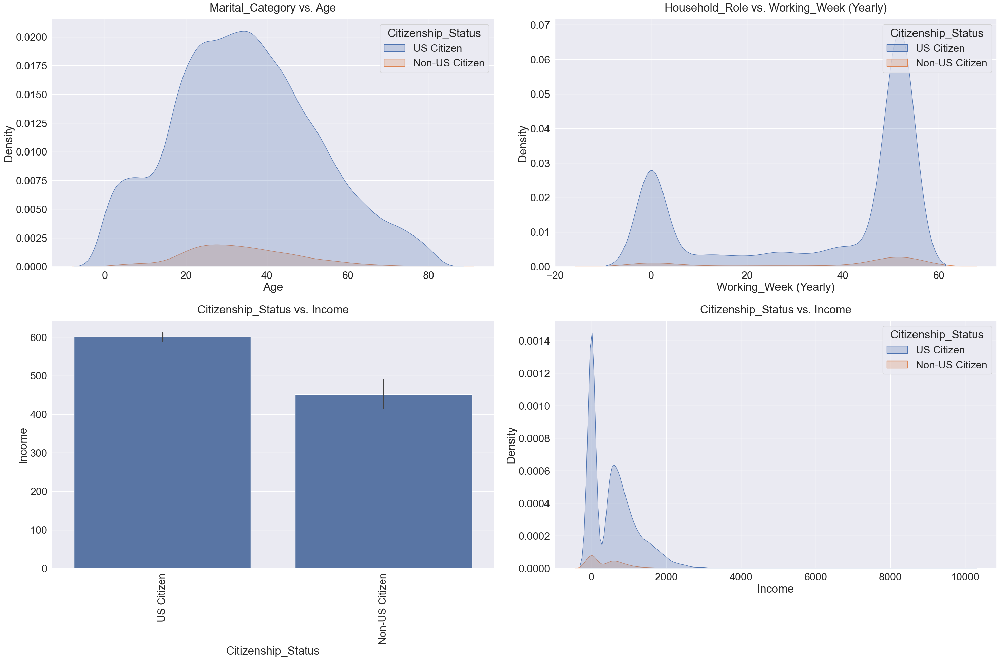

In [577]:
f, ax = plt.subplots(2, 2, figsize = (30, 20))

# Citizenship_Status vs. Age
sns.kdeplot(x = 'Age', hue = 'Citizenship_Status', data = train, fill = True, ax = ax[0,0])
ax[0,0].set_title('Marital_Category vs. Age', y = 1.02)

# Citizenship_Status vs. Working_Week (Yearly)
sns.kdeplot(x = 'Working_Week (Yearly)', hue = 'Citizenship_Status', data = train, fill = True, ax = ax[0,1])
ax[0,1].set_title('Household_Role vs. Working_Week (Yearly)', y = 1.02)

# Citizenship_Status vs. Age
sns.barplot(x = 'Citizenship_Status', y = 'Income', data = train, ax = ax[1,0])
ax[1,0].set_title('Citizenship_Status vs. Income', y = 1.02)
ax[1, 0].tick_params(axis='x', rotation=90)

sns.kdeplot(x = 'Income', hue = 'Citizenship_Status', data = train, fill = True, ax = ax[1,1])
ax[1,1].set_title('Citizenship_Status vs. Income', y = 1.02)

plt.tight_layout()

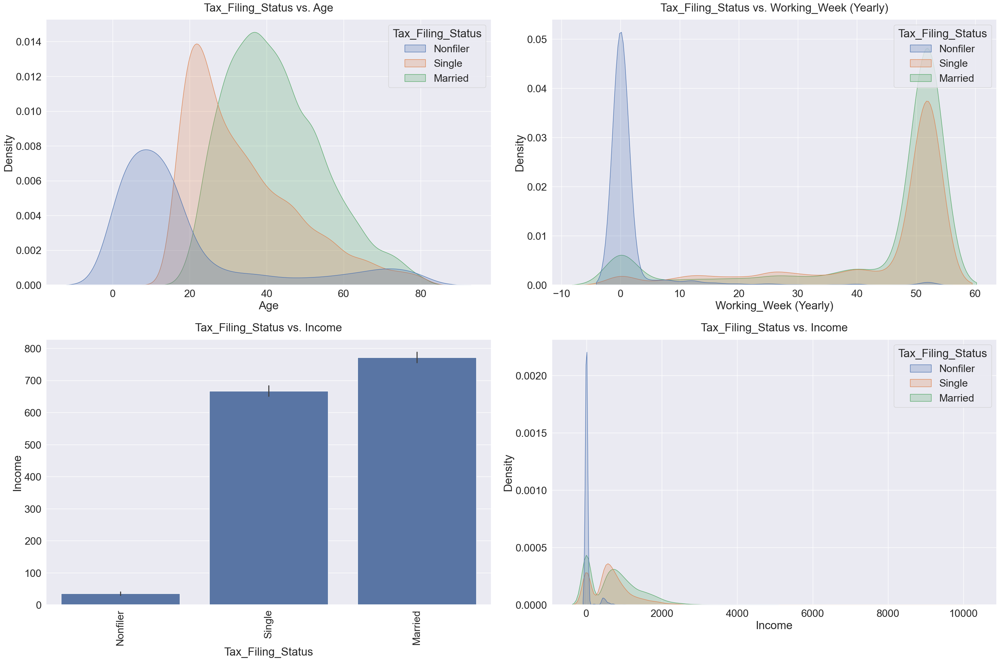

In [578]:
f, ax = plt.subplots(2, 2, figsize = (30, 20))

# Tax_Filing_Status vs. Age
sns.kdeplot(x = 'Age', hue = 'Tax_Filing_Status', data = train, fill = True, ax = ax[0,0])
ax[0,0].set_title('Tax_Filing_Status vs. Age', y = 1.02)

# Tax_Filing_Status vs. Working_Week (Yearly)
sns.kdeplot(x = 'Working_Week (Yearly)', hue = 'Tax_Filing_Status', data = train, fill = True, ax = ax[0,1])
ax[0,1].set_title('Tax_Filing_Status vs. Working_Week (Yearly)', y = 1.02)

# Tax_Filing_Status vs. Age
sns.barplot(x = 'Tax_Filing_Status', y = 'Income', data = train, ax = ax[1,0])
ax[1,0].set_title('Tax_Filing_Status vs. Income', y = 1.02)
ax[1, 0].tick_params(axis='x', rotation=90)

sns.kdeplot(x = 'Income', hue = 'Tax_Filing_Status', data = train, fill = True, ax = ax[1,1])
ax[1,1].set_title('Tax_Filing_Status vs. Income', y = 1.02)

plt.tight_layout()

### Min-Max Scaling, 데이터 준비

In [579]:
train.columns

Index(['Age', 'Gender', 'Education_Status', 'Employment_Status',
       'Working_Week (Yearly)', 'Industry_Status', 'Occupation_Status', 'Race',
       'Martial_Status', 'Household_Summary', 'Citizenship', 'Tax_Status',
       'Gains', 'Losses', 'Dividends', 'Income_Status', 'Income',
       'Net Capital Gain', 'Investment Income', 'Education_Level',
       'Employment_Binary', 'Sector', 'Occupation_Category',
       'Marital_Category', 'Household_Role', 'Citizenship_Status',
       'Tax_Filing_Status'],
      dtype='object')

우선 사용할 데이터만 골라내자.

In [580]:
train.drop(['Education_Status', 'Industry_Status', 'Occupation_Status', 
            'Martial_Status', 'Household_Summary', 'Citizenship', 
            'Tax_Status', 'Gains', 'Losses', 'Dividends', 'Net Capital Gain', 'Investment Income'], axis=1, inplace=True)
test.drop(['Education_Status', 'Industry_Status', 'Occupation_Status', 
            'Martial_Status', 'Household_Summary', 'Citizenship', 
            'Tax_Status', 'Gains', 'Losses', 'Dividends'], axis=1, inplace=True)

In [581]:
train.columns

Index(['Age', 'Gender', 'Employment_Status', 'Working_Week (Yearly)', 'Race',
       'Income_Status', 'Income', 'Education_Level', 'Employment_Binary',
       'Sector', 'Occupation_Category', 'Marital_Category', 'Household_Role',
       'Citizenship_Status', 'Tax_Filing_Status'],
      dtype='object')

In [582]:
test.columns

Index(['Age', 'Gender', 'Employment_Status', 'Working_Week (Yearly)', 'Race',
       'Income_Status', 'Education_Level', 'Employment_Binary', 'Sector',
       'Occupation_Category', 'Marital_Category', 'Household_Role',
       'Citizenship_Status', 'Tax_Filing_Status'],
      dtype='object')

In [583]:
train

,Age,Gender,Employment_Status,Working_Week (Yearly),Race,Income_Status,Income,Education_Level,Employment_Binary,Sector,Occupation_Category,Marital_Category,Household_Role,Citizenship_Status,Tax_Filing_Status
0,63,M,Full-Time,4,White,Unknown,425,Middle_School,Employed,Tertiary_Sector,Service_Sales,Married,Householder,US Citizen,Nonfiler
1,37,M,Full-Time,52,White,Under Median,0,Associate_Degree,Employed,Tertiary_Sector,Service_Sales,Other,Householder,US Citizen,Single
2,58,F,Full-Time,52,Black,Under Median,860,High_School_Graduate,Employed,Secondary_Sector,Professional_Management,Married,Householder,US Citizen,Married
3,44,M,Full-Time,52,White,Under Median,850,High_School_Graduate,Employed,Tertiary_Sector,Professional_Management,Other,Householder,US Citizen,Single
4,37,F,Full-Time,52,White,Unknown,570,High_School_Graduate,Employed,Tertiary_Sector,Service_Sales,Other,Householder,US Citizen,Single
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,33,M,Children or Armed Forces,52,White,Under Median,1300,High_School_Graduate,Unemployed,Secondary_Sector,Manual_Labor,Not Married,Householder,US Citizen,Single
19996,20,F,Full-Time,12,White,Under Median,850,Undergraduate_Student,Employed,Quaternary_Sector,Professional_Management,Not Married,Family Member,US Citizen,Nonfiler
19997,22,M,Children or Armed Forces,52,White,Unknown,999,Undergraduate_Student,Unemployed,Tertiary_Sector,Professional_Management,Not Married,Nonrelative,US Citizen,Single
19998,76,F,Not Working,0,White,Under Median,0,High_School_Graduate,Unemployed,Not_in_Labor_Force,Unknown_Others,Other,Householder,US Citizen,Single


In [584]:
# pandas의 get_dummies 함수를 사용하여 원-핫 인코딩을 적용합니다.
train = pd.get_dummies(train)
train

,Age,Working_Week (Yearly),Income,Gender_F,Gender_M,Employment_Status_Children or Armed Forces,Employment_Status_Choice Part-Time,Employment_Status_Full-Time,Employment_Status_Not Working,Employment_Status_Part-Time (Usually Full-Time),Employment_Status_Part-Time (Usually Part-Time),Employment_Status_Seeking Full-Time,Employment_Status_Seeking Part-Time,Race_Asian/Pacific,Race_Black,Race_Native American/Aleut/Eskimo,Race_Other,Race_White,Income_Status_Over Median,Income_Status_Under Median,Income_Status_Unknown,Education_Level_Associate_Degree,Education_Level_Bachelor_Degree,Education_Level_Doctorate_Degree,Education_Level_Elementary,Education_Level_High_School,Education_Level_High_School_Graduate,Education_Level_Master_Degree,Education_Level_Middle_School,Education_Level_Preschool,Education_Level_Professional_Degree,Education_Level_Undergraduate_Student,Employment_Binary_Employed,Employment_Binary_Unemployed,Sector_Not_in_Labor_Force,Sector_Primary_Sector,Sector_Quaternary_Sector,Sector_Secondary_Sector,Sector_Tertiary_Sector,Occupation_Category_Manual_Labor,Occupation_Category_Professional_Management,Occupation_Category_Service_Sales,Occupation_Category_Transportation_Logistics,Occupation_Category_Unknown_Others,Marital_Category_Married,Marital_Category_Not Married,Marital_Category_Other,Household_Role_Family Member,Household_Role_Householder,Household_Role_Nonrelative,Citizenship_Status_Non-US Citizen,Citizenship_Status_US Citizen,Tax_Filing_Status_Married,Tax_Filing_Status_Nonfiler,Tax_Filing_Status_Single
0,63,4,425,False,True,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,True,False,False,True,False,False,True,False,False,False,True,False,False,True,False,True,False
1,37,52,0,False,True,False,False,True,False,False,False,False,False,False,False,False,False,True,False,True,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,True,False,False,False,False,True,False,True,False,False,True,False,False,True
2,58,52,860,True,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,True,False,False,True,False,False,False,True,False,False,False,True,False,False,True,True,False,False
3,44,52,850,False,True,False,False,True,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,True,False,True,False,False,False,False,False,True,False,True,False,False,True,False,False,True
4,37,52,570,True,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,True,False,False,True,False,False,False,False,True,False,True,False,False,True,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,33,52,1300,False,True,True,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,True,False,True,False,False,False,False,False,True,False,False,True,False,False,True,False,False,True
19996,20,12,850,True,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False,True,False,False,False,True,False,False,False,False,True,False,True,False,False,False,True,False,True,False
19997,22,52,999,False,True,True,False,False,False,

In [585]:

test = pd.get_dummies(test)
test

,Age,Working_Week (Yearly),Gender_F,Gender_M,Employment_Status_Children or Armed Forces,Employment_Status_Choice Part-Time,Employment_Status_Full-Time,Employment_Status_Not Working,Employment_Status_Part-Time (Usually Full-Time),Employment_Status_Part-Time (Usually Part-Time),Employment_Status_Seeking Full-Time,Employment_Status_Seeking Part-Time,Race_Asian/Pacific,Race_Black,Race_Native American/Aleut/Eskimo,Race_Other,Race_White,Income_Status_Over Median,Income_Status_Under Median,Income_Status_Unknown,Education_Level_Associate_Degree,Education_Level_Bachelor_Degree,Education_Level_Doctorate_Degree,Education_Level_Elementary,Education_Level_High_School,Education_Level_High_School_Graduate,Education_Level_Master_Degree,Education_Level_Middle_School,Education_Level_Preschool,Education_Level_Professional_Degree,Education_Level_Undergraduate_Student,Employment_Binary_Employed,Employment_Binary_Unemployed,Sector_Not_in_Labor_Force,Sector_Primary_Sector,Sector_Quaternary_Sector,Sector_Secondary_Sector,Sector_Tertiary_Sector,Occupation_Category_Manual_Labor,Occupation_Category_Professional_Management,Occupation_Category_Service_Sales,Occupation_Category_Transportation_Logistics,Occupation_Category_Unknown_Others,Marital_Category_Married,Marital_Category_Not Married,Marital_Category_Other,Household_Role_Family Member,Household_Role_Householder,Household_Role_Nonrelative,Citizenship_Status_Non-US Citizen,Citizenship_Status_US Citizen,Tax_Filing_Status_Married,Tax_Filing_Status_Nonfiler,Tax_Filing_Status_Single
0,79,0,False,True,True,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,True,True,False,False,False,False,False,False,False,False,True,False,True,False,False,True,False,False,True,False,False,True
1,47,0,False,True,True,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,True,True,False,False,False,False,False,False,False,False,True,False,True,False,True,False,False,False,True,False,True,False
2,18,52,True,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,True,False,False,False,True,False,True,False,False,False,True,False,False,True
3,39,30,True,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,True,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,True,False,False,True,False,False,True,False,False,False,True,True,False,False
4,6,0,False,True,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,True,True,False,False,False,False,False,False,False,False,True,False,True,False,True,False,False,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,31,52,False,True,True,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False,False,True,False,False,False,False,True,False,False,True,False,False,True,False,False,True
9996,27,52,False,True,True,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,True,True,False,False,False,False,True,False,False,False,True,False,False,True,True,False,False
9997,18,7,False,True,True,False,False,False,False,False,False,False,False,True,False,False,Fa

In [586]:
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

# 원본 데이터프레임의 컬럼 이름을 저장합니다.
columns = train.columns

# MinMaxScaler 객체를 생성합니다.
scaler = MinMaxScaler()

# 수치형 데이터에 대해 MinMax Scaling을 적용합니다.
scaled_data = scaler.fit_transform(train)

# 스케일링된 데이터를 데이터프레임으로 변환합니다. 여기서 columns 변수를 사용합니다.
train_scaled = pd.DataFrame(scaled_data, columns=columns)

# 스케일링된 데이터프레임의 처음 몇 행을 출력합니다.
train_scaled.head()

,Age,Working_Week (Yearly),Income,Gender_F,Gender_M,Employment_Status_Children or Armed Forces,Employment_Status_Choice Part-Time,Employment_Status_Full-Time,Employment_Status_Not Working,Employment_Status_Part-Time (Usually Full-Time),Employment_Status_Part-Time (Usually Part-Time),Employment_Status_Seeking Full-Time,Employment_Status_Seeking Part-Time,Race_Asian/Pacific,Race_Black,Race_Native American/Aleut/Eskimo,Race_Other,Race_White,Income_Status_Over Median,Income_Status_Under Median,Income_Status_Unknown,Education_Level_Associate_Degree,Education_Level_Bachelor_Degree,Education_Level_Doctorate_Degree,Education_Level_Elementary,Education_Level_High_School,Education_Level_High_School_Graduate,Education_Level_Master_Degree,Education_Level_Middle_School,Education_Level_Preschool,Education_Level_Professional_Degree,Education_Level_Undergraduate_Student,Employment_Binary_Employed,Employment_Binary_Unemployed,Sector_Not_in_Labor_Force,Sector_Primary_Sector,Sector_Quaternary_Sector,Sector_Secondary_Sector,Sector_Tertiary_Sector,Occupation_Category_Manual_Labor,Occupation_Category_Professional_Management,Occupation_Category_Service_Sales,Occupation_Category_Transportation_Logistics,Occupation_Category_Unknown_Others,Marital_Category_Married,Marital_Category_Not Married,Marital_Category_Other,Household_Role_Family Member,Household_Role_Householder,Household_Role_Nonrelative,Citizenship_Status_Non-US Citizen,Citizenship_Status_US Citizen,Tax_Filing_Status_Married,Tax_Filing_Status_Nonfiler,Tax_Filing_Status_Single
0,0.777778,0.076923,0.042504,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
1,0.456790,1.000000,0.000000,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
2,0.716049,1.000000,0.086009,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0
3,0.543210,1.000000,0.085009,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
4,0.456790,1.000000,0.057006,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0


In [587]:
# MinMaxScaler 객체를 생성합니다.
scaler = MinMaxScaler()

# 원본 데이터프레임의 컬럼 이름을 저장합니다.
columns = test.columns

# 수치형 데이터에 대해 MinMax Scaling을 적용합니다.
scaled_test = scaler.fit_transform(test)

# 스케일링된 데이터를 데이터프레임으로 변환합니다. 이때 columns 변수를 사용합니다.
test_scaled = pd.DataFrame(scaled_test, columns=columns)

# 스케일링된 데이터프레임의 처음 몇 행을 출력합니다.
test_scaled.head()

,Age,Working_Week (Yearly),Gender_F,Gender_M,Employment_Status_Children or Armed Forces,Employment_Status_Choice Part-Time,Employment_Status_Full-Time,Employment_Status_Not Working,Employment_Status_Part-Time (Usually Full-Time),Employment_Status_Part-Time (Usually Part-Time),Employment_Status_Seeking Full-Time,Employment_Status_Seeking Part-Time,Race_Asian/Pacific,Race_Black,Race_Native American/Aleut/Eskimo,Race_Other,Race_White,Income_Status_Over Median,Income_Status_Under Median,Income_Status_Unknown,Education_Level_Associate_Degree,Education_Level_Bachelor_Degree,Education_Level_Doctorate_Degree,Education_Level_Elementary,Education_Level_High_School,Education_Level_High_School_Graduate,Education_Level_Master_Degree,Education_Level_Middle_School,Education_Level_Preschool,Education_Level_Professional_Degree,Education_Level_Undergraduate_Student,Employment_Binary_Employed,Employment_Binary_Unemployed,Sector_Not_in_Labor_Force,Sector_Primary_Sector,Sector_Quaternary_Sector,Sector_Secondary_Sector,Sector_Tertiary_Sector,Occupation_Category_Manual_Labor,Occupation_Category_Professional_Management,Occupation_Category_Service_Sales,Occupation_Category_Transportation_Logistics,Occupation_Category_Unknown_Others,Marital_Category_Married,Marital_Category_Not Married,Marital_Category_Other,Household_Role_Family Member,Household_Role_Householder,Household_Role_Nonrelative,Citizenship_Status_Non-US Citizen,Citizenship_Status_US Citizen,Tax_Filing_Status_Married,Tax_Filing_Status_Nonfiler,Tax_Filing_Status_Single
0,0.877778,0.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
1,0.522222,0.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,0.200000,1.000000,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,0.433333,0.576923,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
4,0.066667,0.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


# 3. Machine Learning

In [588]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
model_lr = LinearRegression()

from sklearn.linear_model import Ridge
model_rg = Ridge()

from sklearn.linear_model import Lasso
model_ls = Lasso()

from sklearn.linear_model import ElasticNet
model_en = ElasticNet(alpha=1)

from sklearn.ensemble import RandomForestRegressor
model_rf = RandomForestRegressor()

from xgboost import XGBRegressor
model_xg = XGBRegressor()

from sklearn.metrics import mean_squared_error

In [589]:
X = train.drop('Income', axis=1)
y = train['Income']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=15)

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(14670, 54) (14670,)
(3668, 54) (3668,)


## Linear Regression

In [590]:
from sklearn.metrics import mean_squared_error
import numpy as np

# 머신러닝
model_lr.fit(X_train, y_train)
pred = model_lr.predict(X_test)
mean_squared_error(y_test, pred)

# 평가
mse_lr = mean_squared_error(y_test, pred)
rmse_lr = np.sqrt(mean_squared_error(y_test, pred))

print("MSE:", mse_lr.round(2))
print("RMSE:", rmse_lr.round(2))

MSE: 403473.75
RMSE: 635.2


## Ridge

In [591]:
# 머신러닝
model_rg.fit(X_train, y_train)
pred = model_rg.predict(X_test)
mean_squared_error(y_test, pred)

# 평가
mse_rg = mean_squared_error(y_test, pred)
rmse_rg = np.sqrt(mean_squared_error(y_test, pred))

print("MSE:", mse_rg.round(2))
print("RMSE:", rmse_rg.round(2))

MSE: 403461.26
RMSE: 635.19


## Lasso

In [592]:
# 머신러닝
model_ls.fit(X_train, y_train)
pred = model_ls.predict(X_test)
mean_squared_error(y_test, pred)

# 평가
mse_ls = mean_squared_error(y_test, pred)
rmse_ls = np.sqrt(mean_squared_error(y_test, pred))

print("mse:", mse_ls.round(2), "\nrmse:", rmse_ls.round(2))

mse: 402938.52 
rmse: 634.77


## ElasticNet

In [593]:
# 머신러닝
model_en.fit(X_train, y_train)
pred = model_en.predict(X_test)
mean_squared_error(y_test, pred)

# 평가
mse_en = mean_squared_error(y_test, pred)
rmse_en = np.sqrt(mean_squared_error(y_test, pred))

print("mse:", mse_en.round(2), "\nrmse:", rmse_en.round(2))

mse: 426004.09 
rmse: 652.69


## Random Forest

In [594]:
model_rf.fit(X_train, y_train)
pred = model_rf.predict(X_test)

# 평가
mse_rf = mean_squared_error(y_test, pred)
rmse_rf = np.sqrt(mean_squared_error(y_test, pred))

print("mse:", mse_rf.round(2), "\nrmse:", rmse_rf.round(2))

mse: 465820.23 
rmse: 682.51


## XGBoost

In [595]:
# 머신러닝
model_xg.fit(X_train, y_train)
pred = model_xg.predict(X_test)
mean_squared_error(y_test, pred)

# 평가
mse_xg = mean_squared_error(y_test, pred)
rmse_xg = np.sqrt(mean_squared_error(y_test, pred))

print("mse:", mse_xg.round(2), "\nrmse:", rmse_xg.round(2))

mse: 437877.69 
rmse: 661.72


In [596]:
### 결과 비교

# Model names and their abbreviations
models = ['lr', 'rg', 'ls', 'en', 'rf', 'xg']
model_names = ["Linear Regression", "Ridge", "Lasso", "ElasticNet", "Random Forest", "XGBoost"]

# Initialize empty lists to store results
full_mse, full_rmse = [], []

# Loop over each model to collect its metrics for sampling and full data
for model in models:
    full_mse.append(globals()[f'mse_{model}'])
    full_rmse.append(globals()[f'rmse_{model}'])

# Creating DataFrames
df_full_data_dynamic = pd.DataFrame({
    "Model": model_names,
    "MSE": full_mse,
    "RMSE": full_rmse
})

df_full_data_dynamic

,Model,MSE,RMSE
0,Linear Regression,403473.745277,635.195832
1,Ridge,403461.256019,635.186001
2,Lasso,402938.520459,634.774385
3,ElasticNet,426004.088005,652.689887
4,Random Forest,465820.227633,682.510240
5,XGBoost,437877.688017,661.723271


# Hyperparameter Tuning

In [597]:
# # 하이퍼파라미터 랜덤 서치
# params={'learning_rate':[0.07, 0.05, 0.01, 0.001], 
#         'max_depth':[3, 5, 7, 9, 12], 
#         'n_estimators':[100, 200, 300],
#         'subsample':[0.9, 0.8, 0.7, 0.6, 0.5]
#         }

# # RandomSearch 실습
# from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
# xgb = XGBRegressor()
# grid = RandomizedSearchCV(xgb, params, cv=5, n_iter=10, n_jobs=-1)
# grid.fit(X, y)

# grid.best_params_

In [598]:
xgb = XGBRegressor(
    learning_rate = 0.07,
    max_depth = 5,
    n_estimators = 100,
    subsample = 0.8
)
xgb.fit(X_train, y_train)
pred = xgb.predict(X_test)
mse_xg = mean_squared_error(y_test, pred)
rmse_xg = np.sqrt(mean_squared_error(y_test, pred))

print("mse:", mse_xg.round(2), "\nrmse:", rmse_xg.round(2))


mse: 399762.06 
rmse: 632.27


In [599]:
# # 하이퍼파라미터 그리드서치
# params={'learning_rate':[0.07, 0.05, 0.01, 0.001], 
#         'max_depth':[3, 5, 7, 9, 12], 
#         'n_estimators':[100, 200, 300],
#         'subsample':[0.9, 0.8, 0.7, 0.6, 0.5]
#         }

# # RandomSearch 실습
# from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
# xgb = XGBRegressor()
# grid = GridSearchCV(xgb, params, cv=5, n_jobs=-1)
# grid.fit(X, y)

# grid.best_params_

In [600]:
xgb = XGBRegressor(
    learning_rate = 0.05,
    max_depth = 5,
    n_estimators = 100,
    subsample = 0.9
)
xgb.fit(X_train, y_train)
pred = xgb.predict(X_test)
mse_xg = mean_squared_error(y_test, pred)
rmse_xg = np.sqrt(mean_squared_error(y_test, pred))

print("mse:", mse_xg.round(2), "\nrmse:", rmse_xg.round(2))


mse: 399782.1 
rmse: 632.28


# 4. Deep learning

## MLP (multi-layer perceptron)

In [601]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense

# RMSE 손실 함수 정의
def rmse_loss(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_pred - y_true)))

model = Sequential()
model.add(Dense(128, activation='relu', input_shape=(54,)))
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='linear'))

model.compile(optimizer='adam', loss='mean_squared_error', metrics=[rmse_loss])

model.summary()


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 128)            │         7,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,361 (60.00 KB)

 Trainable params: 15,361 (60.00 KB)

 Non-trainable params: 0 (0.00 B)

In [602]:
from keras import backend as K

def rmse_loss(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

In [603]:
X_train = X_train.astype('float32')
y_train = y_train.astype('float32')
X_test = X_test.astype('float32')
y_test = y_test.astype('float32')

In [604]:
from keras.callbacks import EarlyStopping

# EarlyStopping 콜백 초기화
early_stopping = EarlyStopping(monitor='val_rmse', # 모니터링할 값
                               patience=10,       # 10 에폭 동안 개선이 없으면 중단
                               verbose=1,         # 로그를 출력
                               mode='min',        # 'min' 모니터링 지표의 감소를 관찰
                               restore_best_weights=True) # 가장 좋은 모델의 가중치를 복원

# 모델 학습
history = model.fit(X_train, y_train,
                    epochs=100,
                    batch_size=32,
                    validation_data=(X_test, y_test),
                    callbacks=[early_stopping]) # 콜백 목록에 추가


Epoch 1/100
459/459 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 537549.7500 - rmse_loss: 683.9935 - val_loss: 431037.0312 - val_rmse_loss: 596.5380
Epoch 2/100
459/459 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 364693.4062 - rmse_loss: 559.6659 - val_loss: 418355.5938 - val_rmse_loss: 588.2040
Epoch 3/100
459/459 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 394907.4062 - rmse_loss: 568.8127 - val_loss: 410769.6562 - val_rmse_loss: 582.7226
Epoch 4/100
459/459 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 392245.0000 - rmse_loss: 567.9661 - val_loss: 406546.7188 - val_rmse_loss: 575.2743
Epoch 5/100
459/459 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 317824.3125 - rmse_loss: 529.4885 - val_loss: 402493.6250 - val_rmse_loss: 573.3743
Epoch 6/100
459/459 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 348690.9375 - rmse_loss: 537.8325 - val_loss: 404085.1875 - val_rmse_loss: 572.7206
Epoch 7/100
459/459 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 355306.4375 - rmse_loss: 542.0200 - val_loss: 401093.4688 - val_rmse_

In [ ]:
import matplotlib.pyplot as plt

history_dict = history.history

# 손실(loss)과 검증 손실(val_loss) 가져오기
loss = history_dict['loss']
val_loss = history_dict['val_loss']

# RMSE와 검증 RMSE 가져오기
rmse_loss = history_dict['rmse_loss']  # 메트릭 이름을 로그와 동일하게 맞춤
val_rmse_loss = history_dict['val_rmse_loss']

# 에폭스 설정
epochs = range(1, len(loss) + 1)

# 그래프 그리기 시작
plt.figure(figsize=(14, 10))

# 1행 1열에 훈련 손실 그래프
plt.subplot(2, 2, 1)
plt.plot(epochs, loss, 'bo-', label='Training Loss')
plt.title('Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# 1행 2열에 검증 손실 그래프
plt.subplot(2, 2, 2)
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.title('Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# 2행 1열에 훈련 RMSE 그래프
plt.subplot(2, 2, 3)
plt.plot(epochs, rmse_loss, 'bo-', label='Training RMSE')
plt.title('Training RMSE')
plt.xlabel('Epochs')
plt.ylabel('RMSE')
plt.legend()

# 2행 2열에 검증 RMSE 그래프
plt.subplot(2, 2, 4)
plt.plot(epochs, val_rmse_loss, 'ro-', label='Validation RMSE')
plt.title('Validation RMSE')
plt.xlabel('Epochs')
plt.ylabel('RMSE')
plt.legend()

# 레이아웃 조정
plt.tight_layout()
plt.show()

In [ ]:
model.evaluate(X_test, y_test)

In [ ]:
from keras.layers import BatchNormalization, Dropout
from keras import backend as K

def rmse_loss(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_pred - y_true)))

model = Sequential()
model.add(Dense(128, activation='relu', input_shape=(54,)))
model.add(BatchNormalization())
model.add(Dropout(0.1))
model.add(Dense(64, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.1))
model.add(Dense(32, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.1))
model.add(Dense(1, activation='linear'))

model.compile(optimizer='adam', loss='mean_squared_error', metrics=[rmse_loss])

model.summary()

# EarlyStopping 콜백 초기화
early_stopping = EarlyStopping(monitor='val_rmse_loss', # 모니터링할 값
                               patience=10,       # 10 에폭 동안 개선이 없으면 중단
                               verbose=1,         # 로그를 출력
                               mode='min',        # 'min' 모니터링 지표의 감소를 관찰
                               restore_best_weights=True) # 가장 좋은 모델의 가중치를 복원

# 모델 학습
history = model.fit(X_train, y_train,
                    epochs=100,
                    batch_size=32,
                    validation_data=(X_test, y_test),
                    callbacks=[early_stopping]) # 콜백 목록에 추가

history_dict = history.history

# 손실(loss)과 검증 손실(val_loss) 가져오기
loss = history_dict['loss']
val_loss = history_dict['val_loss']

# RMSE와 검증 RMSE 가져오기
rmse_loss = history_dict['rmse_loss']  # 메트릭 이름을 로그와 동일하게 맞춤
val_rmse_loss = history_dict['val_rmse_loss']

# 에폭스 설정
epochs = range(1, len(loss) + 1)

# 그래프 그리기 시작
plt.figure(figsize=(14, 10))

# 1행 1열에 훈련 손실 그래프
plt.subplot(2, 2, 1)
plt.plot(epochs, loss, 'bo-', label='Training Loss')
plt.title('Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# 1행 2열에 검증 손실 그래프
plt.subplot(2, 2, 2)
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.title('Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# 2행 1열에 훈련 RMSE 그래프
plt.subplot(2, 2, 3)
plt.plot(epochs, rmse_loss, 'bo-', label='Training RMSE')
plt.title('Training RMSE')
plt.xlabel('Epochs')
plt.ylabel('RMSE')
plt.legend()

# 2행 2열에 검증 RMSE 그래프
plt.subplot(2, 2, 4)
plt.plot(epochs, val_rmse_loss, 'ro-', label='Validation RMSE')
plt.title('Validation RMSE')
plt.xlabel('Epochs')
plt.ylabel('RMSE')
plt.legend()

# 레이아웃 조정
plt.tight_layout()
plt.show()

model.evaluate(X_test, y_test)

In [ ]:
from keras.layers import BatchNormalization, Dropout
from keras import backend as K

def rmse_loss(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_pred - y_true)))

model = Sequential()
model.add(Dense(128, activation='relu', input_shape=(54,)))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(64, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(32, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(1, activation='linear'))

model.compile(optimizer='adam', loss='mean_squared_error', metrics=[rmse_loss])

model.summary()

# EarlyStopping 콜백 초기화
early_stopping = EarlyStopping(monitor='val_rmse_loss', # 모니터링할 값
                               patience=10,       # 10 에폭 동안 개선이 없으면 중단
                               verbose=1,         # 로그를 출력
                               mode='min',        # 'min' 모니터링 지표의 감소를 관찰
                               restore_best_weights=True) # 가장 좋은 모델의 가중치를 복원

# 모델 학습
history = model.fit(X_train, y_train,
                    epochs=100,
                    batch_size=32,
                    validation_data=(X_test, y_test),
                    callbacks=[early_stopping]) # 콜백 목록에 추가

history_dict = history.history

# 손실(loss)과 검증 손실(val_loss) 가져오기
loss = history_dict['loss']
val_loss = history_dict['val_loss']

# RMSE와 검증 RMSE 가져오기
rmse_loss = history_dict['rmse_loss']  # 메트릭 이름을 로그와 동일하게 맞춤
val_rmse_loss = history_dict['val_rmse_loss']

# 에폭스 설정
epochs = range(1, len(loss) + 1)

# 그래프 그리기 시작
plt.figure(figsize=(14, 10))

# 1행 1열에 훈련 손실 그래프
plt.subplot(2, 2, 1)
plt.plot(epochs, loss, 'bo-', label='Training Loss')
plt.title('Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# 1행 2열에 검증 손실 그래프
plt.subplot(2, 2, 2)
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.title('Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# 2행 1열에 훈련 RMSE 그래프
plt.subplot(2, 2, 3)
plt.plot(epochs, rmse_loss, 'bo-', label='Training RMSE')
plt.title('Training RMSE')
plt.xlabel('Epochs')
plt.ylabel('RMSE')
plt.legend()

# 2행 2열에 검증 RMSE 그래프
plt.subplot(2, 2, 4)
plt.plot(epochs, val_rmse_loss, 'ro-', label='Validation RMSE')
plt.title('Validation RMSE')
plt.xlabel('Epochs')
plt.ylabel('RMSE')
plt.legend()

# 레이아웃 조정
plt.tight_layout()
plt.show()

model.evaluate(X_test, y_test)

In [ ]:
import keras_tuner as kt
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from keras_tuner import RandomSearch, Objective

def model_builder(hp):
    model = Sequential()
    model.add(Dense(units=hp.Int('units_1', min_value=32, max_value=512, step=32), 
                    activation='relu', input_shape=(54,)))
    model.add(BatchNormalization())
    model.add(Dropout(rate=hp.Float('dropout_1', min_value=0.0, max_value=0.5, step=0.1)))
    
    model.add(Dense(units=hp.Int('units_2', min_value=32, max_value=512, step=32), activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(rate=hp.Float('dropout_2', min_value=0.0, max_value=0.5, step=0.1)))
    
    model.add(Dense(units=hp.Int('units_3', min_value=32, max_value=512, step=32), activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(rate=hp.Float('dropout_3', min_value=0.0, max_value=0.5, step=0.1)))
    
    model.add(Dense(1, activation='linear'))
    
    hp_learning_rate = hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='LOG')
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
                  loss='mean_squared_error',
                  metrics=[rmse_loss])
    
    return model

tuner = kt.RandomSearch(
    model_builder,
    objective=kt.Objective('val_rmse_loss', direction='min'),
    max_trials=5,  # The number of different configurations to try
    executions_per_trial=3,  # The number of models that should be built and fit for each trial
    directory='my_dir',  # Directory to store the search outputs
    project_name='keras_tuner_demo'
)

tuner.search(X_train, y_train, epochs=10, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Get the best hyperparameters.
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]


In [ ]:
# learning rate 조절